In [1]:
source("R/deconvolution.R")

Loading required package: pkgmaker

Loading required package: registry

Warning message:
“package ‘registry’ was built under R version 3.5.2”
Loading required package: NMF

Loading required package: rngtools

Loading required package: cluster

NMF - BioConductor layer [OK] | Shared memory capabilities [NO: bigmemory] | Cores 15/16

  To enable shared memory capabilities, try: install.extras('
NMF
')

Loading required package: csSAM

Loading required package: Rcpp

Loading required package: stringr

Warning message:
“package ‘stringr’ was built under R version 3.5.2”
Loading required package: GSEABase

Loading required package: annotate

Warning message:
“package ‘annotate’ was built under R version 3.5.2”
Loading required package: AnnotationDbi

Loading required package: stats4

Loading required package: IRanges

Loading required package: S4Vectors


Attaching package: ‘S4Vectors’


The following object is masked from ‘package:NMF’:

    nrun


The following object is masked from ‘pack

In [3]:
library(doSNOW)
library(foreach)

In [40]:
cores <- detectCores()
cl <- makeCluster(cores[1] - 6)
doSNOW::registerDoSNOW(cl)
cl

socket cluster with 10 nodes on host ‘localhost’

# GSE19830 (brain/liver/lung)

In [8]:
options(repr.plot.height = 6, repr.plot.width = 7, repr.plot.res = 150)

## Load, preprocess and analyze initial data

In [9]:
GSE19830.em <- ExpressionMix("GSE19830", verbose=TRUE)
print(dim(GSE19830.em))
print(annotation(GSE19830.em))
head(pData(GSE19830.em)[c("Brain", "Liver", "Lung")])

Loading dataset 'GSE19830' ... OK
  Features    Samples Components 
     31099         42          3 
[1] "rat2302.db"


,Brain,Liver,Lung
,<dbl>,<dbl>,<dbl>
GSM495209,0,100,0
GSM495210,0,100,0
GSM495211,0,100,0
GSM495212,100,0,0
GSM495213,100,0,0
GSM495214,100,0,0


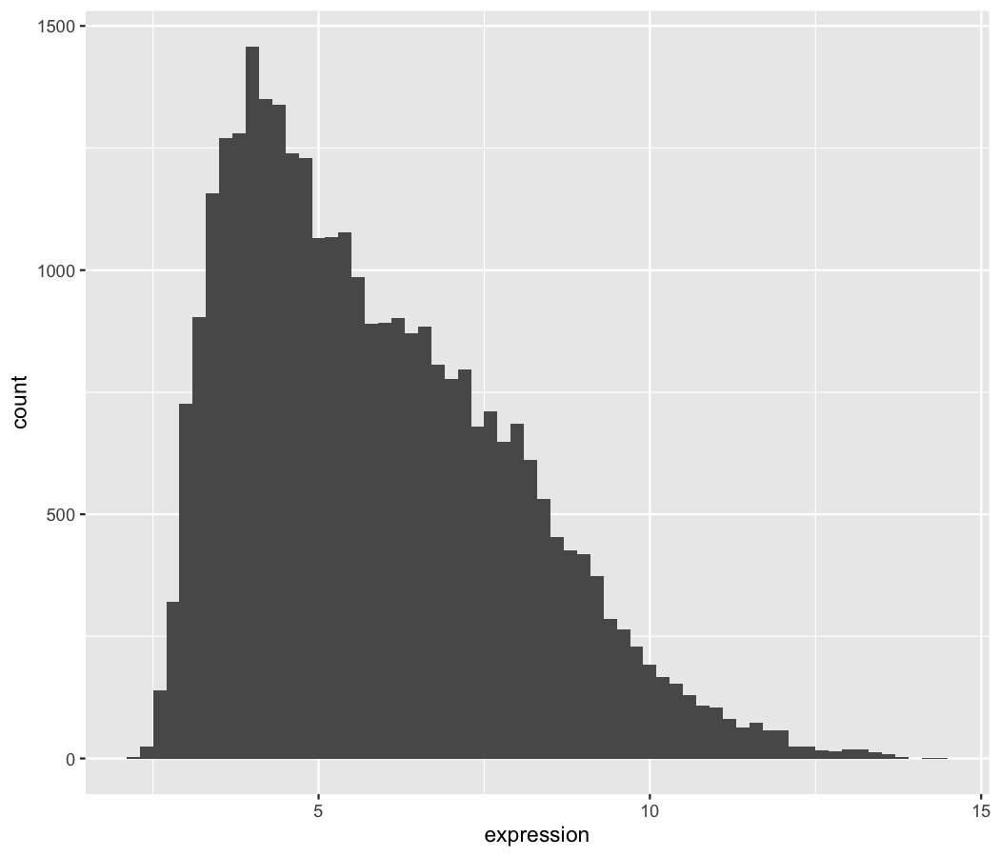

In [10]:
ggplot(data=data.frame(expression=exprs(GSE19830.em)[, 1]), aes(x=expression)) + geom_histogram(binwidth = 0.2)

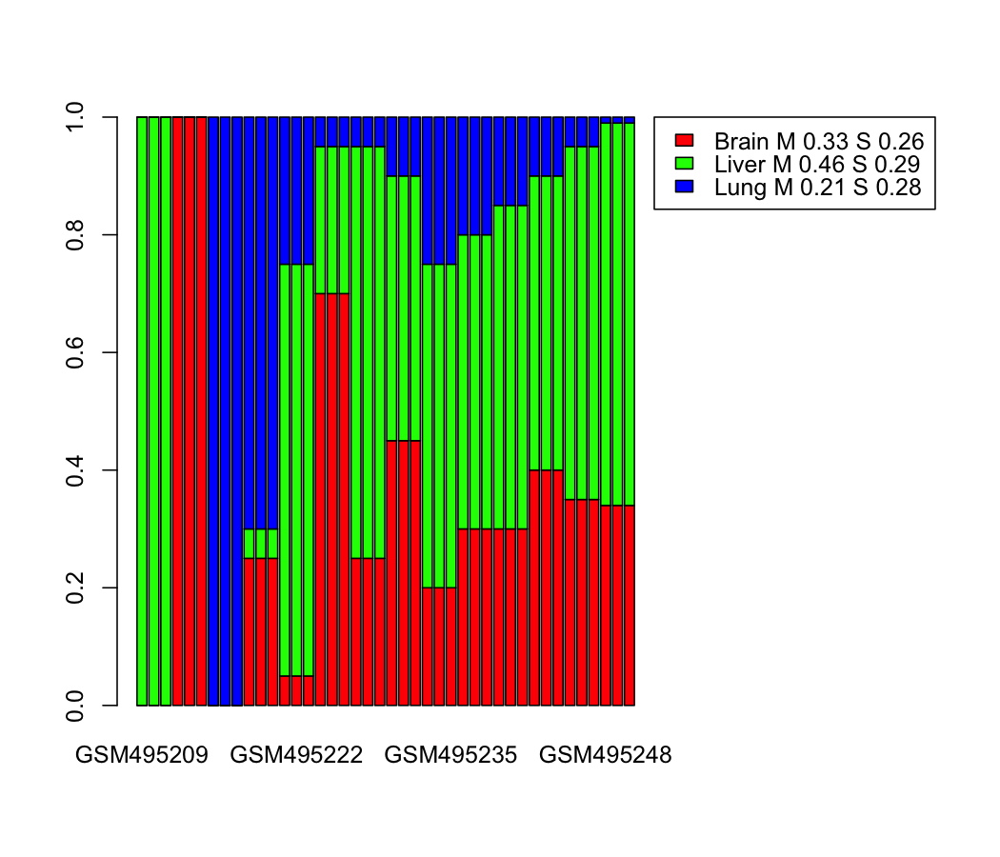

In [11]:
CellMix::propplot(GSE19830.em)

Extract mixed samples

,Brain,Liver,Lung
,<dbl>,<dbl>,<dbl>
GSM495218,25,5,70
GSM495219,25,5,70
GSM495220,25,5,70
GSM495221,5,70,25
GSM495222,5,70,25
GSM495223,5,70,25


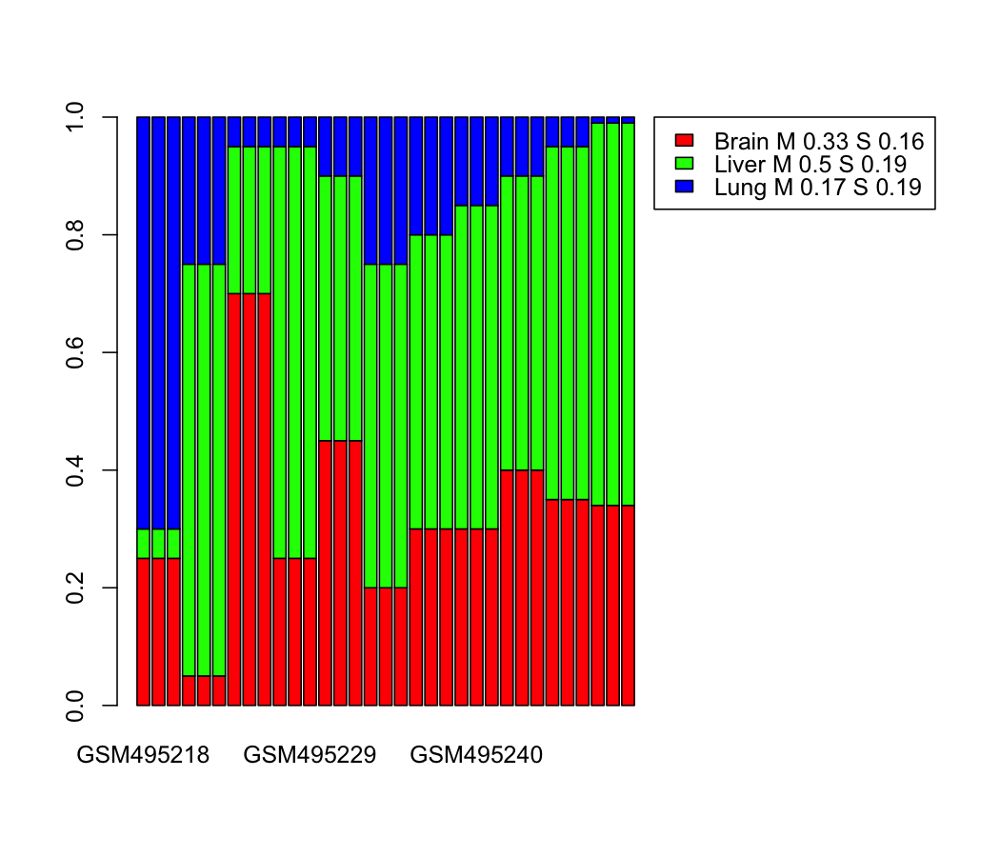

In [12]:
GSE19830.mix <- mixedSamples(GSE19830.em)
head(pData(GSE19830.mix)[c("Brain", "Liver", "Lung")])
propplot(GSE19830.mix)

Set ground truth variable

In [13]:
GSE19830.true <- coef(GSE19830.mix)

## Find markers via differential expression

In [14]:
GSE19830.ps <- pureSamples(GSE19830.em)

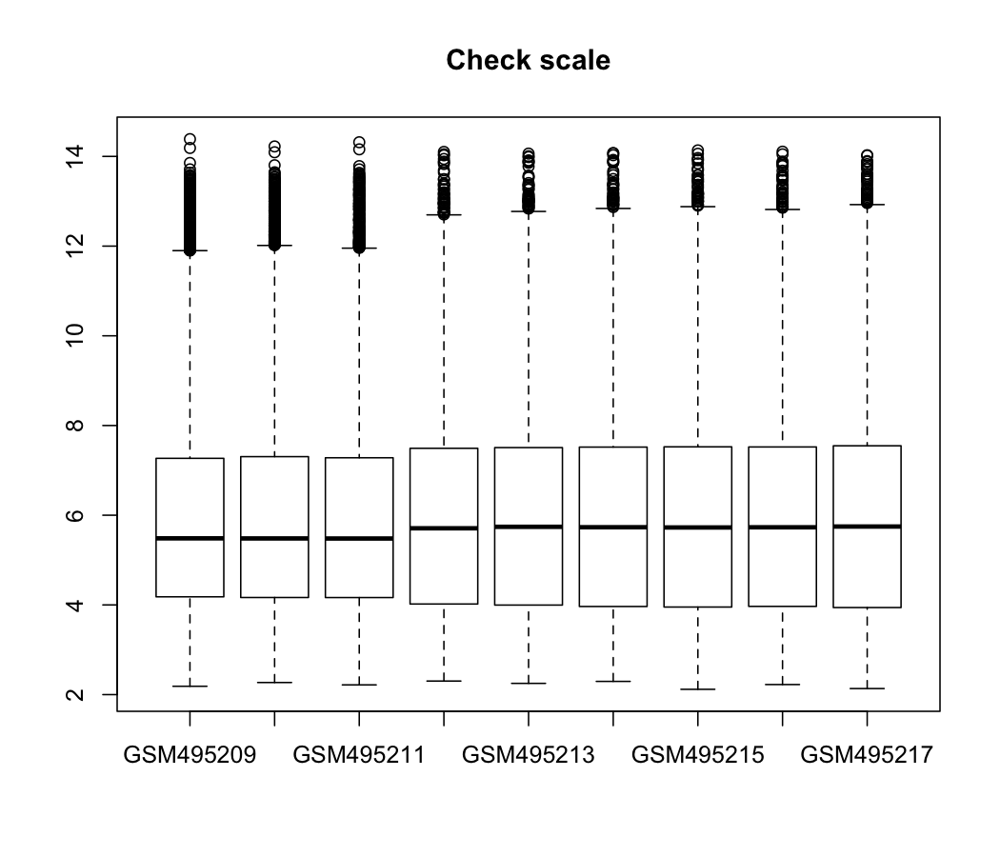

In [15]:
boxplot(exprs(GSE19830.ps), main = "Check scale")

Quantile normalize the data

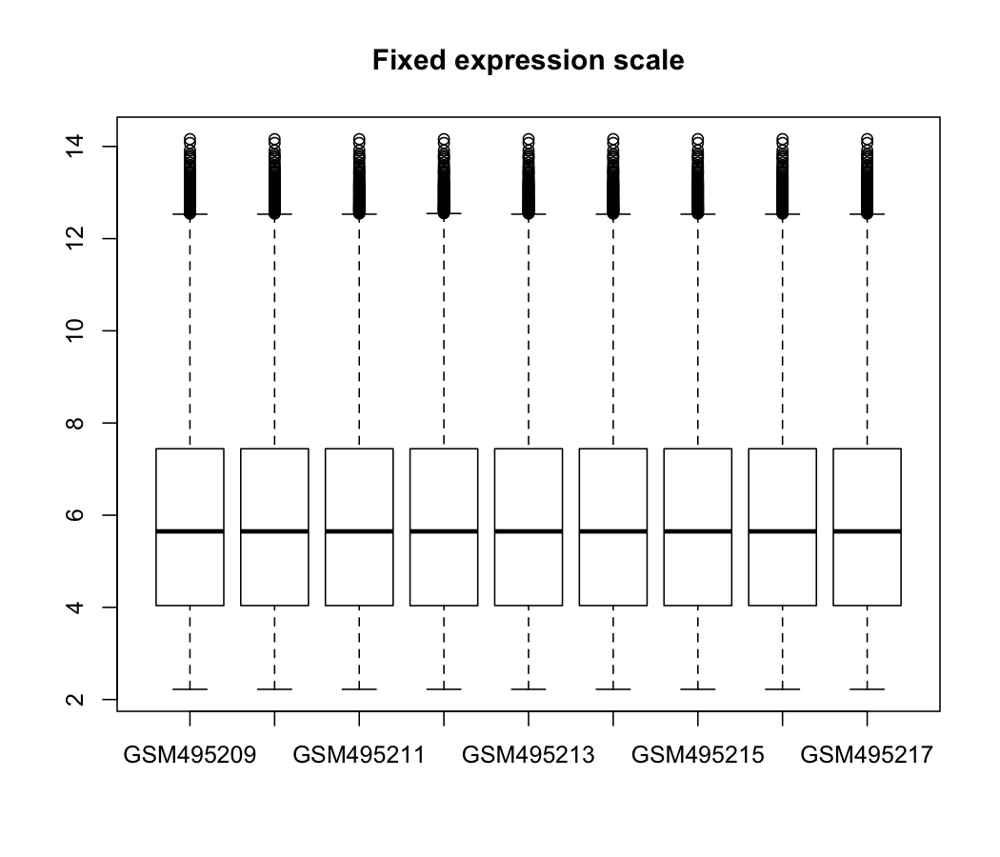

In [16]:
# Workaround for (apparently) a bug in CellMix, unable to set exprs(ExpressionMix)
GSE19830.ps.es <- eset(GSE19830.ps)
exprs(GSE19830.ps.es) <- normalizeBetweenArrays(exprs(GSE19830.ps.es), method="quantile")
pure <- GSE19830.ps@pure
GSE19830.ps <- ExpressionMix(GSE19830.ps.es, composition = GSE19830.ps)
GSE19830.ps@pure <- pure

boxplot(exprs(GSE19830.ps), main = "Fixed expression scale")

Note: using log2 + qnorm data for DE

In [17]:
# Filter phenotype data
pData(GSE19830.ps) <- (pData(GSE19830.ps)[, c("Brain", "Liver", "Lung")] / 100) %>%
    dplyr::mutate(tissue = pData(GSE19830.ps)[, "Type"]) %>%
    dplyr::mutate_all(as.factor)
colnames(pData(GSE19830.ps)) <- tolower(colnames(pData(GSE19830.ps)))
pData(GSE19830.ps)$tissue <- tolower(pData(GSE19830.ps)$tissue)
pData(GSE19830.ps)

# Filter feature data
fData(GSE19830.ps) <- fData(GSE19830.ps)[, c("ENTREZ_GENE_ID", "Gene Symbol")]

# Drop duplicates, annotate with mean expression and sort by it
GSE19830.ps.flt <- GSE19830.ps[!duplicated(fData(GSE19830.ps)$`ENTREZ_GENE_ID`), ]
fData(GSE19830.ps.flt)$mean_expression <- apply(exprs(GSE19830.ps.flt), 1, mean)
GSE19830.ps.flt <- GSE19830.ps.flt[order(fData(GSE19830.ps.flt)$mean_expression, decreasing = TRUE), ]

,brain,liver,lung,tissue
,<fct>,<fct>,<fct>,<chr>
GSM495209,0,1,0,liver
GSM495210,0,1,0,liver
GSM495211,0,1,0,liver
GSM495212,1,0,0,brain
GSM495213,1,0,0,brain
GSM495214,1,0,0,brain
GSM495215,0,0,1,lung
GSM495216,0,0,1,lung
GSM495217,0,0,1,lung


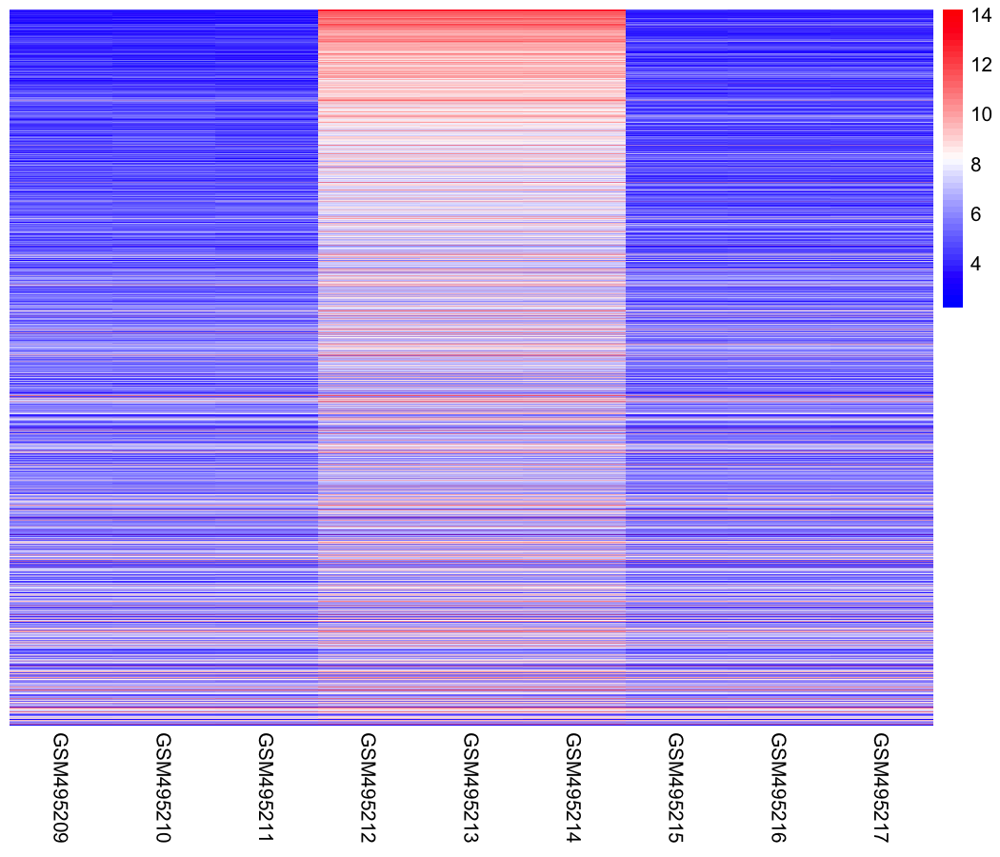

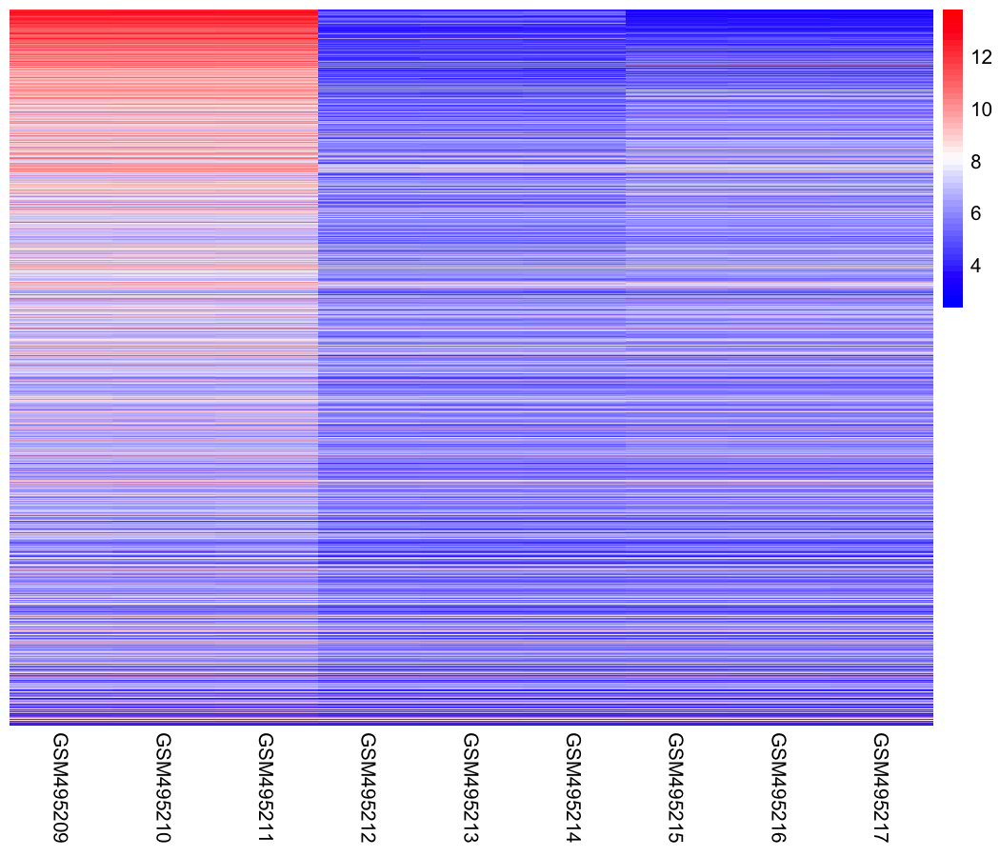

<object of class MarkerList>
Types: 3 ['brain', 'liver', 'lung'] 
Mode: numeric
Markers: 90 
IDtype: .Affymetrix ['1387073_at', '1368810_a_at', ..., '1372615_at'] 
Values: [13.4061642992593, 13.6530125422222, ..., 10.8193459962963]
Breakdown:
brain liver  lung 
   30    30    30

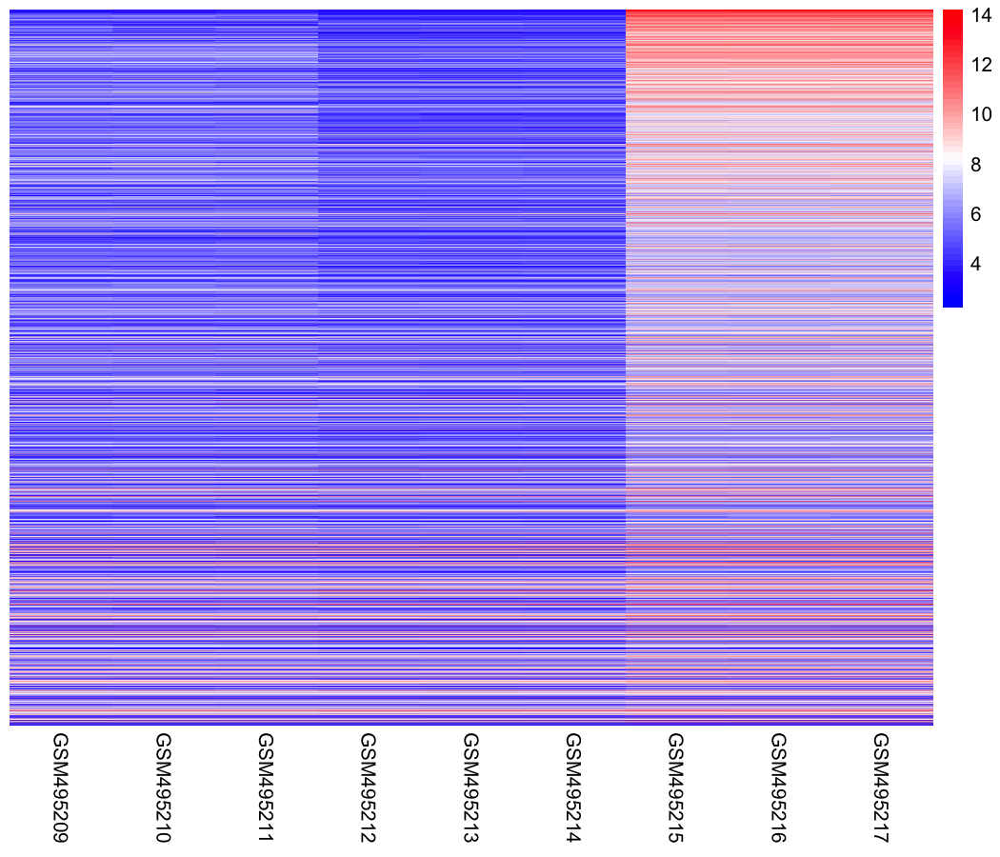

In [18]:
GSE19830.ml.raw <- list(
    brain=getDeMarkers("brain", GSE19830.ps.flt),
    liver=getDeMarkers("liver", GSE19830.ps.flt),
    lung=getDeMarkers("lung", GSE19830.ps.flt)
)
GSE19830.ml <- MarkerList(GSE19830.ml.raw)

summary(GSE19830.ml)

Output markers to compare with phantasus

In [19]:
for (name in names(GSE19830.ml.raw)) {
    cat(name)
    cat("\n")
    cat(names(GSE19830.ml.raw[[name]]))
    cat("\n\n")
}

brain
1387073_at 1368810_a_at 1367851_at 1387112_at 1368344_at 1398625_at 1370201_at 1367992_at 1368044_at 1367845_at 1386903_at 1368145_at 1370058_at 1368656_at 1377125_at 1369977_at 1367930_at 1398258_at 1370517_at 1370815_at 1383783_at 1368170_at 1368034_at 1386998_at 1375905_at 1374187_at 1373333_at 1375877_at 1370041_at 1387288_at

liver
1369502_a_at 1387994_at 1391417_at 1373686_at 1387314_at 1370511_at 1368569_at 1368188_at 1368720_at 1371083_at 1369509_a_at 1368707_at 1370992_a_at 1368442_at 1368397_at 1393139_at 1368686_at 1367917_at 1370547_at 1370027_a_at 1370359_at 1370580_a_at 1387034_at 1370151_at 1369111_at 1368731_at 1368048_at 1368335_at 1387949_at 1379240_at

lung
1367566_at 1369107_at 1370255_at 1387460_at 1370980_at 1383145_at 1387960_at 1388224_at 1370401_at 1371700_at 1373911_at 1389734_x_at 1381318_at 1368168_at 1382833_at 1376828_at 1368521_at 1387315_at 1367661_at 1373617_at 1368423_at 1371970_at 1389732_at 1374070_at 1388433_at 1387159_at 1370257_at 1393237_at

In [20]:
options(repr.plot.height = 9, repr.plot.width = 12, repr.plot.res = 150)

Warning message in rep(labels, length.out = ncol(x)):
“'x' is NULL so the result will be NULL”
Warning message in rep(labels, length.out = ncol(x)):
“'x' is NULL so the result will be NULL”
Warning message in rep(labels, length.out = ncol(x)):
“'x' is NULL so the result will be NULL”


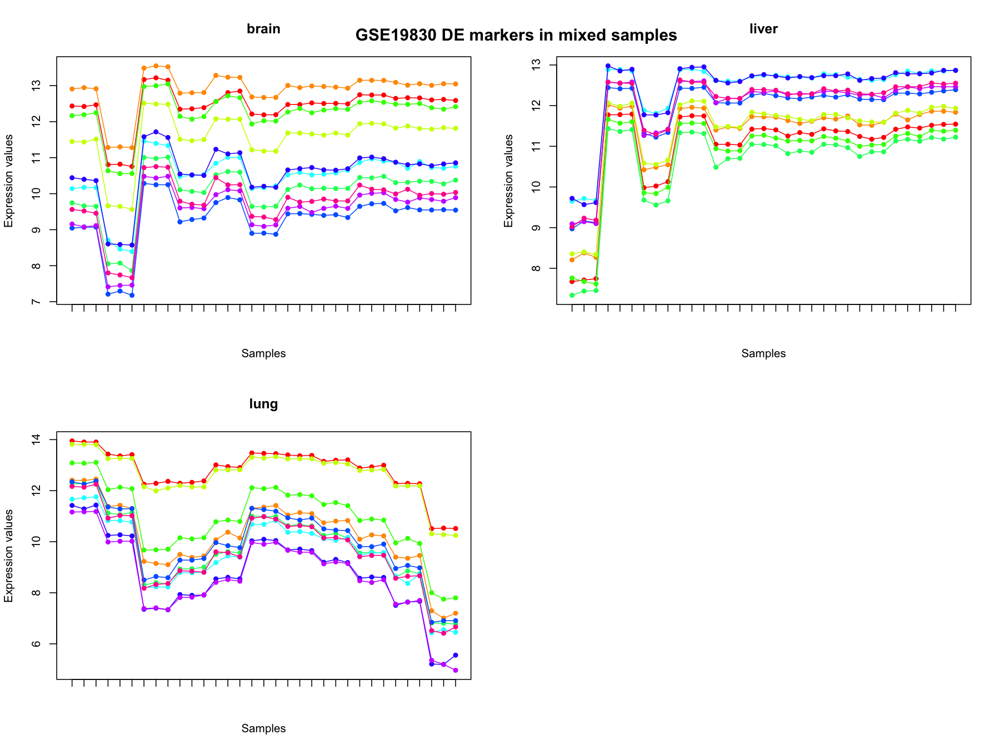

In [21]:
profplot(GSE19830.ml[,1:10], GSE19830.mix)
title("GSE19830 DE markers in mixed samples")

Warning message in rep(labels, length.out = ncol(x)):
“'x' is NULL so the result will be NULL”
Warning message in rep(labels, length.out = ncol(x)):
“'x' is NULL so the result will be NULL”
Warning message in rep(labels, length.out = ncol(x)):
“'x' is NULL so the result will be NULL”


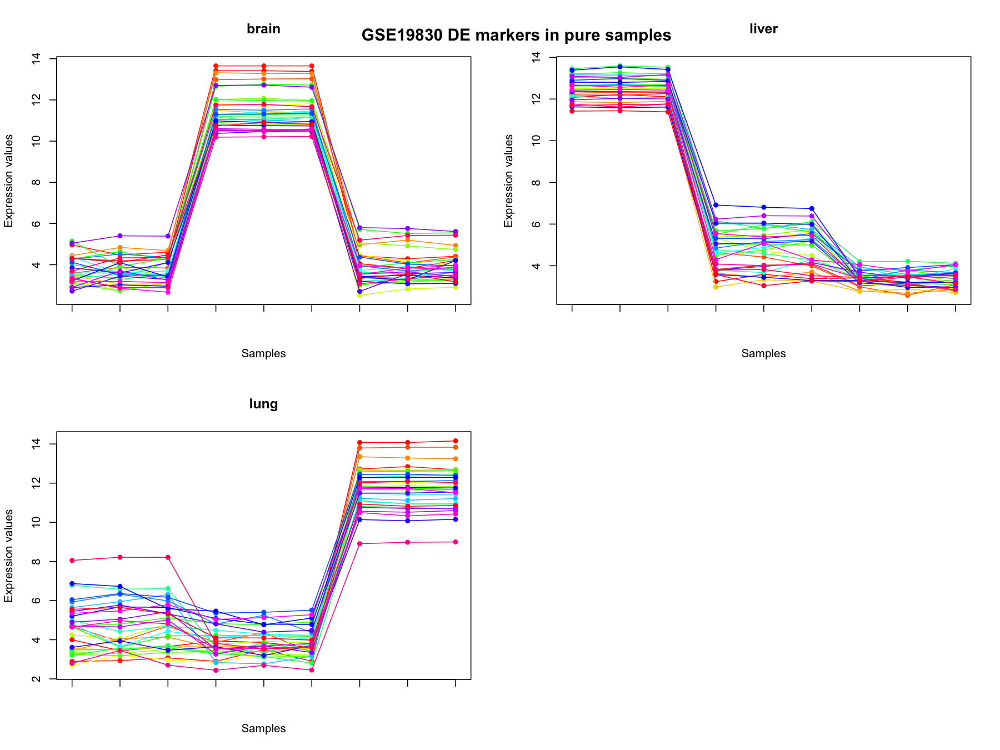

In [22]:
profplot(GSE19830.ml, GSE19830.ps)
title("GSE19830 DE markers in pure samples")

## Fit models

In [23]:
options(repr.plot.height = 6, repr.plot.width = 7, repr.plot.res = 150)

Note: using linear scale for most of the models

In [24]:
GSE19830.mix.lin <- 2 ^ exprs(GSE19830.mix) - 1

In [50]:
GSE19830.fits = list(
    dsa = ged(GSE19830.mix.lin, x = GSE19830.ml, 'DSA', verbose = TRUE),
    lee = ged(GSE19830.mix.lin, x = 3, method = 'ssFrobenius', data = GSE19830.ml, verbose = TRUE, sscale = FALSE),
    brunet = ged(GSE19830.mix.lin, x = 3, method = 'ssKL', verbose = TRUE, sscale = FALSE),
    deconf = ged(GSE19830.mix.lin, x = 3, method = 'deconf', verbose = TRUE)
)

 Using ged algorithm: “DSA”
  Estimating basis and mixture coefficients matrices from marker features [DSA]
  Using 90/90 markers to estimate cell proportions: 
 brain liver  lung 
    30    30    30 
   Checking data scale ...    OK [linear]
   Computing proportions using DSA method ...    OK
   Estimating basis matrix from mixture coefficients [qprog]
   Not using any marker constraints
 Timing:
   user  system elapsed 
  8.451   1.740  10.233 
 GED final wrap up ...  OK
 Using ged algorithm: “ssFrobenius”
 Timing:
   user  system elapsed 
 27.884   1.237  29.172 
 GED final wrap up ...  OK
 Using ged algorithm: “ssKL”
 Timing:
   user  system elapsed 
 46.865   1.051  47.955 
 GED final wrap up ...  OK
 Using ged algorithm: “deconf”
  Algorithm version 'fast'
 Timing:
   user  system elapsed 
  1.043   0.036   1.084 
 GED final wrap up ...  OK


In [46]:
GSE19830.lo <- LinseedObject$new(exprs(GSE19830.mix), topGenes=10000)

GSE19830.lo$calculatePairwiseLinearity()
GSE19830.lo$calculateSpearmanCorrelation()
GSE19830.lo$calculateSignificanceLevel(100)
GSE19830.lo$filterDatasetByPval(0.01)
GSE19830.lo$setCellTypeNumber(3)


Sampling weights [---------------------------]   1% eta: 45m

Sampling weights [>--------------------------]   2% eta: 22m

Sampling weights [>--------------------------]   3% eta: 15m

Sampling weights [>--------------------------]   4% eta: 11m

Sampling weights [>--------------------------]   5% eta:  9m

Sampling weights [=>-------------------------]   6% eta:  7m

Sampling weights [=>-------------------------]   7% eta:  6m

Sampling weights [=>-------------------------]   8% eta:  5m

Sampling weights [=>-------------------------]   9% eta:  5m

Sampling weights [==>------------------------]  10% eta:  4m

Sampling weights [==>------------------------]  11% eta:  5m

Sampling weights [==>------------------------]  12% eta:  4m

Sampling weights [===>-----------------------]  13% eta:  4m

Sampling weights [===>-----------------------]  14% eta:  3m

Sampling weights [===>-----------------------]  15% eta:  3m

Sampling weights [===>-----------------------]  16% eta:  3m

Samplin

In [47]:
GSE19830.lo$project("filtered")
GSE19830.lo$smartSearchCorners(dataset="filtered", error="norm")

Final vector is 



1 2 2

In [48]:
GSE19830.lo$deconvolveByEndpoints(dataset="full", error="raw")

In [51]:
GSE19830.predictions <- purrr::map(
    GSE19830.fits, . %>%
        .coef %>%
        .[guessOrder(., GSE19830.true),] %>%
        `rownames<-`(rownames(GSE19830.true))
)

GSE19830.predictions$linseed <- GSE19830.lo$proportions[guessOrder(GSE19830.lo$proportions, GSE19830.true),]

## Compare predictions

In [52]:
options(warn = -1)
options(repr.plot.height = 6, repr.plot.width = 7, repr.plot.res = 150)

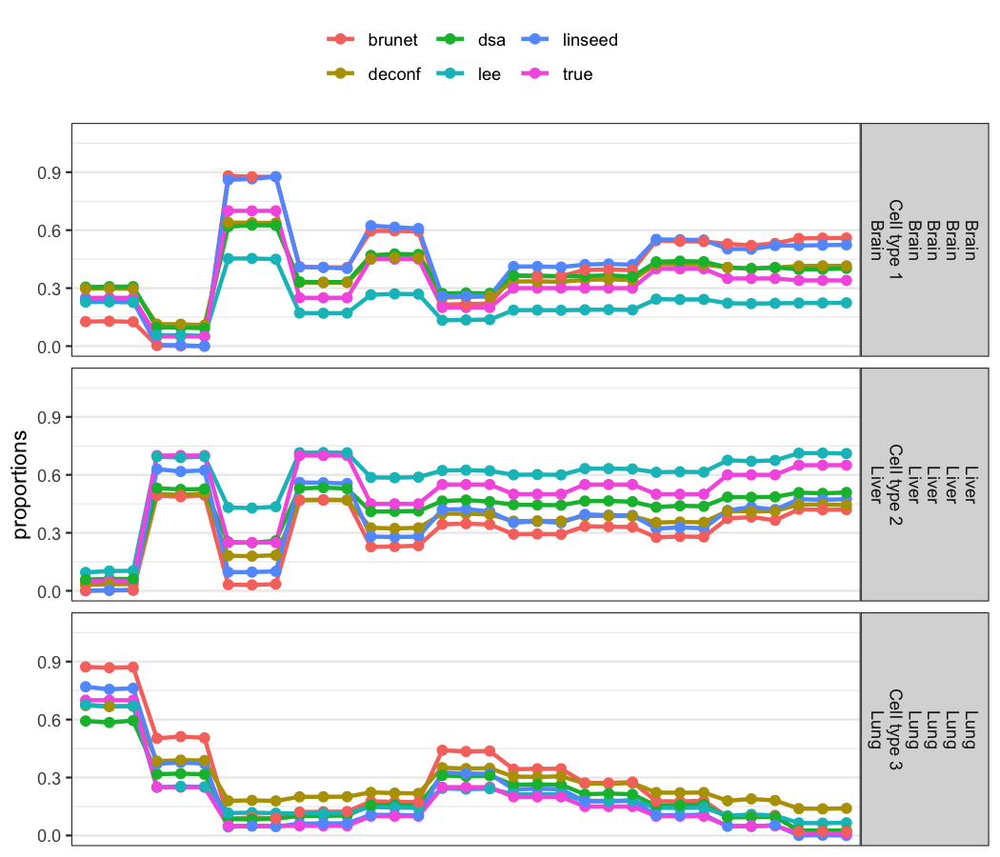

In [53]:
GSE19830.proportions <- c(GSE19830.predictions, true = list(GSE19830.true))
do.call(plotProportions, c(GSE19830.proportions, pnames = list(names(GSE19830.proportions))))

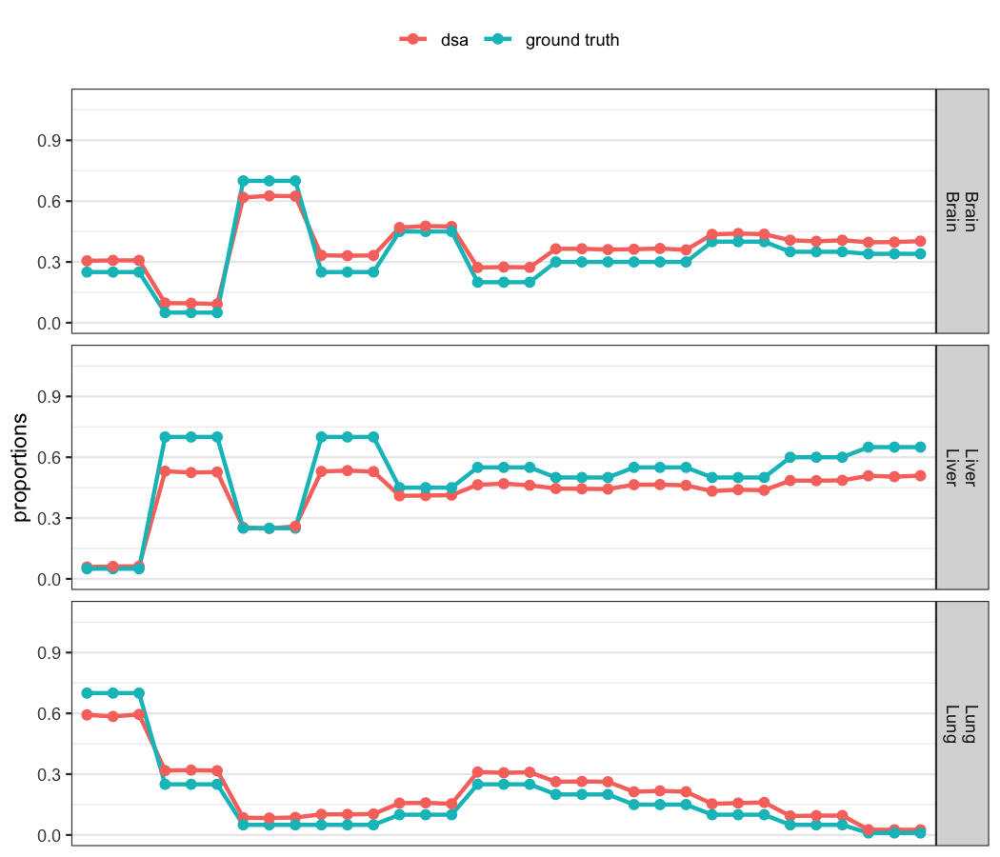

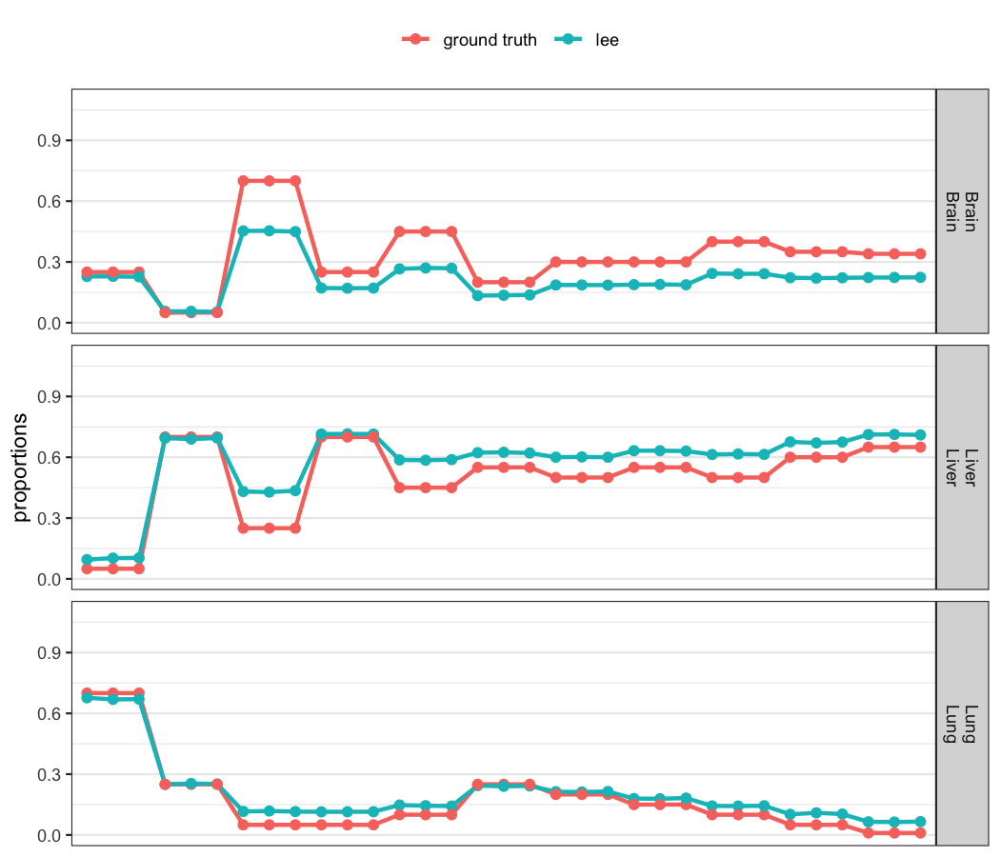

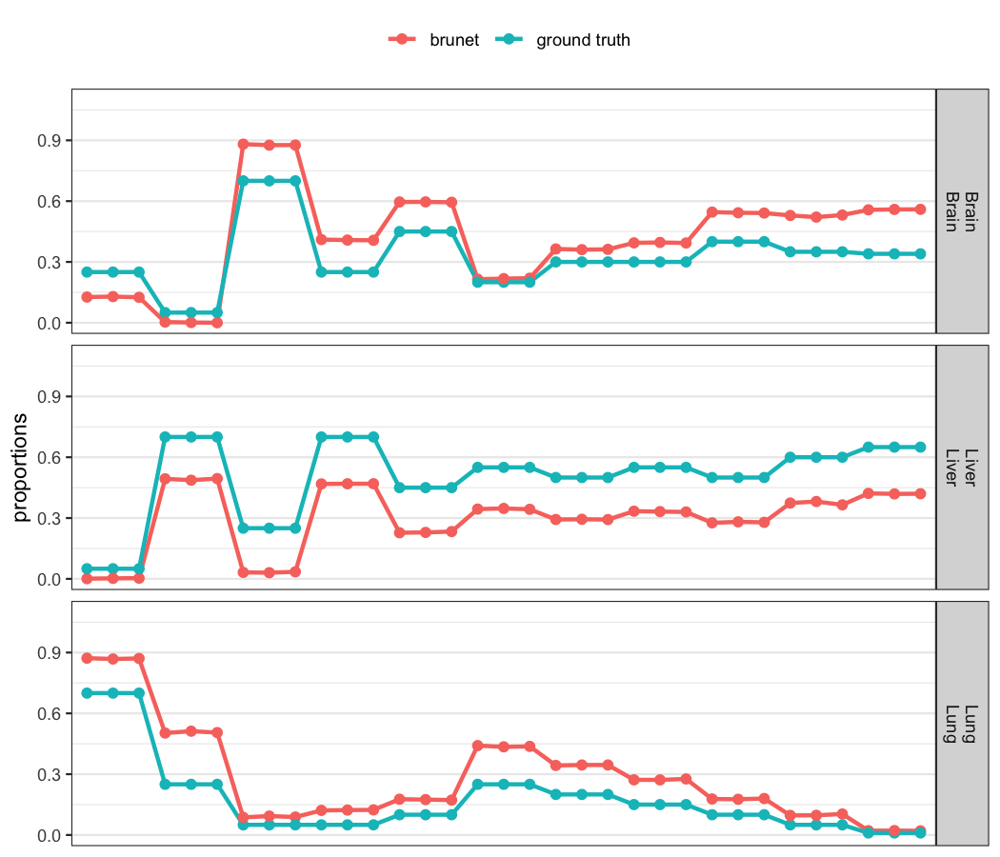

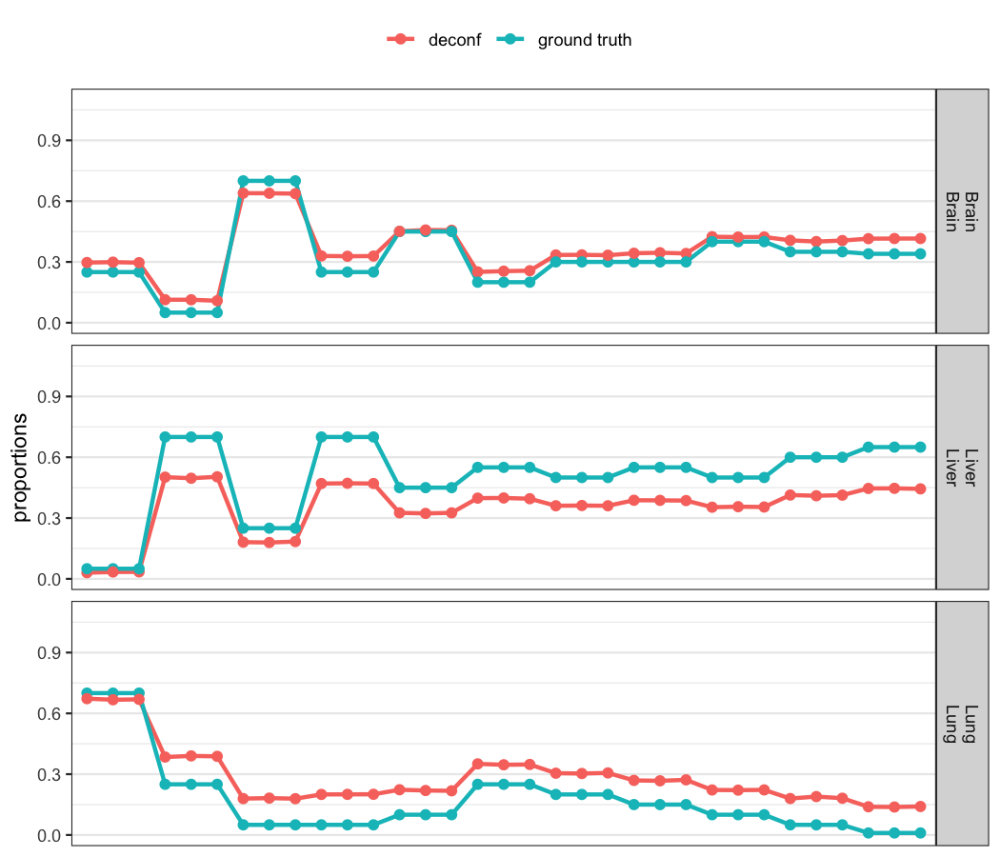

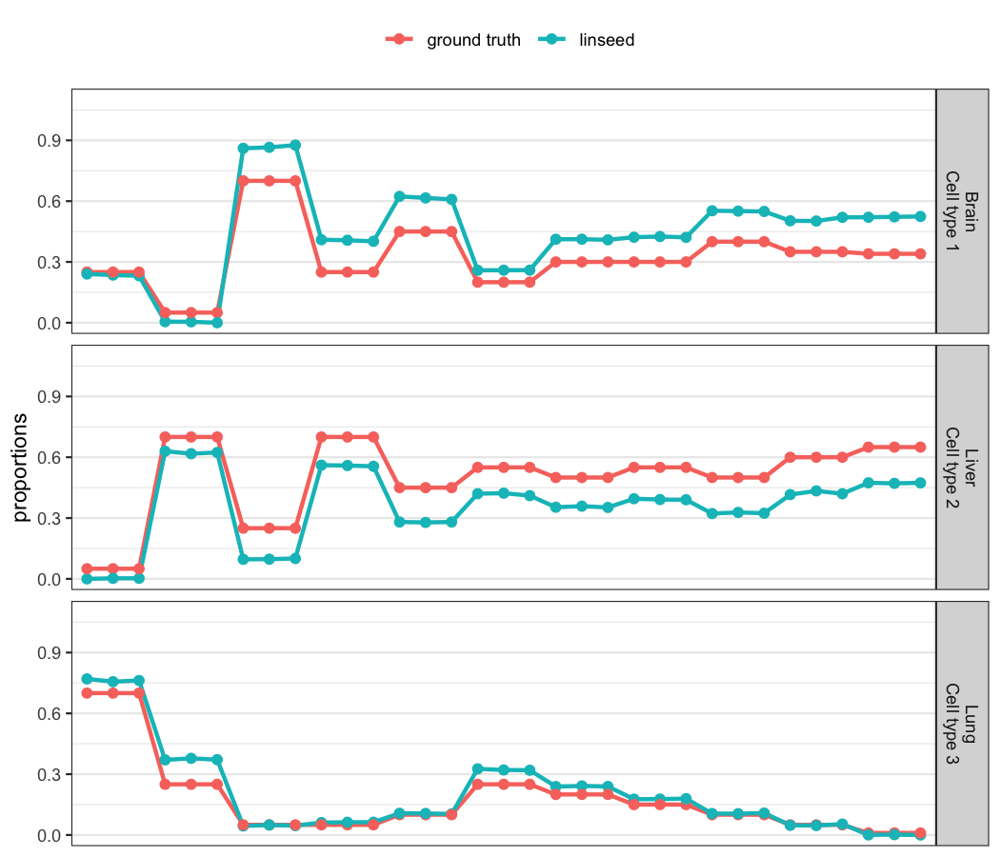

In [54]:
plots <- names(GSE19830.predictions) %>% 
    purrr::map(~ show(plotProportions(GSE19830.true, GSE19830.predictions[[.]], pnames = c("ground truth", .))))

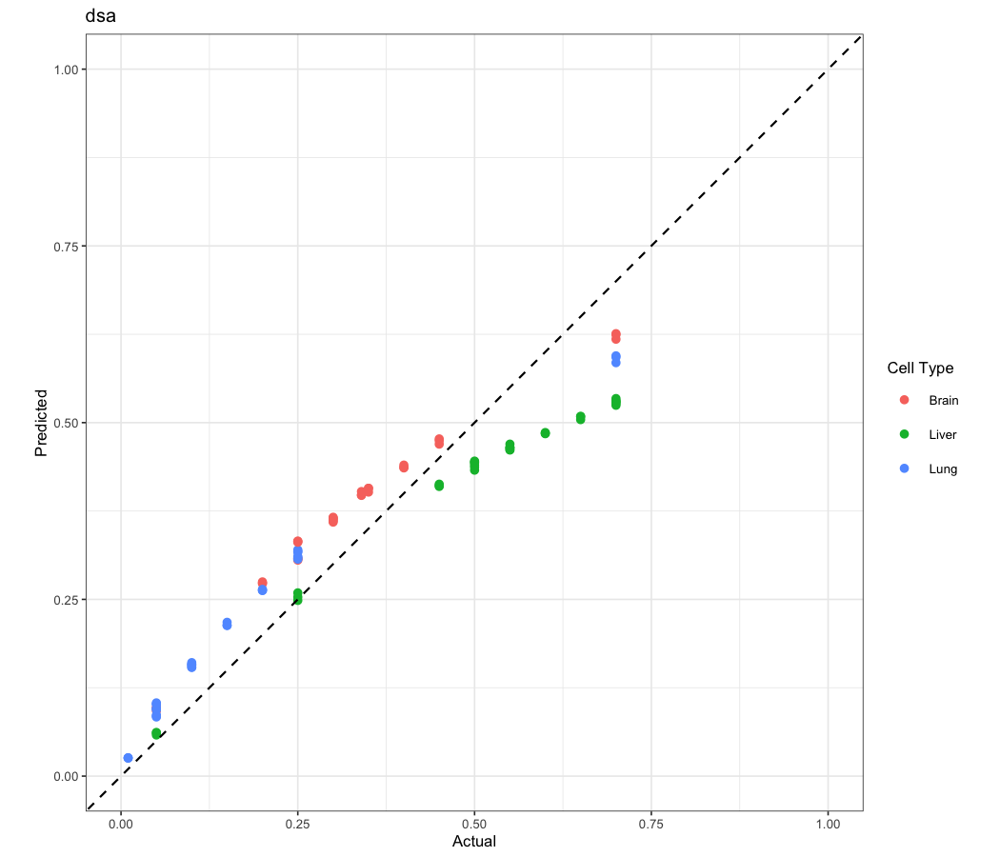

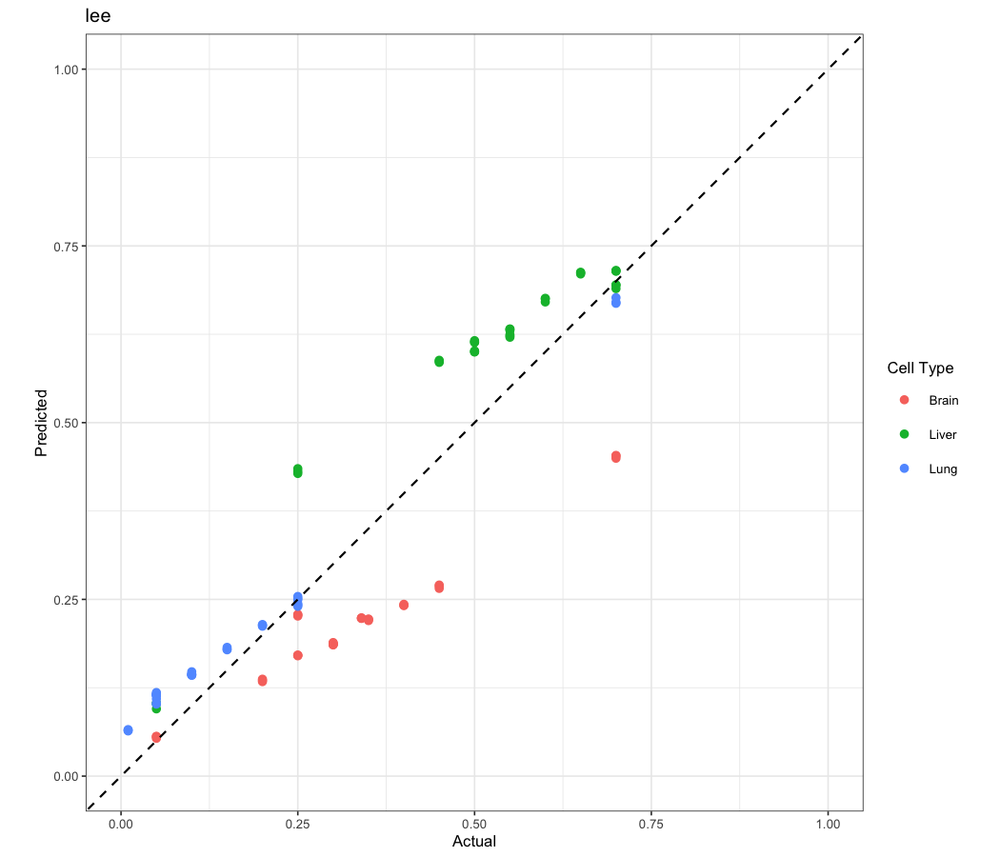

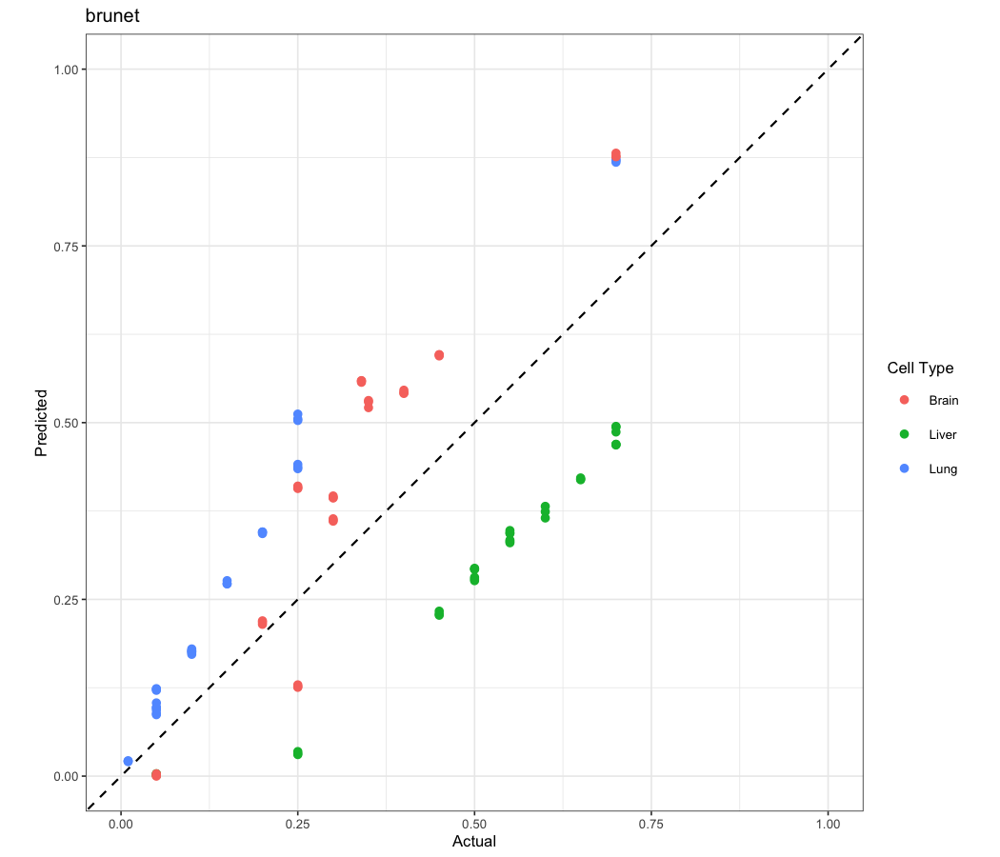

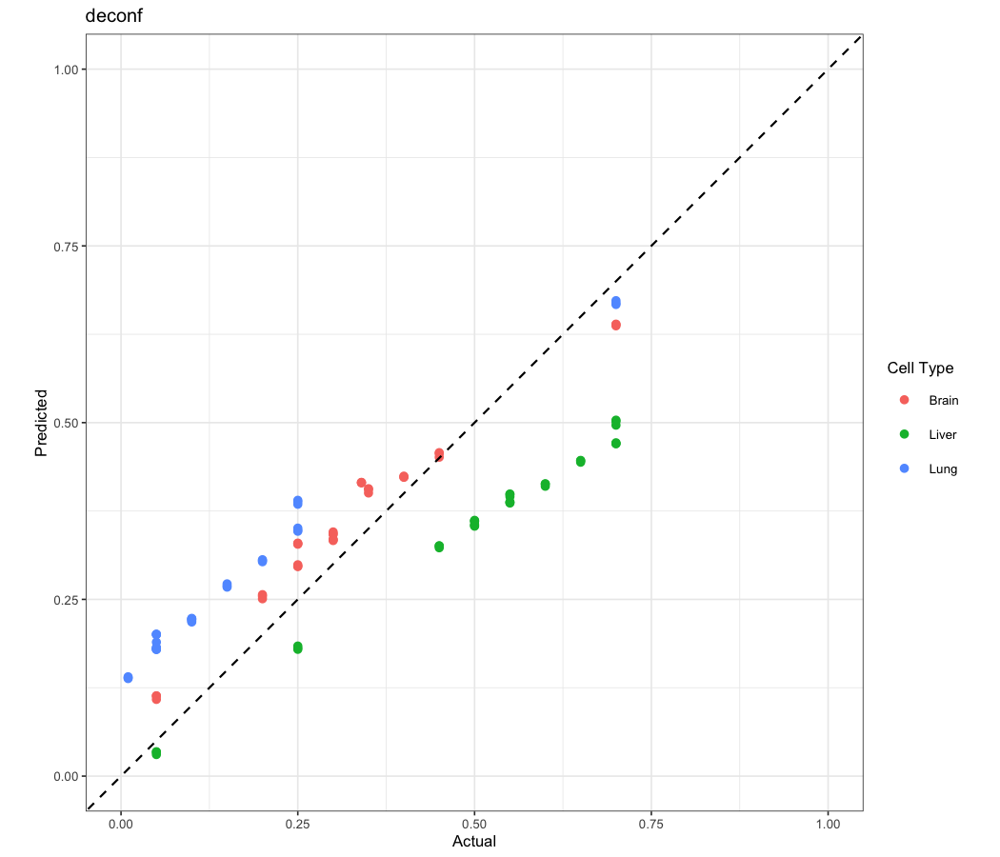

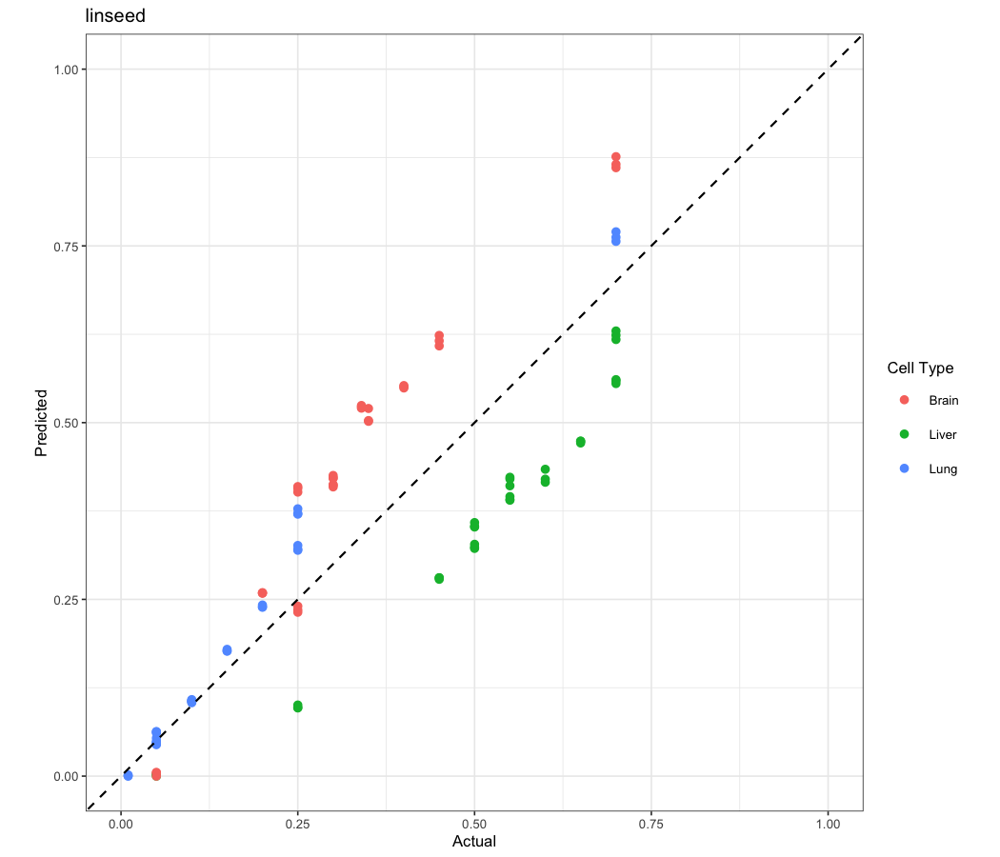

In [55]:
plots <- names(GSE19830.predictions) %>%
    purrr::map(~ show(dotPlotPropotions(GSE19830.predictions[[.]], GSE19830.true, guess=T, main = .)))

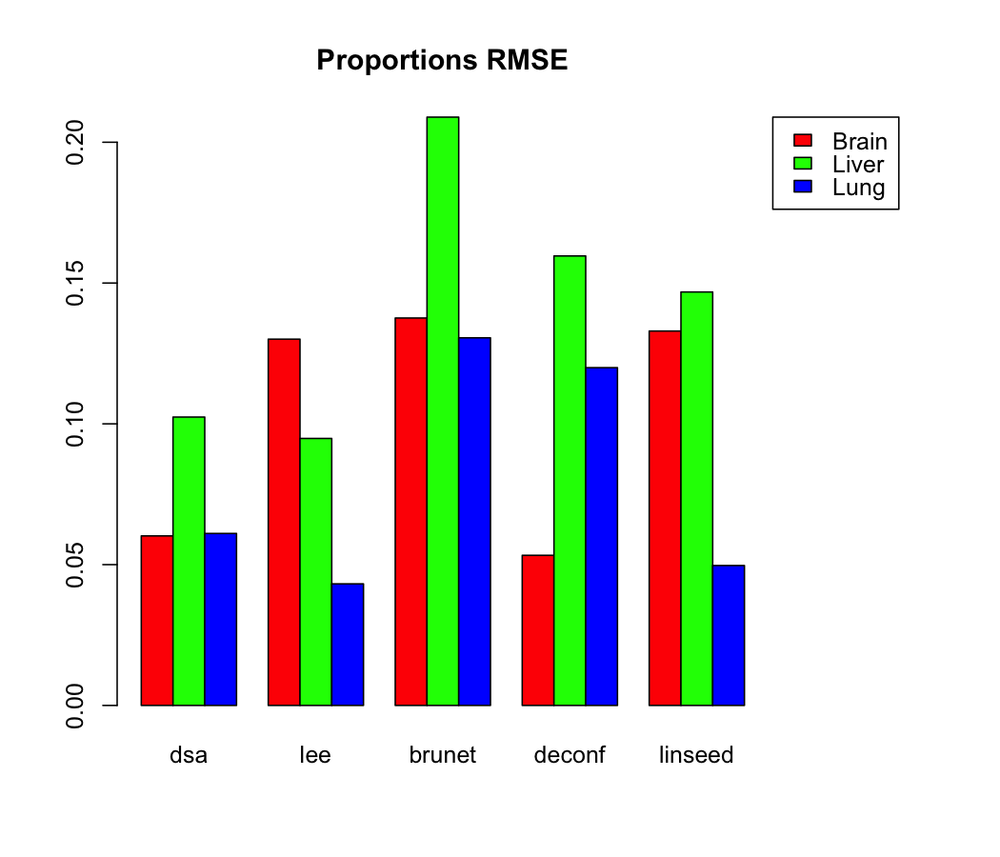

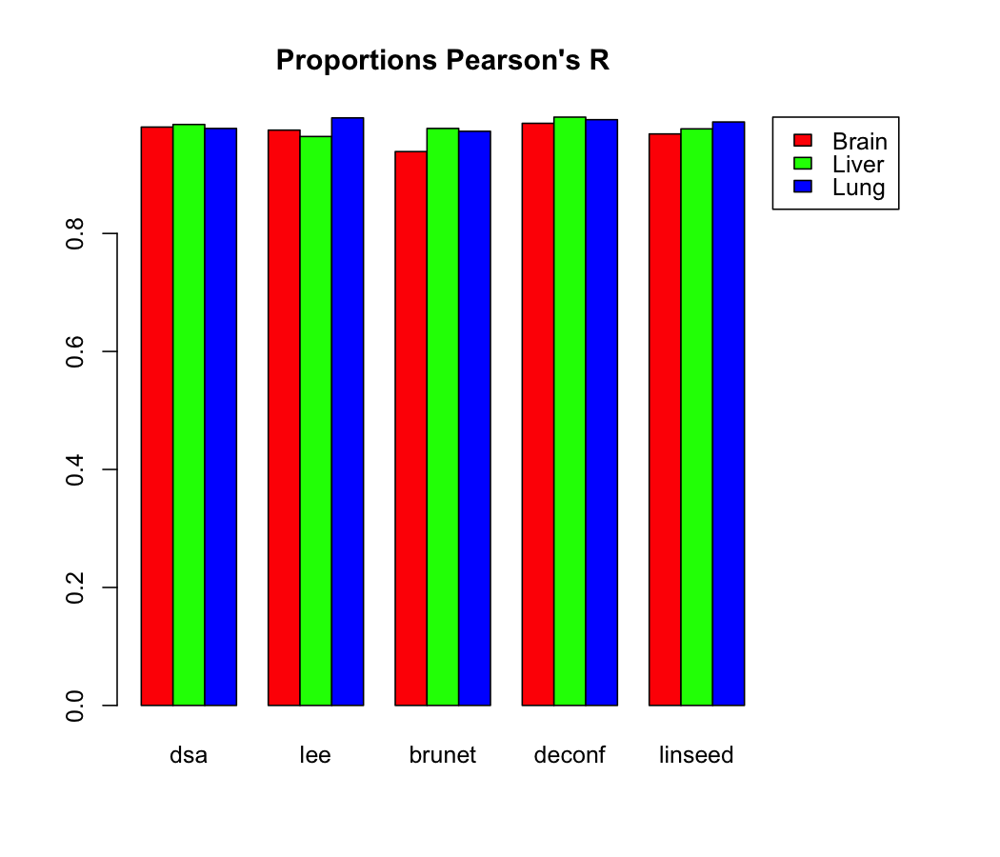

In [56]:
barplotMetric(GSE19830.predictions, GSE19830.true, Metrics::rmse, "Proportions RMSE", c("red", "green", "blue"))
barplotMetric(GSE19830.predictions, GSE19830.true, cor, "Proportions Pearson's R", c("red", "green", "blue"))

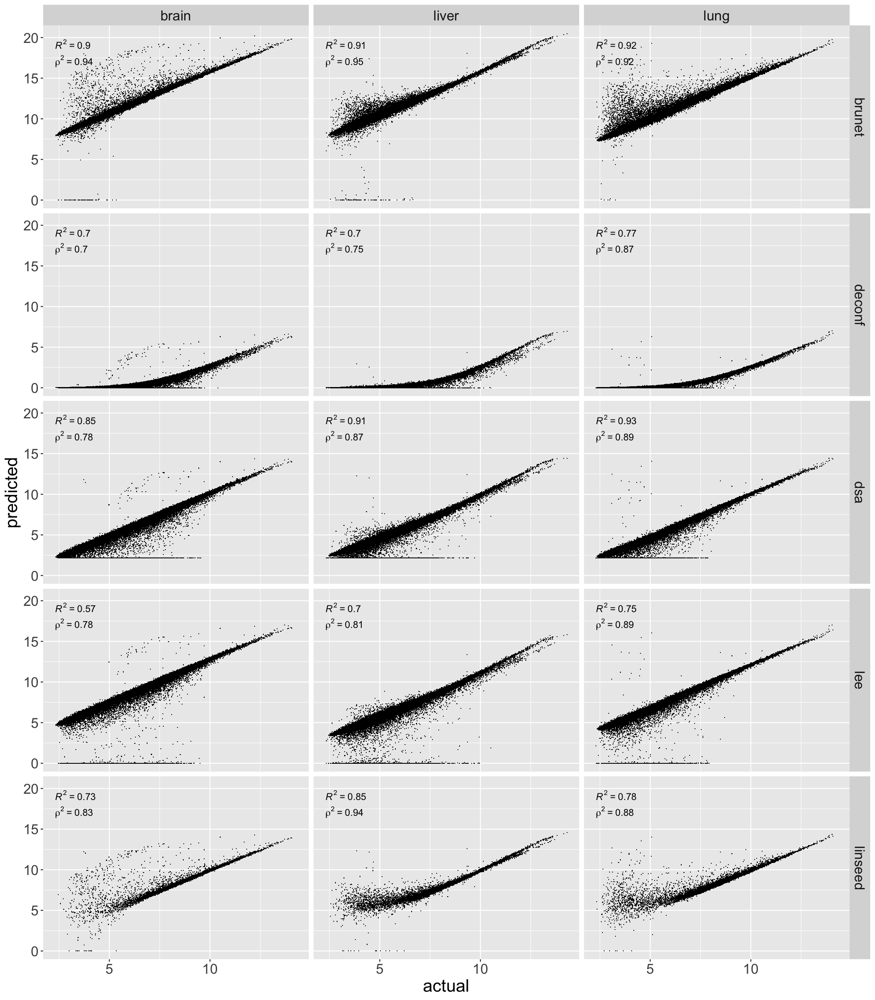

In [57]:
options(repr.plot.height = 16, repr.plot.width = 14)
GSE19830.meltedBasis <- getMeltedBasis(GSE19830.mix, GSE19830.fits, GSE19830.lo)
plotMeltedBasis(GSE19830.meltedBasis)

# GSE11058

In [105]:
options(repr.plot.height = 6, repr.plot.width = 7, repr.plot.res = 150)

## Load, preprocess and analyze initial data

In [106]:
GSE11058.em <- ExpressionMix("GSE11058")
print(dim(GSE11058.em))
print(annotation(GSE11058.em))

# Random pData sample
pData(GSE11058.em)[sample(nrow(pData(GSE11058.em)), 3), c("Jurkat", "IM-9", "Raji", "THP-1")]

Loading dataset 'GSE11058' ... OK
  Features    Samples Components 
     54675         24          4 
[1] "hgu133plus2.db"


,Jurkat,IM-9,Raji,THP-1
,<dbl>,<dbl>,<dbl>,<dbl>
GSM279596,0,0.0,100.0,0.0
GSM279608,1,49.5,16.5,33.0
GSM279601,25,12.5,25.0,37.5


Note: the data is not in log scale

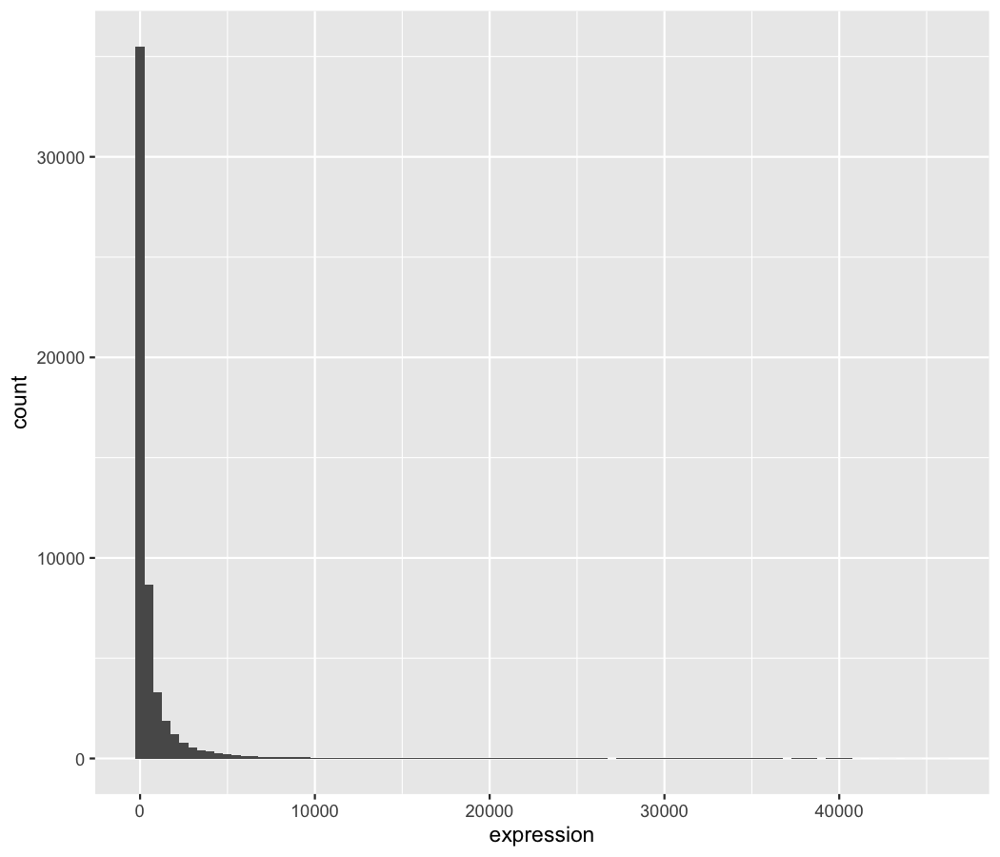

In [107]:
ggplot(data=data.frame(expression=exprs(GSE11058.em)[, 1]), aes(x=expression)) + geom_histogram(binwidth = 500)

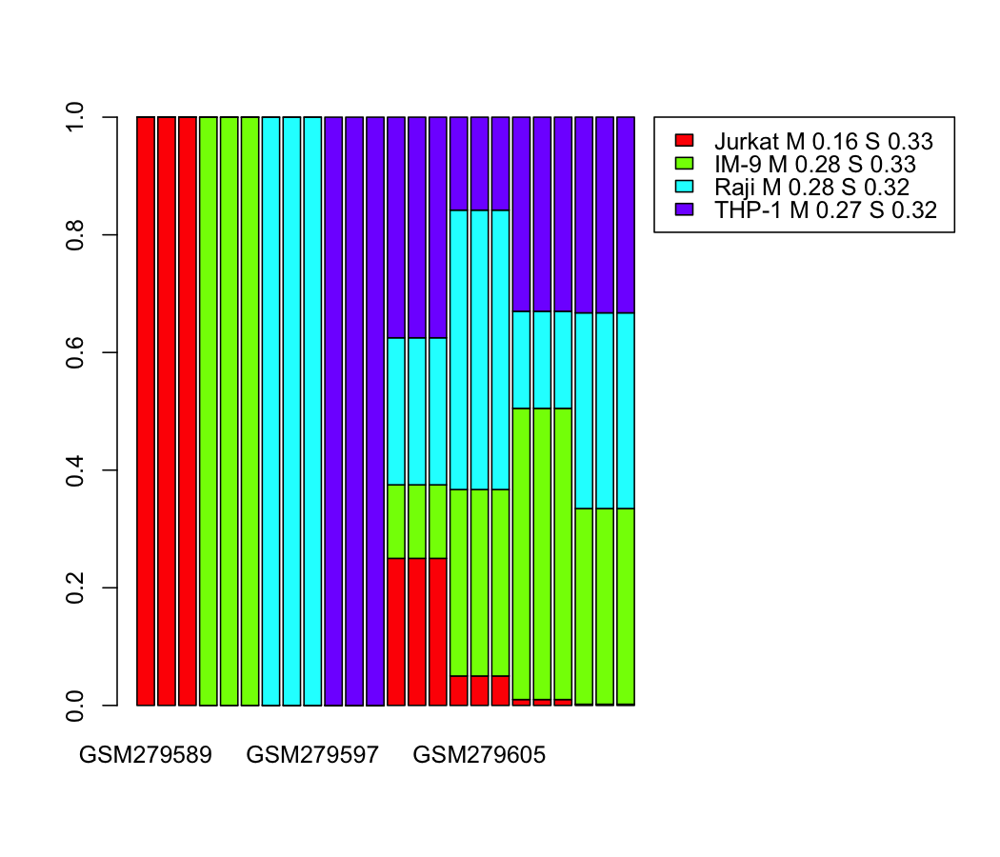

In [108]:
CellMix::propplot(GSE11058.em)

Extract mixed samples

,Jurkat,IM-9,Raji,THP-1
,<dbl>,<dbl>,<dbl>,<dbl>
GSM279601,25,12.5,25.0,37.5
GSM279602,25,12.5,25.0,37.5
GSM279603,25,12.5,25.0,37.5
GSM279604,5,31.7,47.5,15.8
GSM279605,5,31.7,47.5,15.8
GSM279606,5,31.7,47.5,15.8


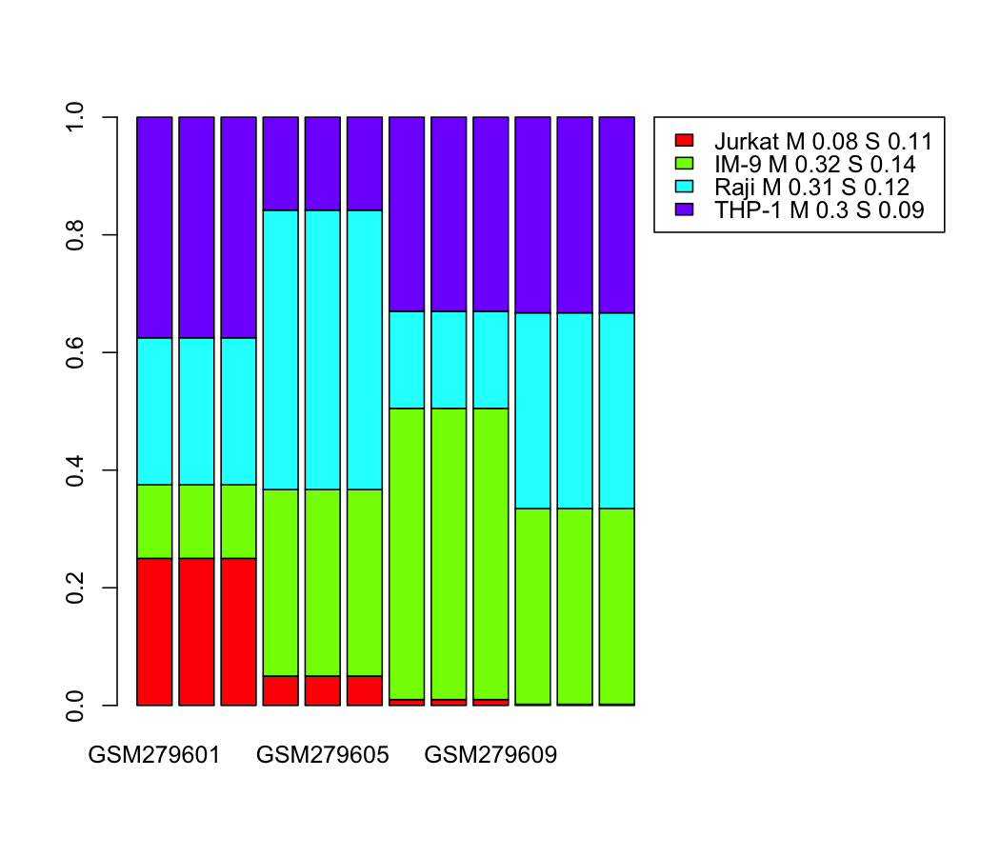

In [109]:
GSE11058.mix <- mixedSamples(GSE11058.em)
head(pData(GSE11058.mix)[c("Jurkat", "IM-9", "Raji", "THP-1")])
CellMix::propplot(GSE11058.mix)

Set ground truth variable

In [110]:
GSE11058.true <- .coef(GSE11058.em)

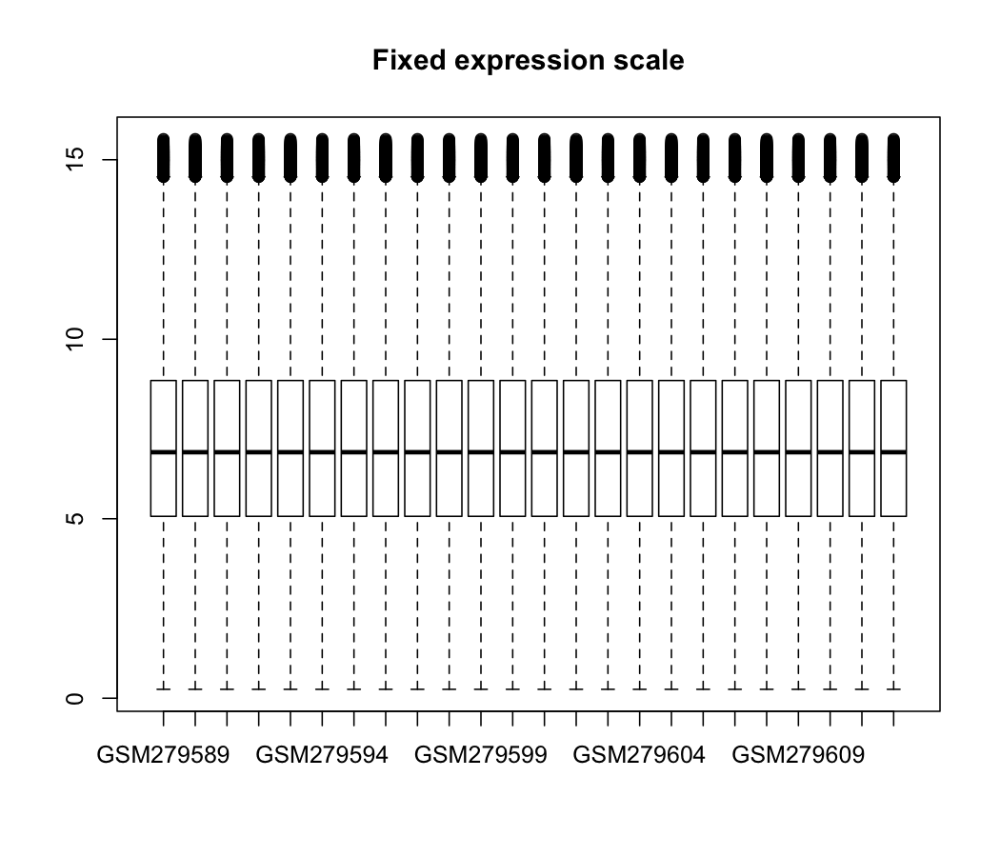

In [111]:
# Workaround for (apparently) a bug in CellMix, unable to set exprs(ExpressionMix)
GSE11058.em.es <- eset(GSE11058.em)
exprs(GSE11058.em.es) <- normalizeBetweenArrays(log2(exprs(GSE11058.em.es) + 1), method="quantile")
pure <- GSE11058.em@pure
GSE11058.em.log <- ExpressionMix(GSE11058.em.es, composition = GSE11058.em)
GSE11058.em.log@pure <- pure

boxplot(exprs(GSE11058.em.log), main = "Fixed expression scale")

### Differential expression markers

In [112]:
GSE11058.ps <- pureSamples(GSE11058.em.log)

Casting data to log-qnorm for DE

In [113]:
# Filter phenotype data
pData(GSE11058.ps) <- (pData(GSE11058.ps)[, c("Jurkat", "IM-9", "Raji", "THP-1")] / 100) %>%
    dplyr::mutate(tissue = pData(GSE11058.ps)[, "Type"]) %>%
    dplyr::mutate_all(as.factor)
colnames(pData(GSE11058.ps)) <- tolower(colnames(pData(GSE11058.ps))) %>% gsub("-", "", .)
pData(GSE11058.ps)$tissue <- tolower(pData(GSE11058.ps)$tissue) %>% gsub("-", "", .)
pData(GSE11058.ps)

# Filter feature data
fData(GSE11058.ps) <- fData(GSE11058.ps)[, c("ENTREZ_GENE_ID", "Gene Symbol")]

# Drop duplicates, annotate with mean expression and sort by it
GSE11058.ps.flt <- GSE11058.ps[!duplicated(fData(GSE11058.ps)$`ENTREZ_GENE_ID`), ]
fData(GSE11058.ps.flt)$mean_expression <- apply(exprs(GSE11058.ps.flt), 1, mean)
GSE11058.ps.flt <- GSE11058.ps.flt[order(fData(GSE11058.ps.flt)$mean_expression, decreasing = TRUE), ]

,jurkat,im9,raji,thp1,tissue
,<fct>,<fct>,<fct>,<fct>,<chr>
GSM279589,1,0,0,0,jurkat
GSM279590,1,0,0,0,jurkat
GSM279591,1,0,0,0,jurkat
GSM279592,0,1,0,0,im9
GSM279593,0,1,0,0,im9
GSM279594,0,1,0,0,im9
GSM279595,0,0,1,0,raji
GSM279596,0,0,1,0,raji
GSM279597,0,0,1,0,raji


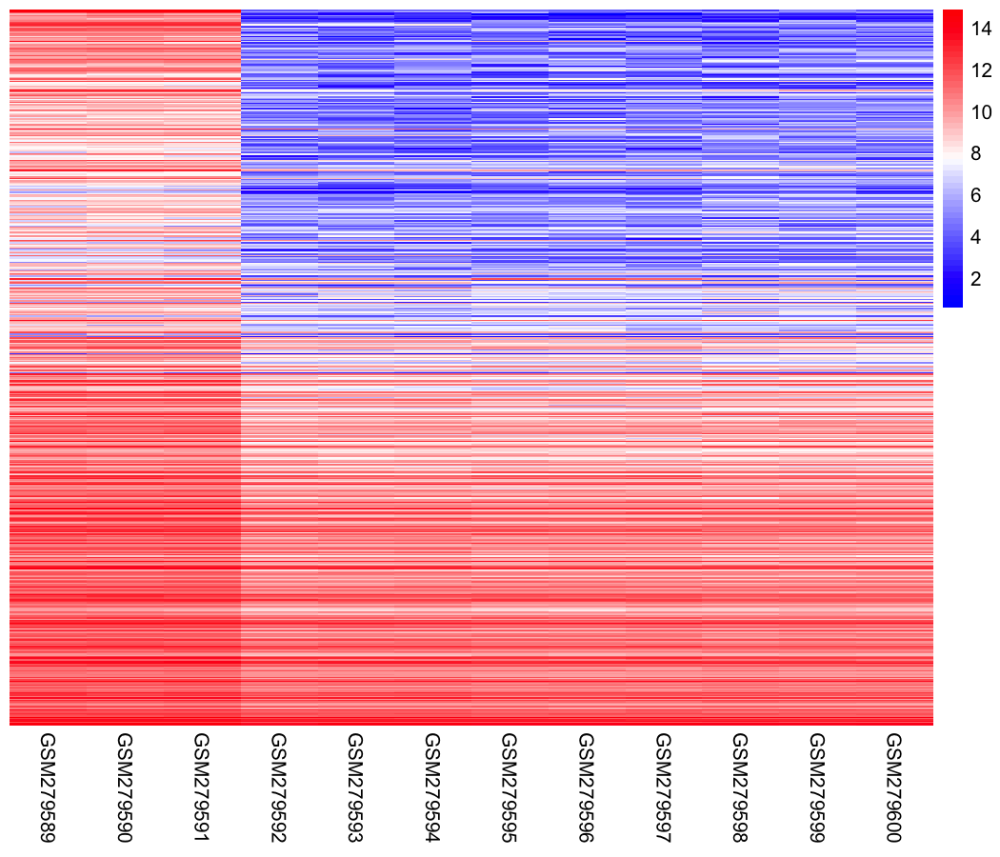

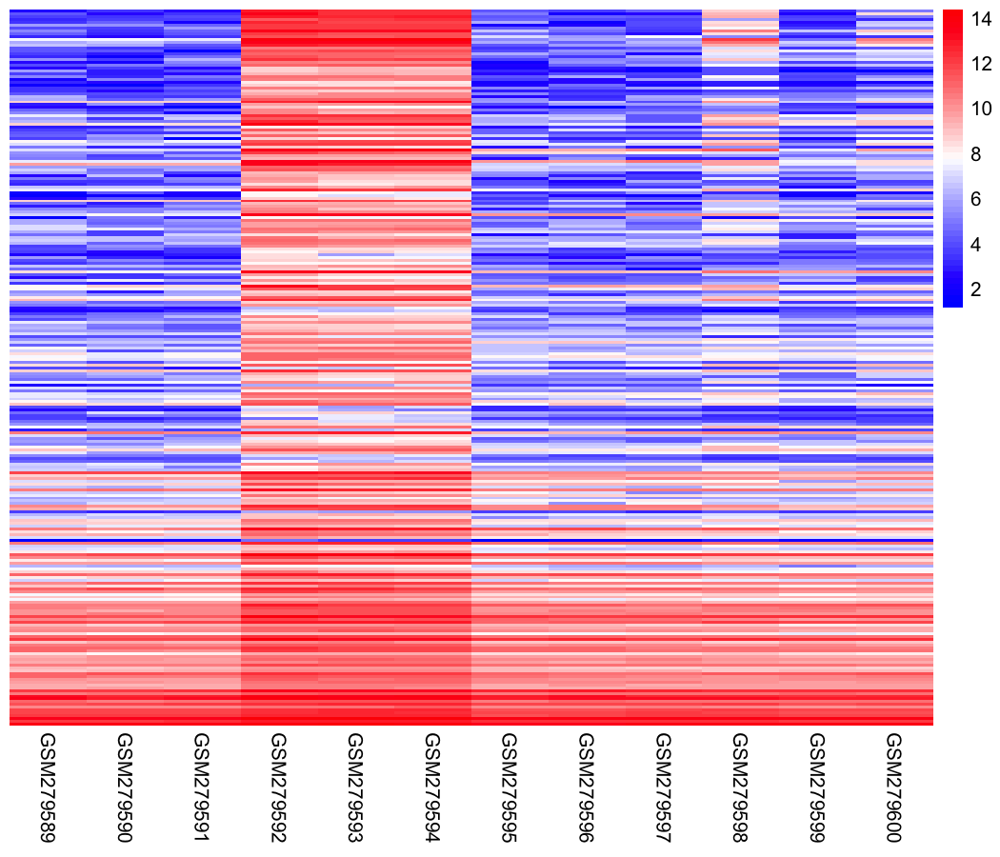

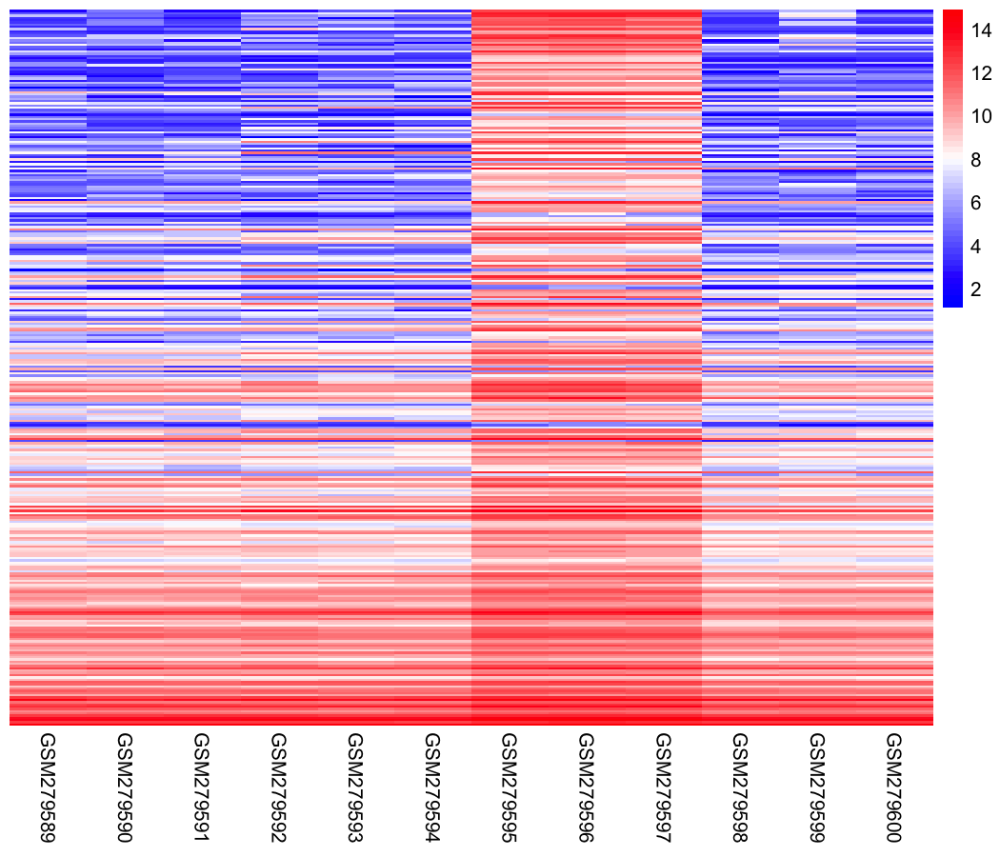

<object of class MarkerList>
Types: 4 ['jurkat', 'im9', ..., 'thp1'] 
Mode: numeric
Markers: 120 
IDtype: .Affymetrix ['214183_s_at', '213539_at', ..., '221900_at'] 
Values: [14.747707733785, 14.2453531106406, ..., 11.8153195269334]
Breakdown:
jurkat    im9   raji   thp1 
    30     30     30     30

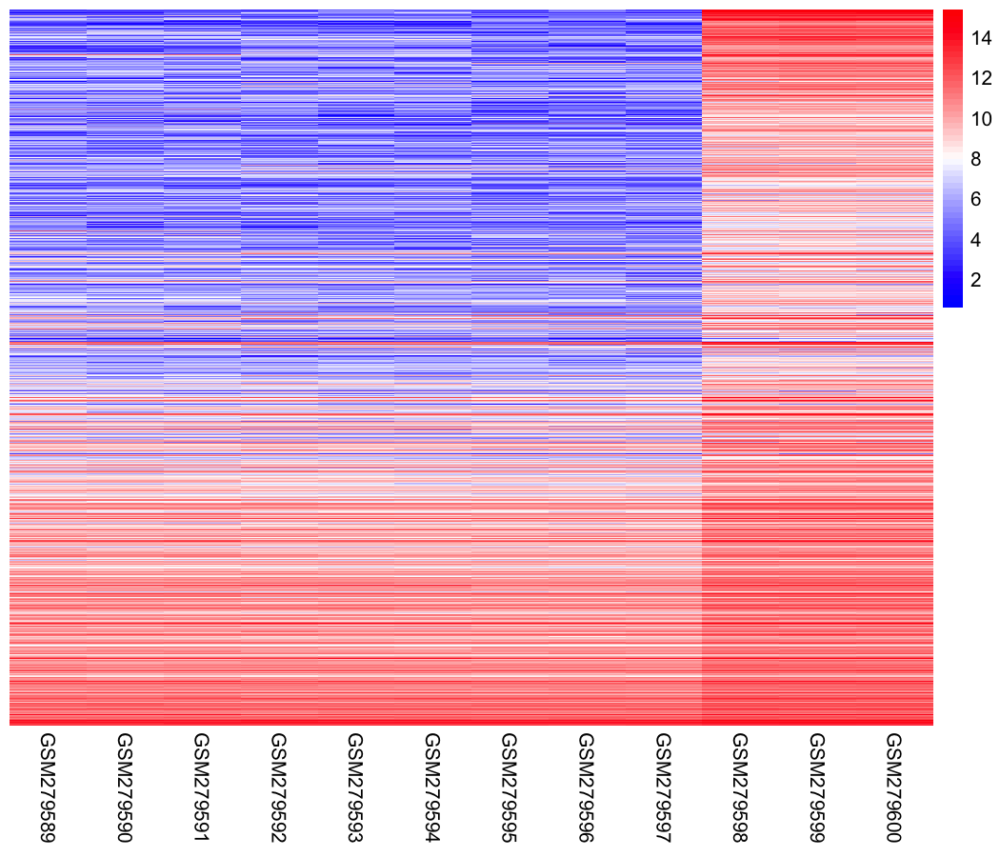

In [207]:
GSE11058.ml.raw <- list(
    jurkat=getDeMarkers("jurkat", GSE11058.ps.flt),
    im9=getDeMarkers("im9", GSE11058.ps.flt),
    raji=getDeMarkers("raji", GSE11058.ps.flt),
    thp1=getDeMarkers("thp1", GSE11058.ps.flt)
)
GSE11058.ml <- MarkerList(GSE11058.ml.raw)
summary(GSE11058.ml)

Print genes to compare with phantasus

In [115]:
for (name in names(GSE11058.ml.raw)) {
    cat(name)
    cat("\n")
    cat(names(GSE11058.ml.raw[[name]]))
    cat("\n\n")
}

jurkat
214183_s_at 213539_at 1556037_s_at 209602_s_at 213456_at 207397_s_at 243110_x_at 220418_at 219532_at 206804_at 236632_at 202242_at 207016_s_at 218730_s_at 210116_at 1555613_a_at 236351_at 203865_s_at 225681_at 219243_at 226884_at 212364_at 206546_at 223170_at 204890_s_at 206727_at 1558971_at 1555935_s_at 226548_at 205456_at

im9
210546_x_at 229973_at 218717_s_at 205890_s_at 212698_s_at 1556095_at 210295_at 227742_at 231131_at 209728_at 209942_x_at 214254_at 244644_at 206618_at 210643_at 225911_at 219985_at 205498_at 205612_at 234994_at 206045_s_at 1562054_at 205476_at 220565_at 206271_at 208461_at 204463_s_at 223975_at 203716_s_at 227915_at

raji
206023_at 203290_at 209995_s_at 203434_s_at 211635_x_at 229147_at 227189_at 242334_at 204698_at 205902_at 1553196_a_at 220068_at 204661_at 220132_s_at 220448_at 203140_at 205403_at 206126_at 206150_at 205124_at 1569034_a_at 1552774_a_at 205997_at 206513_at 235059_at 235557_at 205801_s_at 203510_at 217281_x_at 210450_at

thp1
209395_at 2

In [116]:
options(repr.plot.height = 9, repr.plot.width = 12, repr.plot.res = 150)

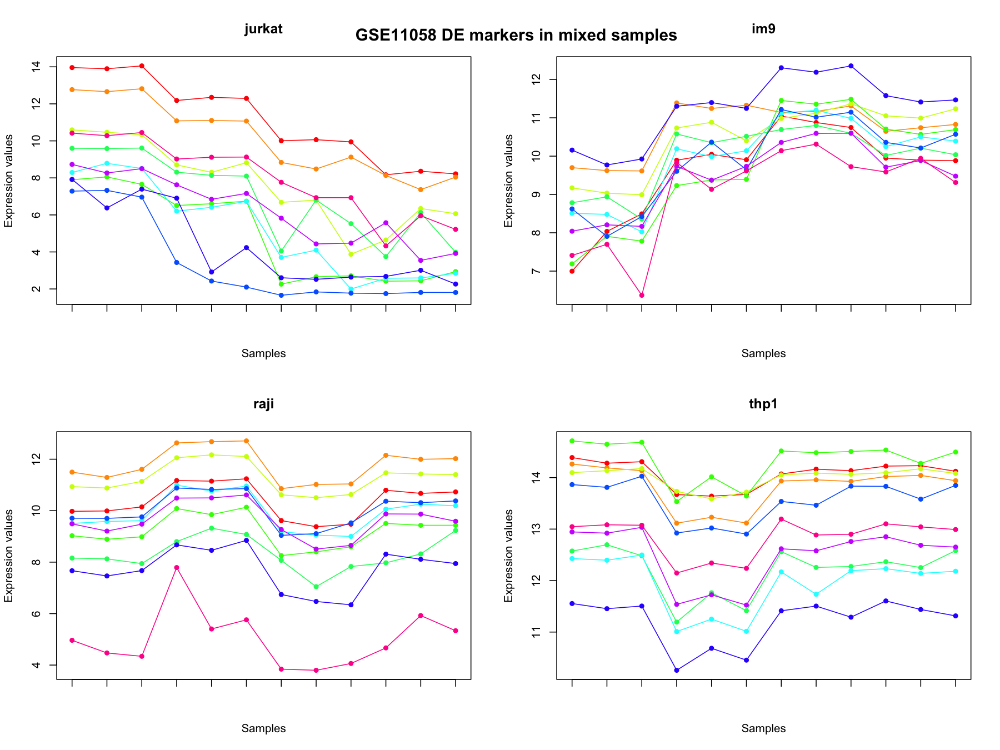

In [117]:
profplot(GSE11058.ml[,1:10], normalizeBetweenArrays(log2(exprs(GSE11058.mix) + 1)))
title("GSE11058 DE markers in mixed samples")

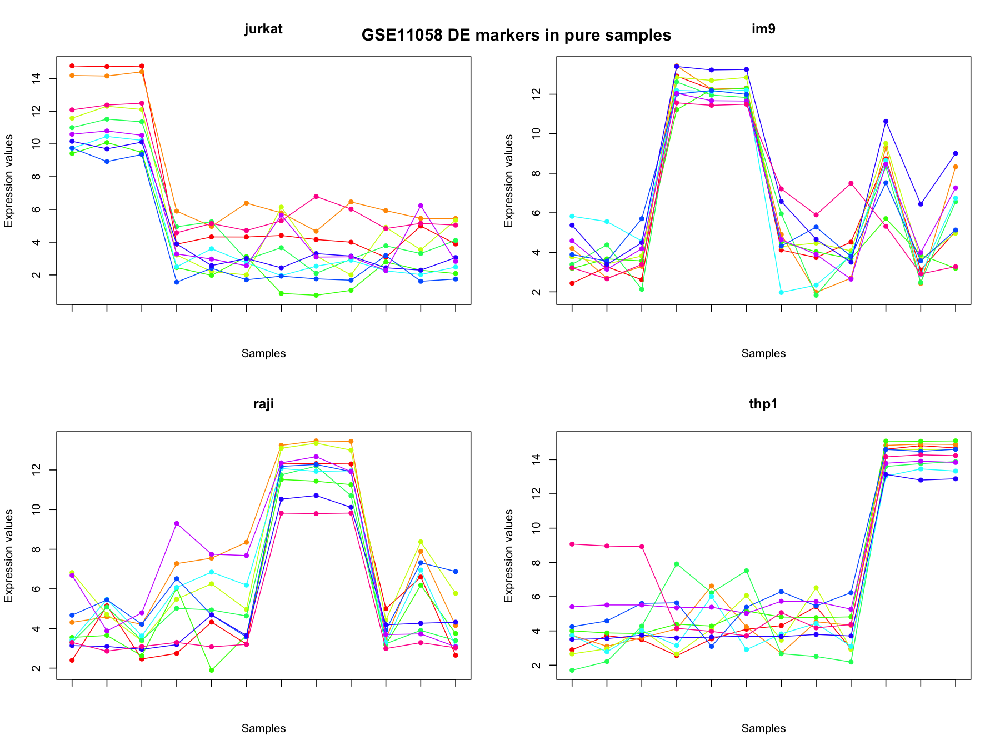

In [119]:
profplot(GSE11058.ml[,1:10], GSE11058.ps)
title("GSE11058 DE markers in pure samples")

## Fit models

In [139]:
options(repr.plot.height = 6, repr.plot.width = 7, repr.plot.res = 150)

In [140]:
GSE11058.fits = list(
    dsa = ged(GSE11058.em, x = GSE11058.ml, 'DSA', verbose = TRUE),
    lee = ged(GSE11058.em, x = 4, method = 'ssFrobenius', data = GSE11058.ml, verbose = TRUE, sscale = FALSE),
    brunet = ged(GSE11058.em, x = 4, method = 'ssKL', verbose = TRUE, sscale = FALSE),
    deconf = ged(GSE11058.em, x = 4, method = 'deconf', verbose = TRUE)
)

Using ged algorithm: “DSA”
 Estimating basis and mixture coefficients matrices from marker features [DSA]
 Using 120/120 markers to estimate cell proportions: 
 jurkat    im9   raji   thp1 
     30     30     30     30 
  Checking data scale ...   OK [linear]
  Computing proportions using DSA method ...   OK
  Estimating basis matrix from mixture coefficients [qprog]
  Not using any marker constraints
Timing:
   user  system elapsed 
 13.963   4.164  18.148 
GED final wrap up ... OK
Using ged algorithm: “ssFrobenius”
Timing:
   user  system elapsed 
 44.230   1.712  45.951 
GED final wrap up ... OK
Using ged algorithm: “ssKL”
Timing:
   user  system elapsed 
 76.684   1.573  78.261 
GED final wrap up ... OK
Using ged algorithm: “deconf”
   Algorithm version 'fast'
Timing:
   user  system elapsed 
  1.760   0.025   1.785 
GED final wrap up ... OK


In [41]:
GSE11058.lo <- LinseedObject$new(exprs(GSE11058.em), topGenes=10000)

GSE11058.lo$calculatePairwiseLinearity()
GSE11058.lo$calculateSpearmanCorrelation()
GSE11058.lo$calculateSignificanceLevel(100)
GSE11058.lo$filterDatasetByPval(0.01)
GSE11058.lo$setCellTypeNumber(4)

ERROR: Error in exprs(GSE11058.em): объект 'GSE11058.em' не найден


In [142]:
GSE11058.lo$project("full")
GSE11058.lo$smartSearchCorners(dataset="filtered", error="norm")

Final vector is 



7 1 4 3

In [143]:
GSE11058.lo$deconvolveByEndpoints(dataset="full", error="raw")

In [144]:
GSE11058.predictions <- purrr::map(
    GSE11058.fits, . %>%
        .coef %>%
        .[guessOrder(., GSE11058.true),] %>%
        `rownames<-`(rownames(GSE11058.true))
)

GSE11058.predictions$linseed <- GSE11058.lo$proportions[guessOrder(GSE11058.lo$proportions, GSE11058.true),]

## Compare predictions

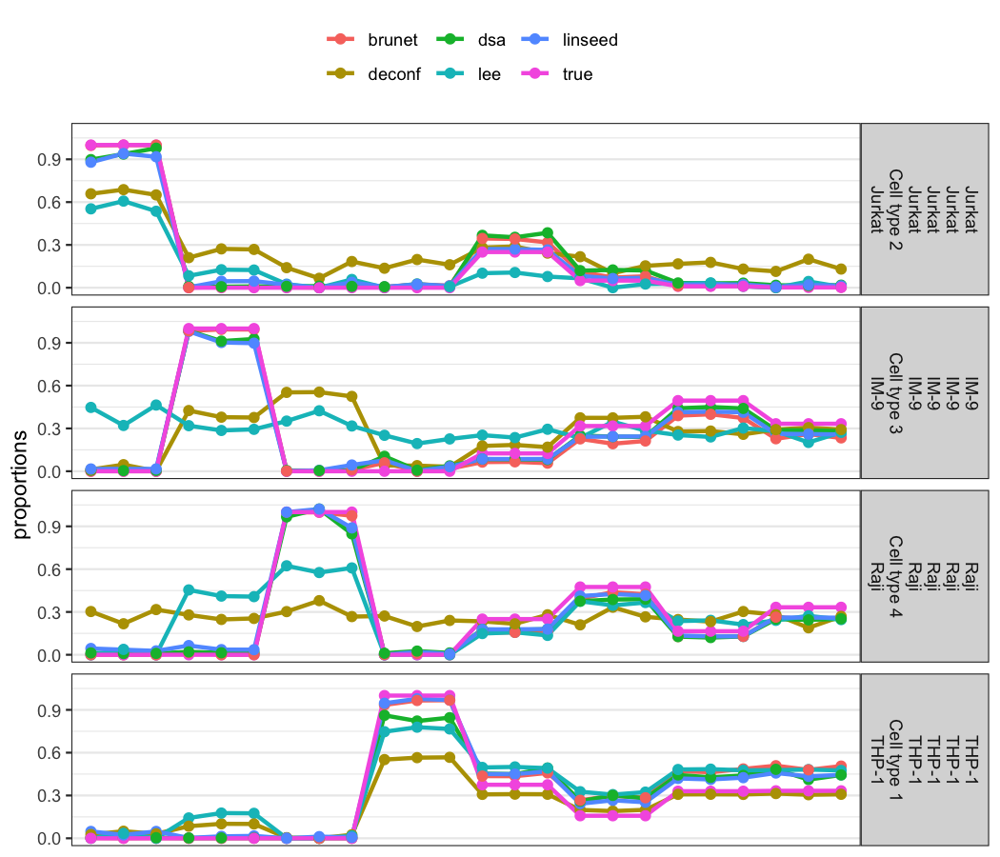

In [145]:
options(repr.plot.height = 6, repr.plot.width = 7, repr.plot.res = 150)
GSE11058.proportions <- c(GSE11058.predictions, true = list(GSE11058.true))
do.call(plotProportions, c(GSE11058.proportions, pnames = list(names(GSE11058.proportions))))

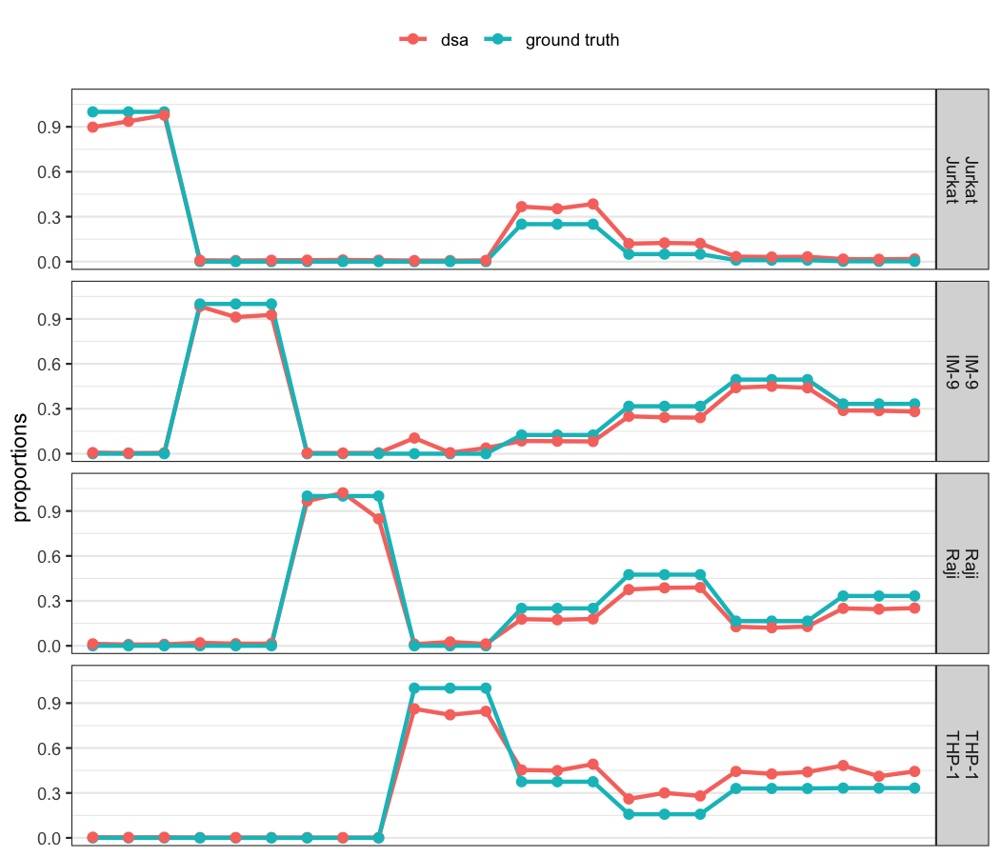

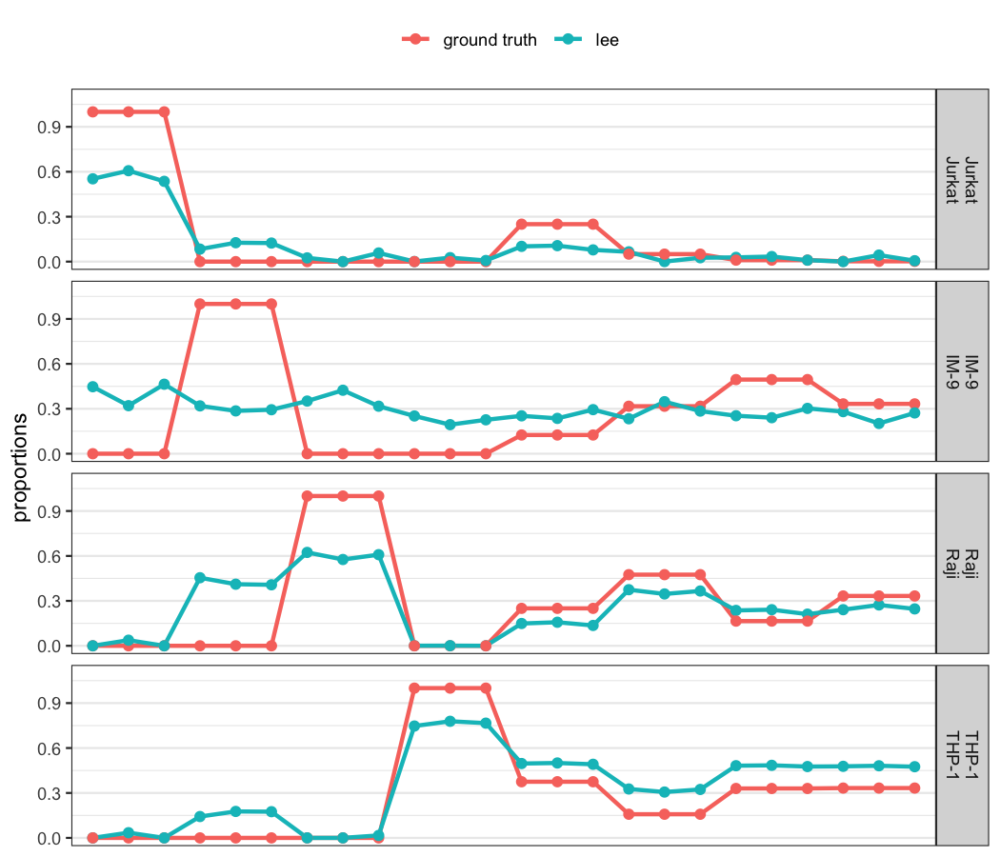

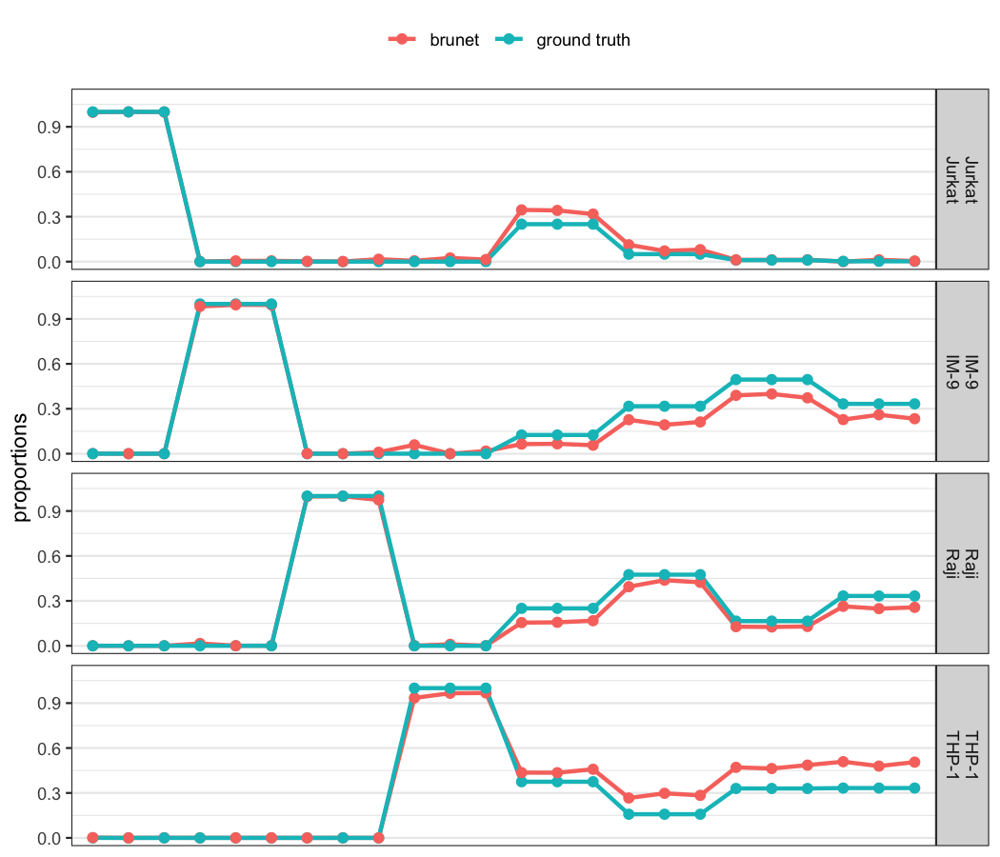

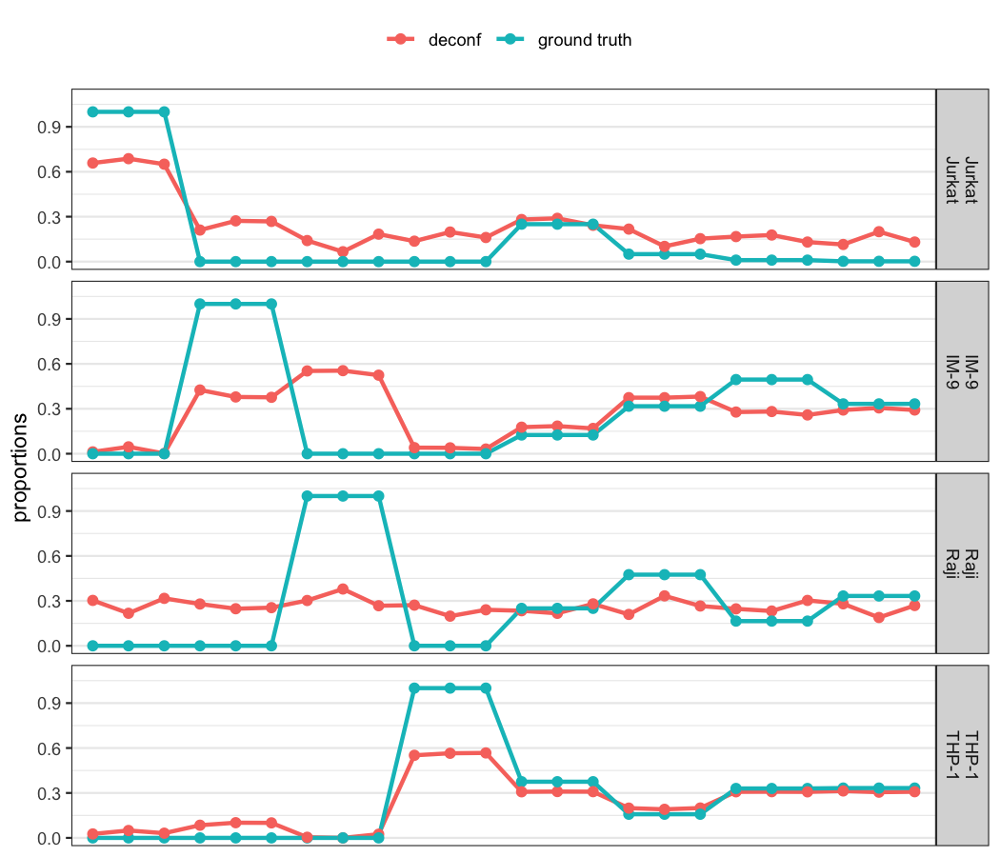

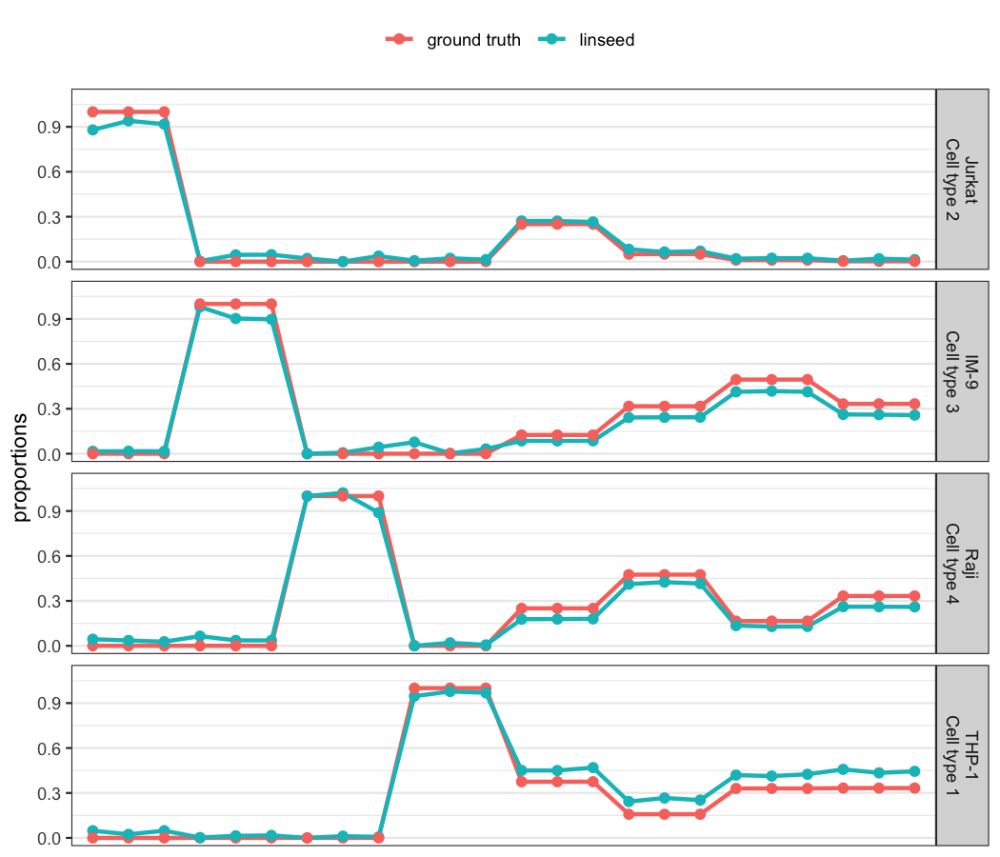

In [146]:
plots <- names(GSE11058.predictions) %>% 
    purrr::map(~ show(plotProportions(GSE11058.true, GSE11058.predictions[[.]], pnames = c("ground truth", .))))

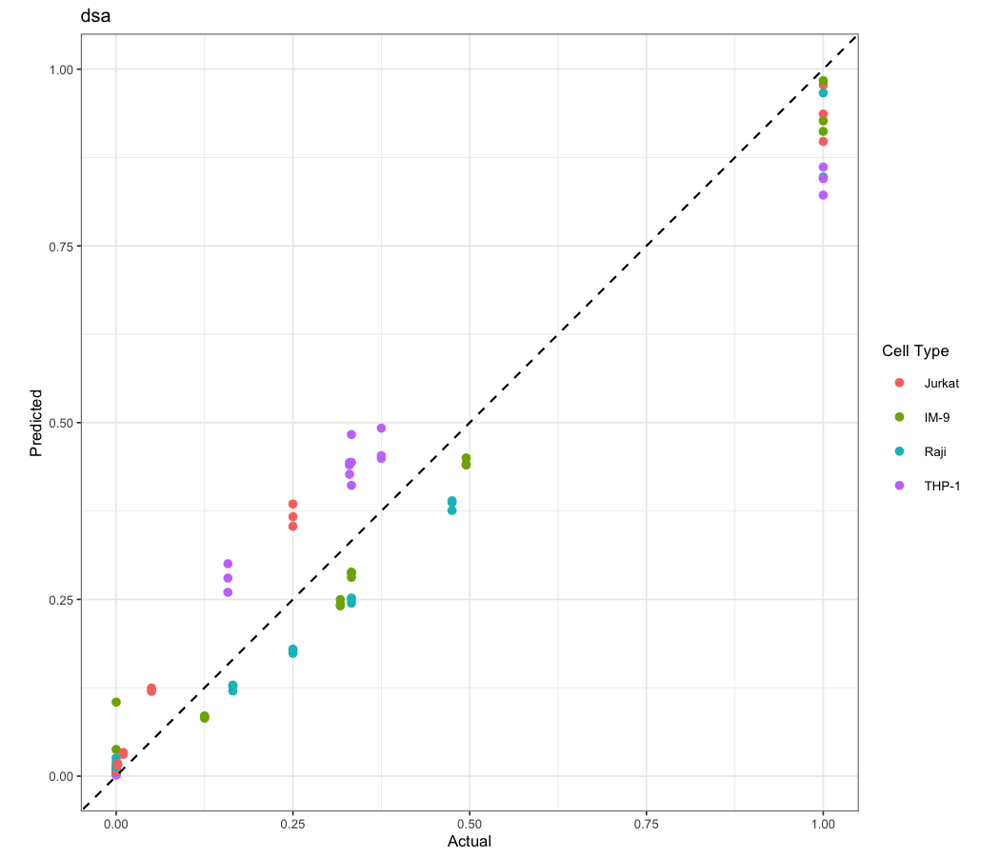

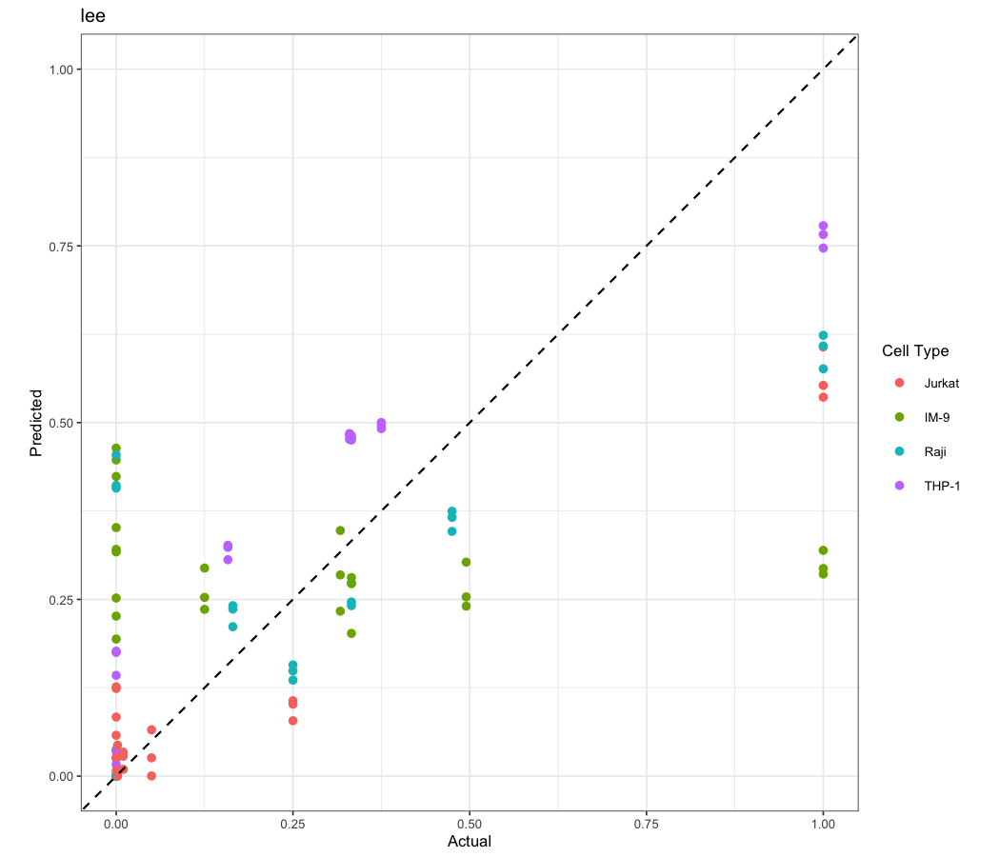

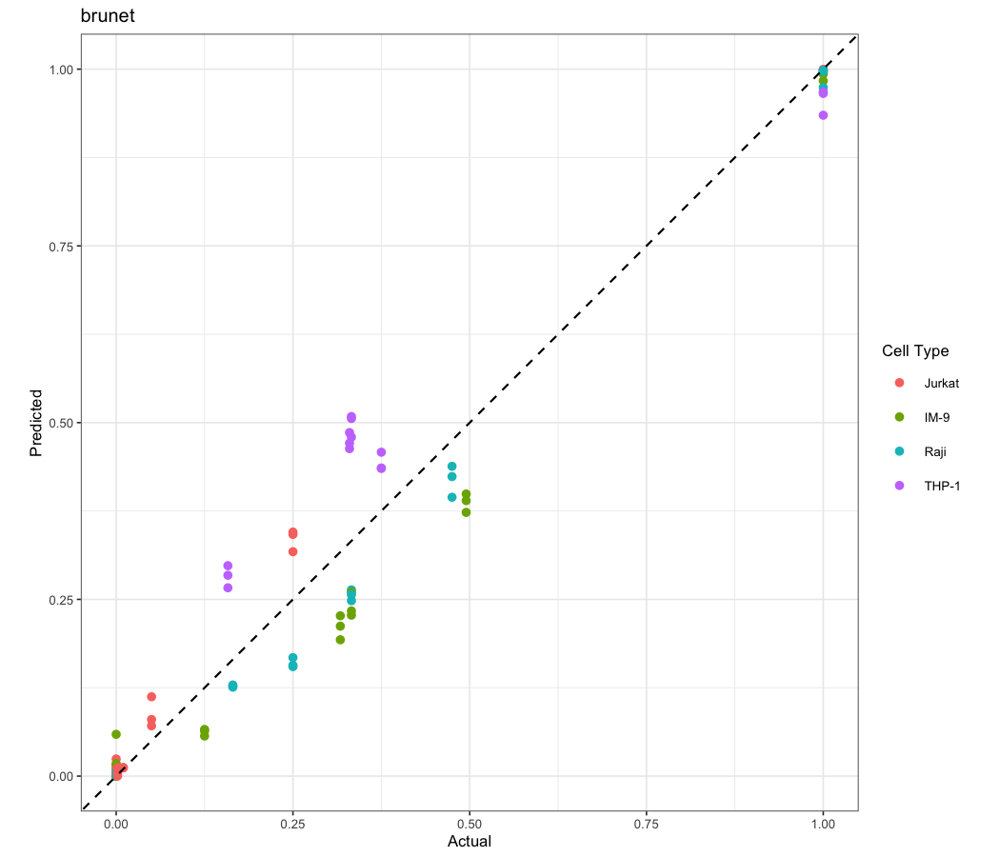

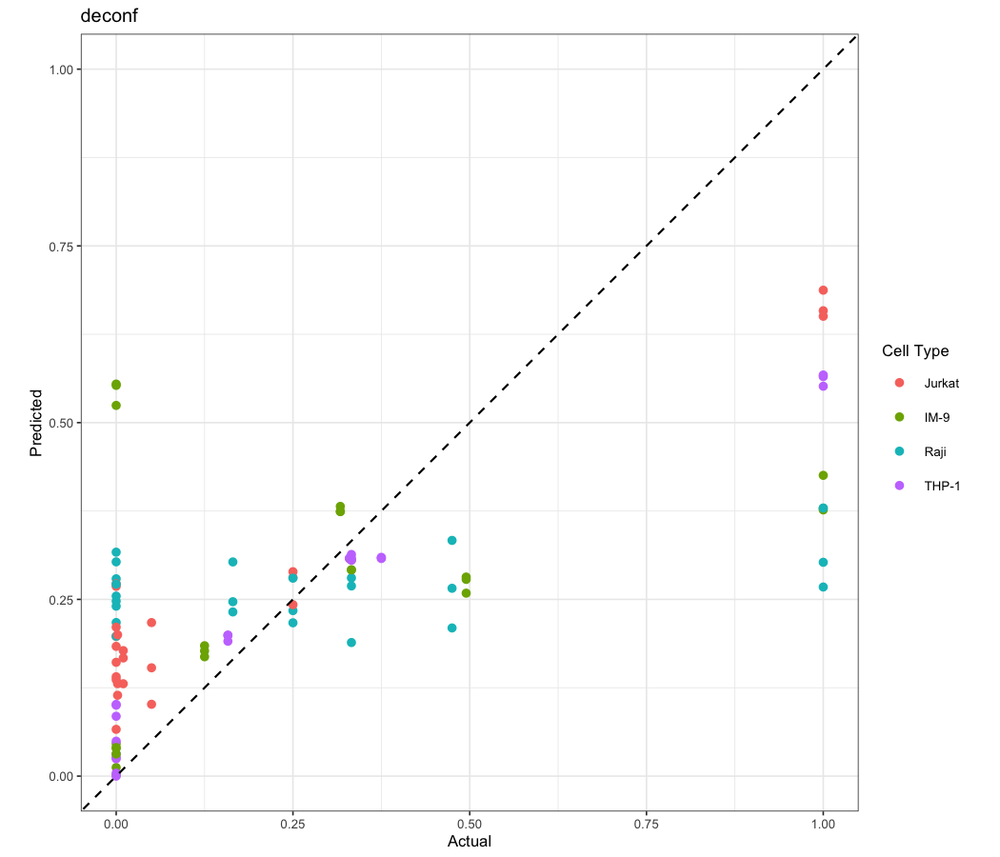

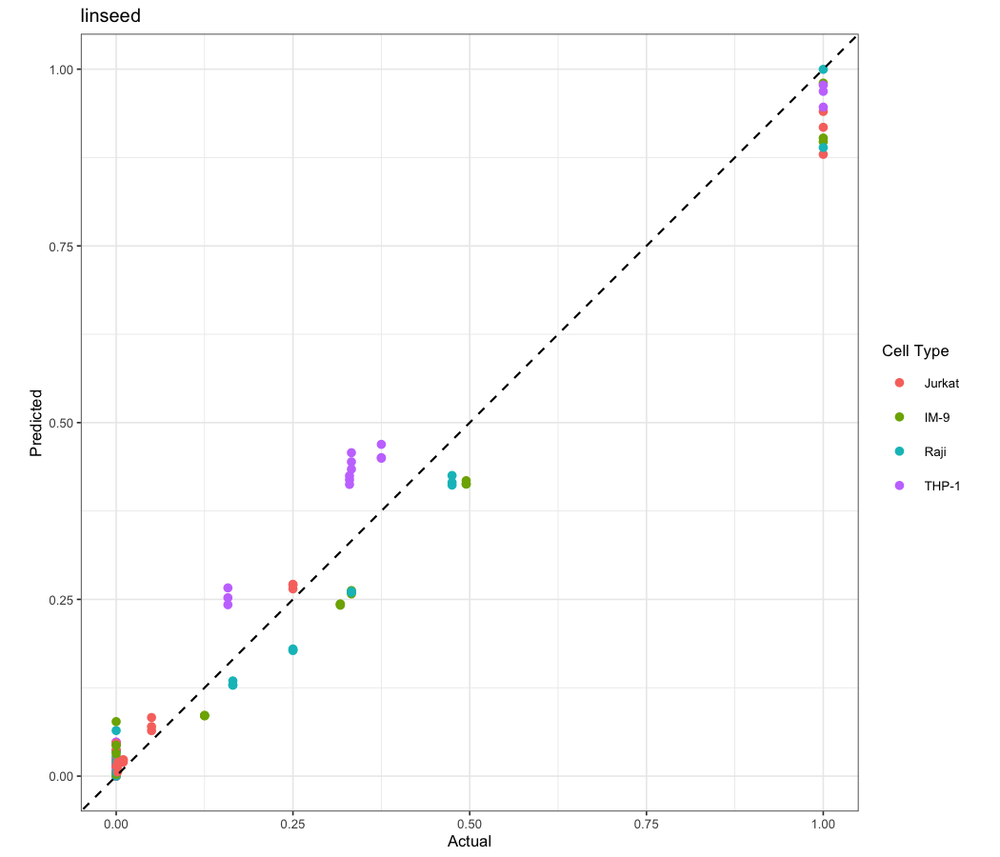

In [147]:
plots <- names(GSE11058.predictions) %>%
    purrr::map(~ show(dotPlotPropotions(GSE11058.predictions[[.]], GSE11058.true, guess=T, main = .)))

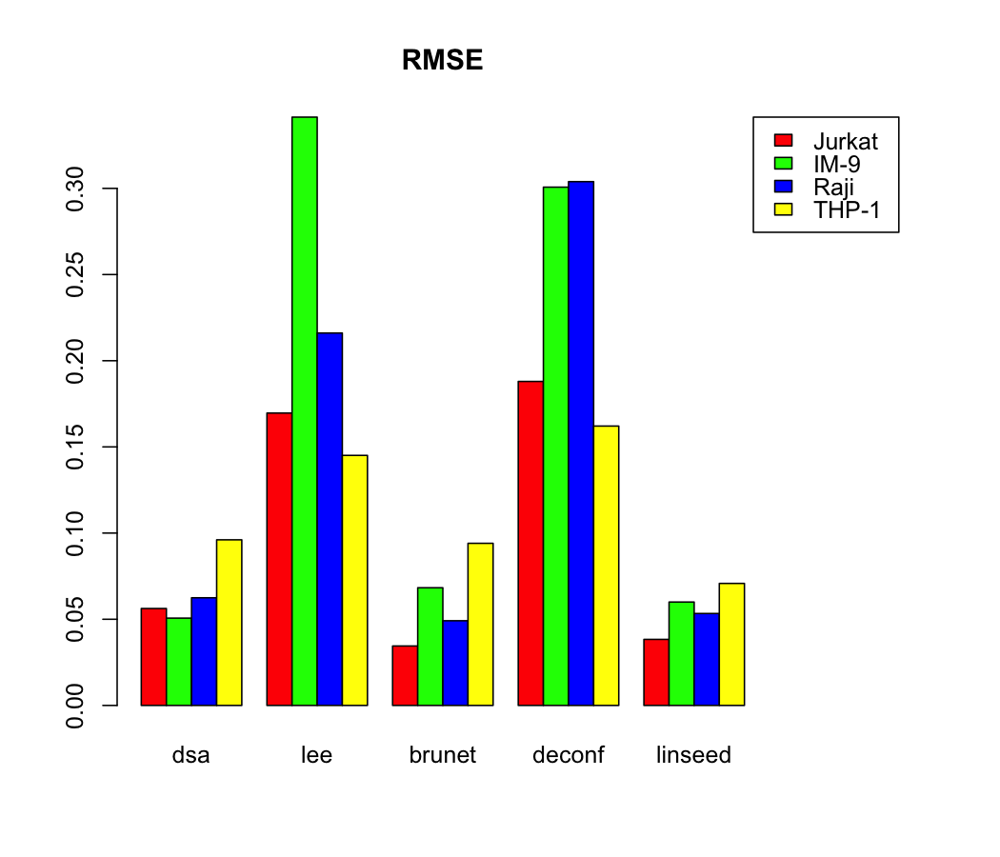

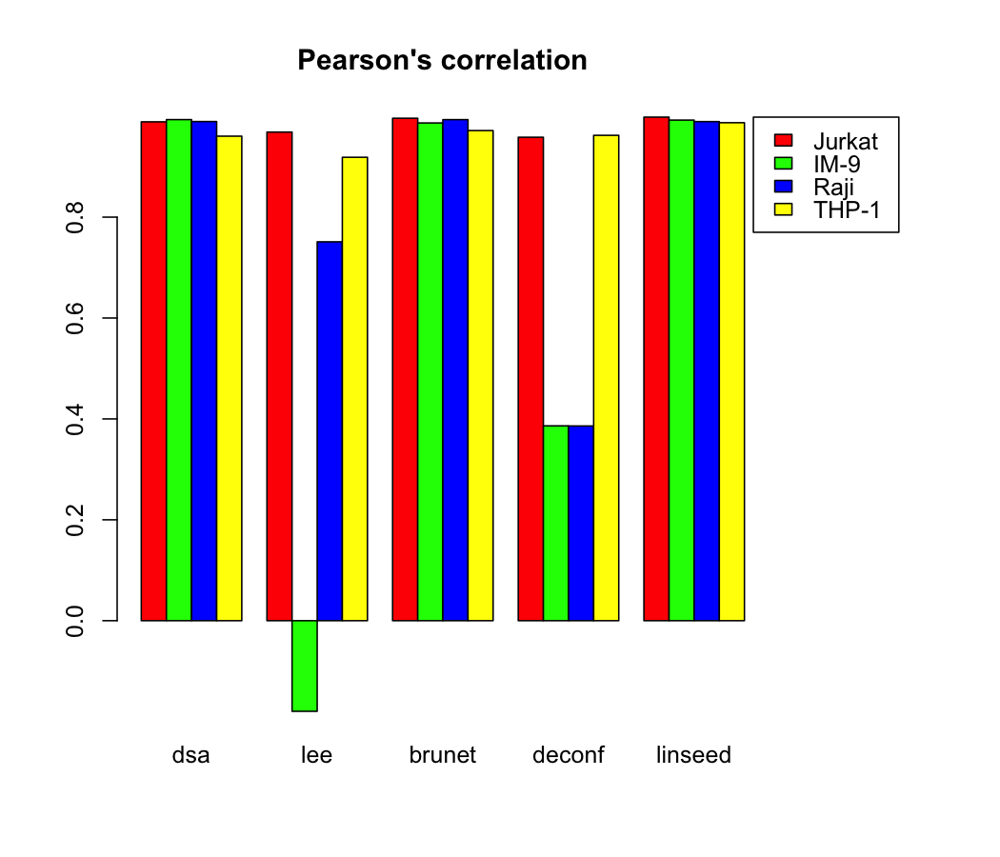

In [148]:
barplotMetric(GSE11058.predictions, GSE11058.true, Metrics::rmse, "Proportions RMSE", c("red", "green", "blue", "yellow"))
barplotMetric(GSE11058.predictions, GSE11058.true, cor, "Proportions Pearson's R", c("red", "green", "blue", "yellow"))

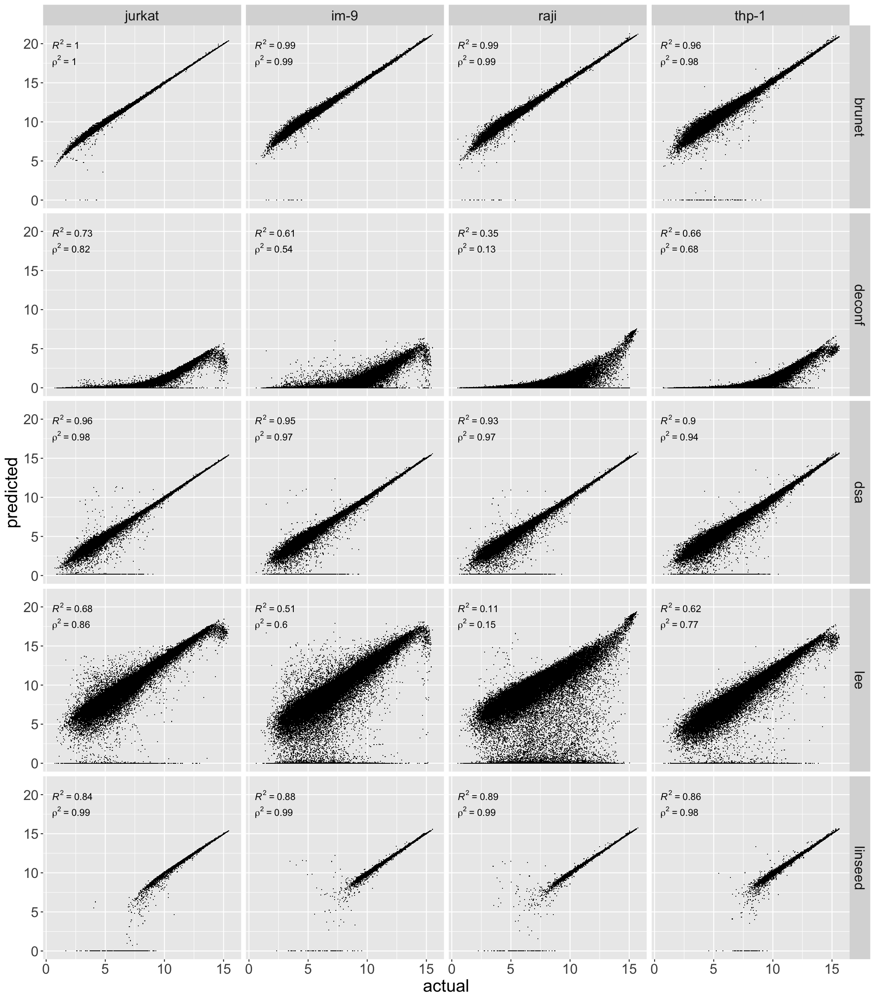

In [149]:
options(repr.plot.height = 16, repr.plot.width = 14)
GSE11058.meltedBasis <- getMeltedBasis(GSE11058.mix, GSE11058.fits, GSE11058.lo)
plotMeltedBasis(GSE11058.meltedBasis)

# Simulated data

In [8]:
options(repr.plot.height = 6, repr.plot.width = 7, repr.plot.res = 150)

In [5]:
sim.mix <- generateData(genes=12000, samples=40, cellTypes=3, noiseDeviation = 2)

In [6]:
sim.true <- sim.mix$proportions

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



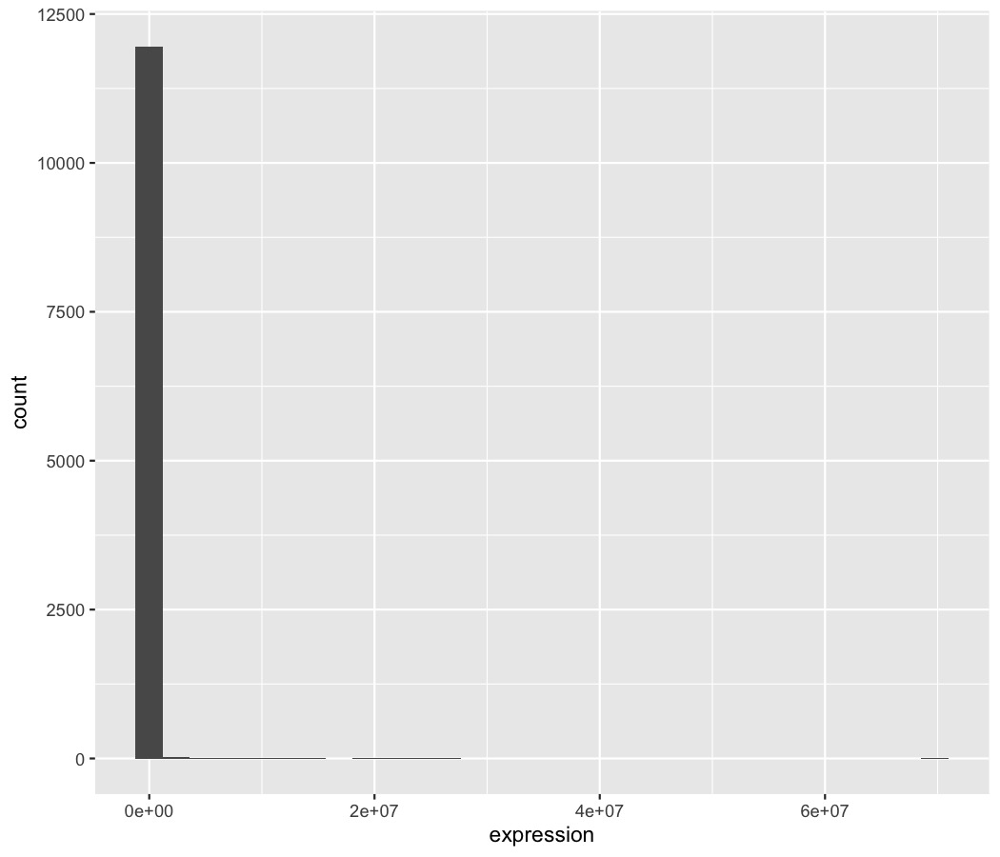

In [7]:
ggplot(data=data.frame(expression=sim.mix$data[, 1]), aes(x=expression)) + geom_histogram()

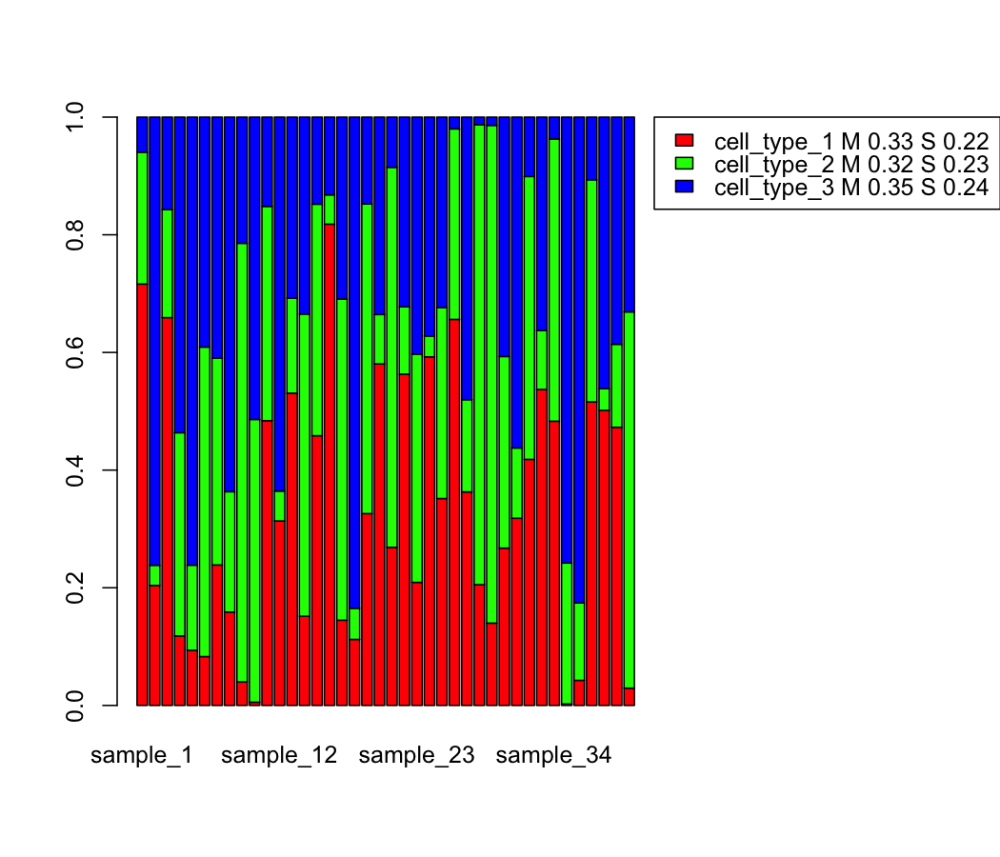

In [8]:
propplot(sim.mix$proportions)

### Differential expression markers

In [9]:
tmp <- generatePureSamples(sim.mix$basis)
sim.ps.es <- ExpressionSet(
    assayData = tmp$data,
    phenoData = AnnotatedDataFrame(as.data.frame(tmp$proportions))
)

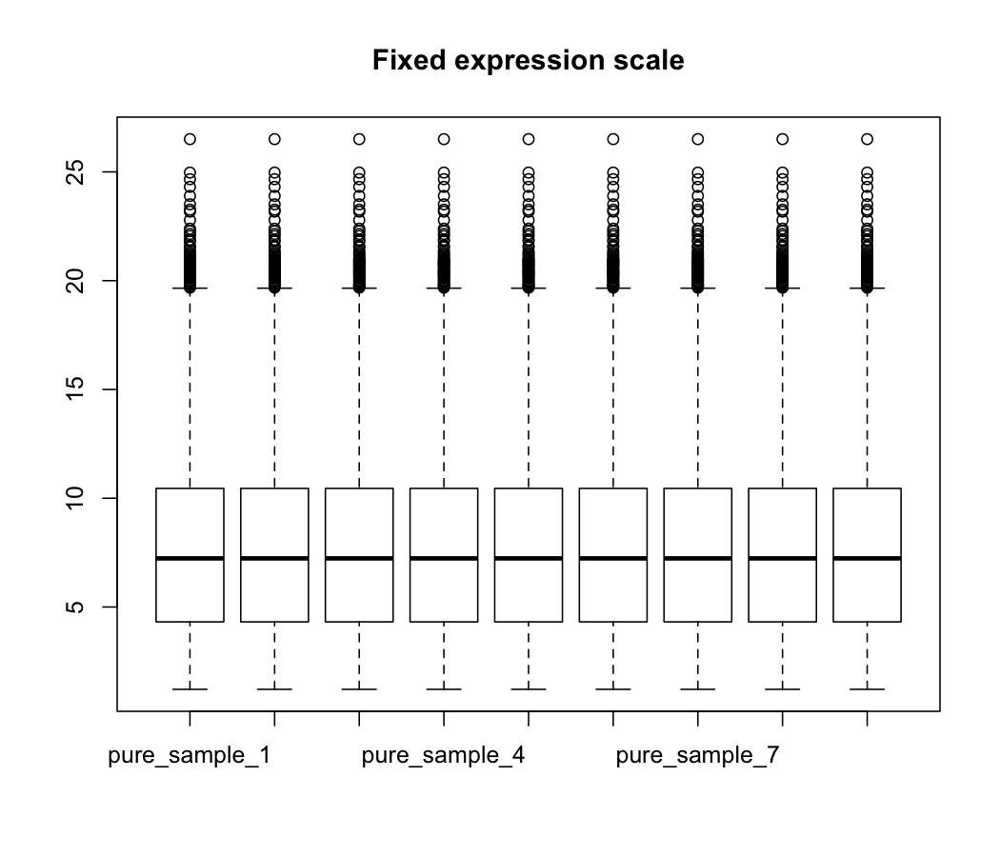

In [10]:
# Normalize and cast to log scale
exprs(sim.ps.es) <- normalizeBetweenArrays(log2(exprs(sim.ps.es) + 1), method="quantile")
boxplot(exprs(sim.ps.es), main = "Fixed expression scale")

In [11]:
# Annotate with mean expression and sort by it
fData(sim.ps.es)$mean _expression <- apply(exprs(sim.ps.es), 1, mean)
sim.ps.es <- sim.ps.es[order(fData(sim.ps.es)$mean_expression, decreasing = TRUE), ]

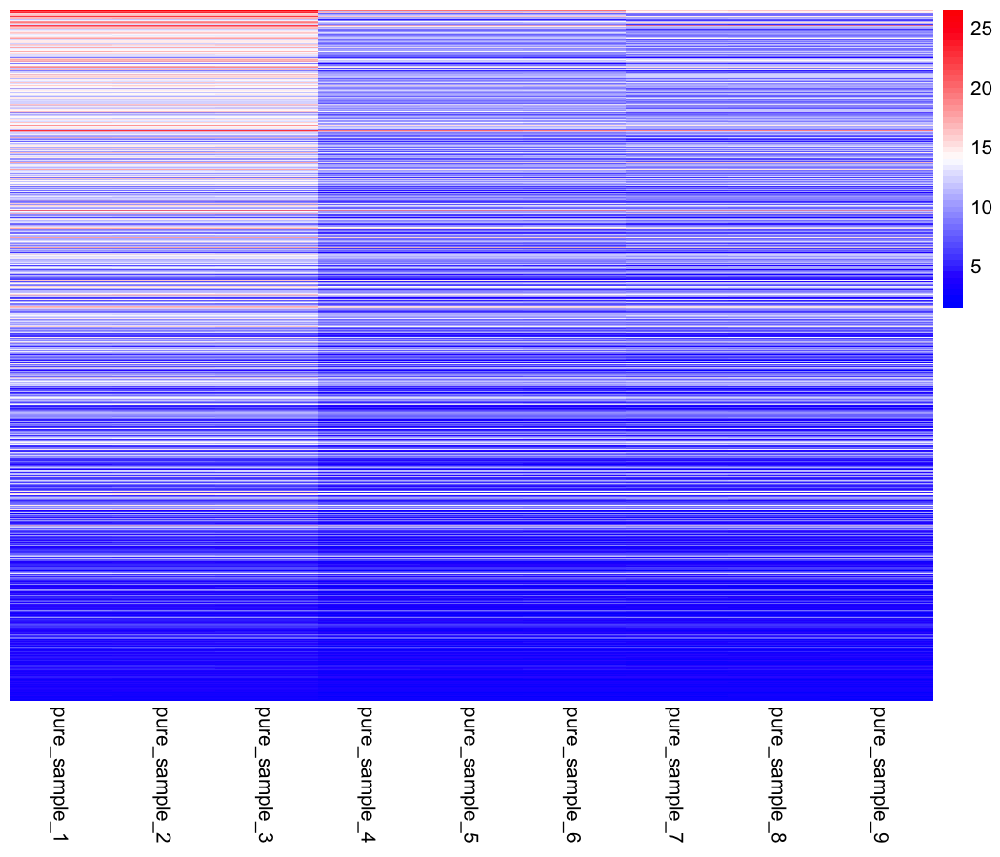

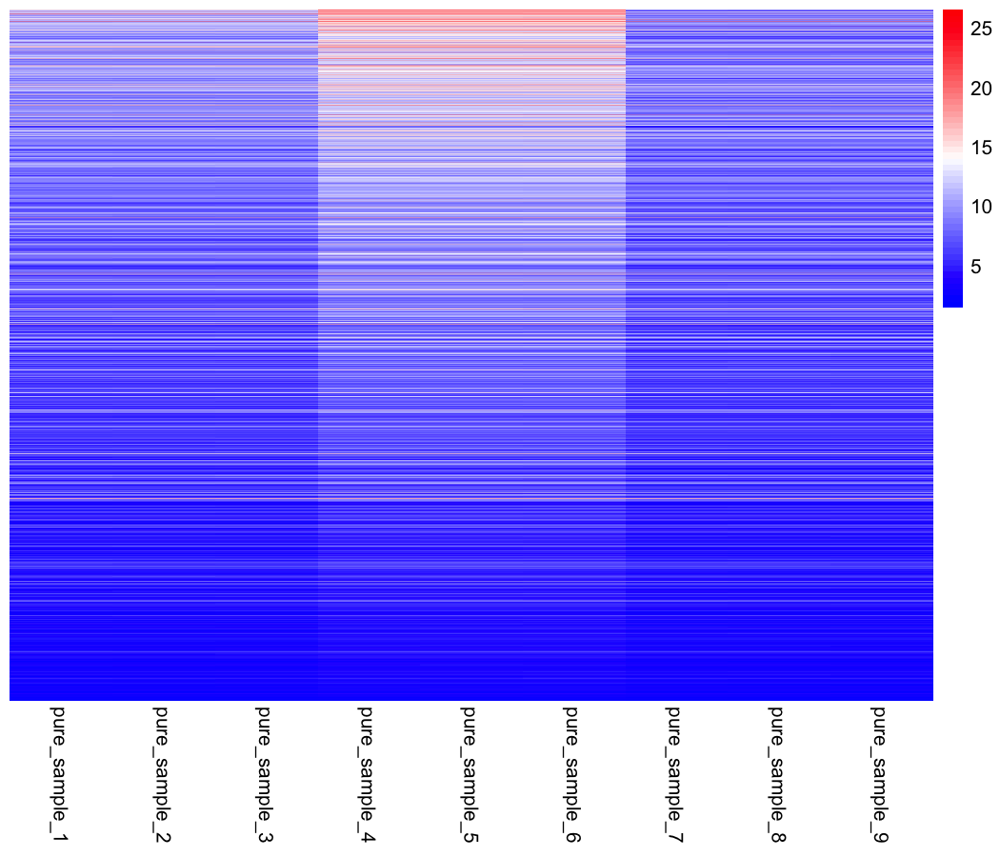

<object of class MarkerList>
Types: 3 ['cell_type_1', 'cell_type_2', 'cell_type_3'] 
Mode: numeric
Markers: 90 
IDtype: GENENAME ['gene_ 3260', 'gene_ 7247', ..., 'gene_ 936'] 
Values: [16.0854943134554, 26.5063091486507, ..., 13.2680128829815]
Breakdown:
cell_type_1 cell_type_2 cell_type_3 
         30          30          30

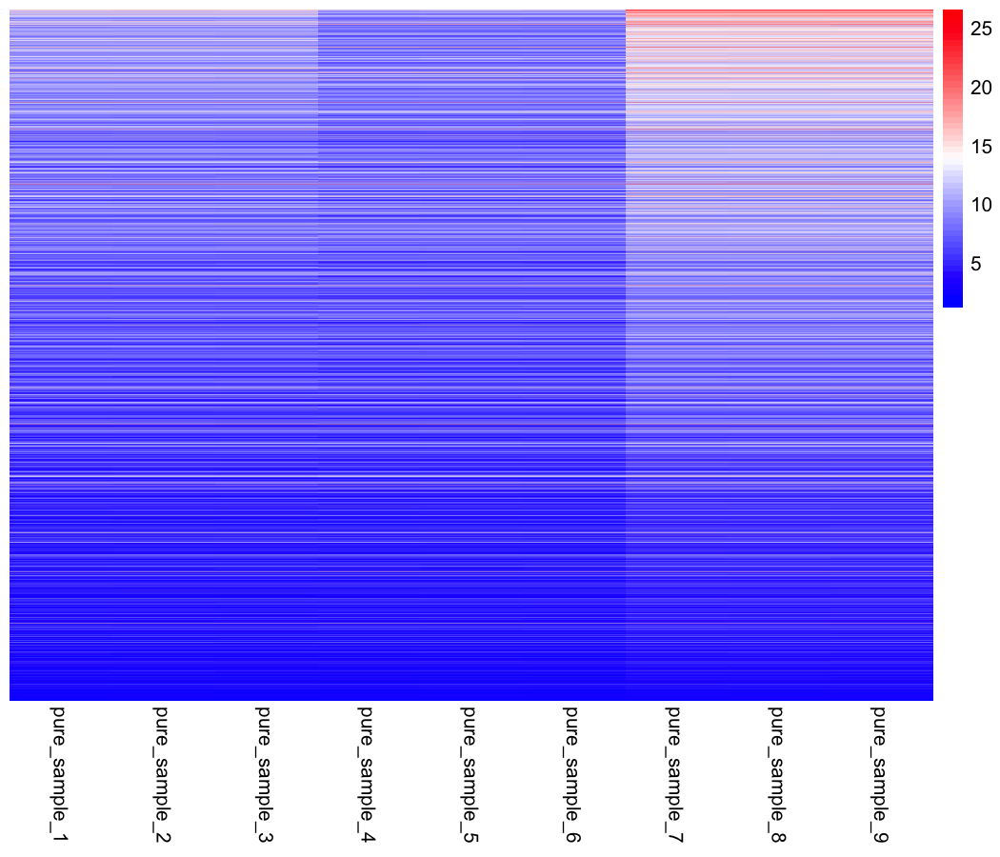

In [208]:
sim.ml.raw <- list(
    cell_type_1=getDeMarkers("cell_type_1", sim.ps.es),
    cell_type_2=getDeMarkers("cell_type_2", sim.ps.es),
    cell_type_3=getDeMarkers("cell_type_3", sim.ps.es)
)
sim.ml <- MarkerList(sim.ml.raw)
summary(sim.ml)

In [ ]:
options(repr.plot.height = 9, repr.plot.width = 12, repr.plot.res = 150)

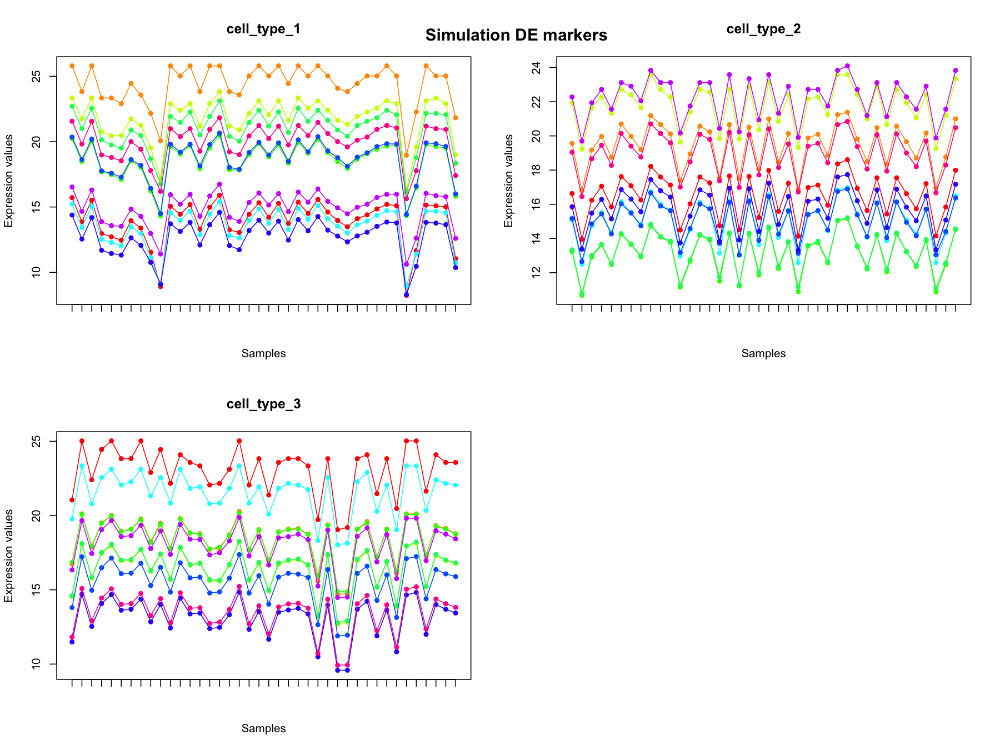

In [122]:
profplot(sim.ml[,1:10], normalizeBetweenArrays(log2(sim.mix$data + 1)))
title("Simulation DE markers in mixed samples")

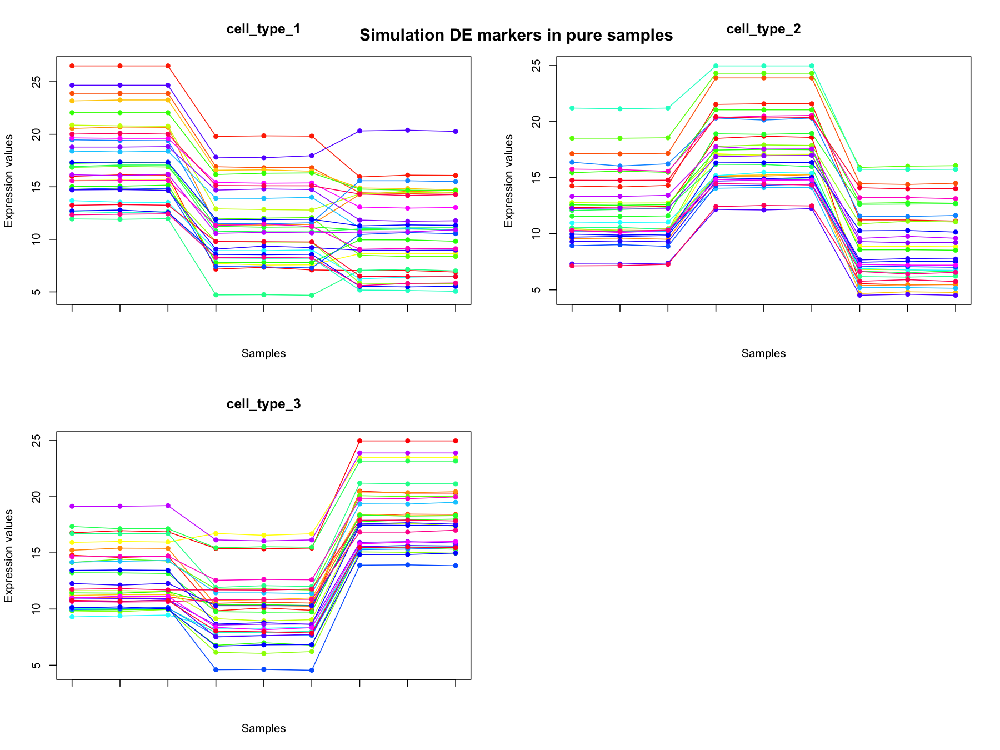

In [121]:
profplot(sim.ml, sim.ps.es)
title("Simulation DE markers in pure samples")

## Fitting models

In [151]:
options(repr.plot.height = 6, repr.plot.width = 7, repr.plot.res = 150)

In [24]:
sim.fits = list(
    dsa = ged(sim.mix$data, x = sim.ml, 'DSA', verbose = TRUE),
    lee = ged(sim.mix$data, x = 3, method = 'ssFrobenius', data = sim.ml, verbose = TRUE, sscale = FALSE),
    brunet = ged(sim.mix$data, x = 3, method = 'ssKL', verbose = TRUE, sscale = FALSE),
    deconf = ged(sim.mix$data, x = 3, method = 'deconf', verbose = TRUE)
)

Using ged algorithm: “DSA”
 Estimating basis and mixture coefficients matrices from marker features [DSA]
 Using 90/90 markers to estimate cell proportions: 
 cell_type_1 cell_type_2 cell_type_3 
          30          30          30 
  Checking data scale ...   OK [linear]
  Computing proportions using DSA method ...   OK
  Estimating basis matrix from mixture coefficients [qprog]
  Not using any marker constraints
Timing:
   user  system elapsed 
  4.124   0.249   4.386 
GED final wrap up ... OK
Using ged algorithm: “ssFrobenius”
Timing:
   user  system elapsed 
 11.716   0.210  11.937 
GED final wrap up ... OK
Using ged algorithm: “ssKL”
Timing:
   user  system elapsed 
 24.470   0.504  25.094 
GED final wrap up ... OK
Using ged algorithm: “deconf”
 Algorithm version 'fast'
Timing:
   user  system elapsed 
  1.607   0.075   1.687 
GED final wrap up ... OK



Sampling weights [---------------------------]   1% eta:  4m

Sampling weights [>--------------------------]   2% eta:  4m

Sampling weights [>--------------------------]   3% eta:  4m

Sampling weights [>--------------------------]   4% eta:  4m

Sampling weights [>--------------------------]   5% eta:  4m

Sampling weights [=>-------------------------]   6% eta:  4m

Sampling weights [=>-------------------------]   7% eta:  4m

Sampling weights [=>-------------------------]   8% eta:  4m

Sampling weights [=>-------------------------]   9% eta:  4m

Sampling weights [==>------------------------]  10% eta:  4m

Sampling weights [==>------------------------]  11% eta:  4m

Sampling weights [==>------------------------]  12% eta:  4m

Sampling weights [===>-----------------------]  13% eta:  4m

Sampling weights [===>-----------------------]  14% eta:  4m

Sampling weights [===>-----------------------]  15% eta:  4m

Sampling weights [===>-----------------------]  16% eta:  4m

Samplin

1 2 2

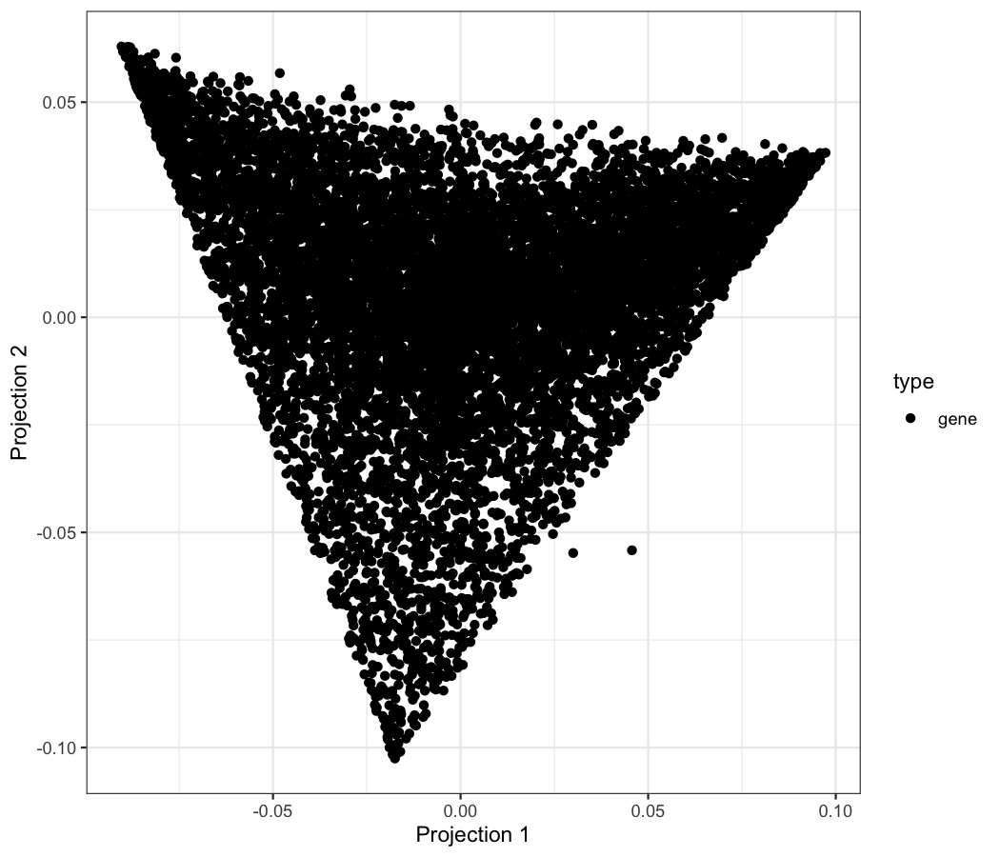

In [25]:
sim.lo <- LinseedObject$new(sim.mix$data)

sim.lo$calculatePairwiseLinearity()
sim.lo$calculateSpearmanCorrelation()
sim.lo$calculateSignificanceLevel(100)
sim.lo$filterDatasetByPval(0.01)
sim.lo$setCellTypeNumber(3)
sim.lo$project("full")
sim.lo$projectionPlot(dims=1:2)
sim.lo$project("filtered")
sim.lo$smartSearchCorners(dataset="filtered", error="norm")
sim.lo$deconvolveByEndpoints(dataset="full", error="raw")

In [26]:
sim.predictions <- purrr::map(
    sim.fits, . %>%
        .coef %>%
        .[guessOrder(., sim.true),] %>%
        `rownames<-`(rownames(sim.true))
)

sim.predictions$linseed <- sim.lo$proportions[guessOrder(sim.lo$proportions, sim.true),]

## Compare predictions

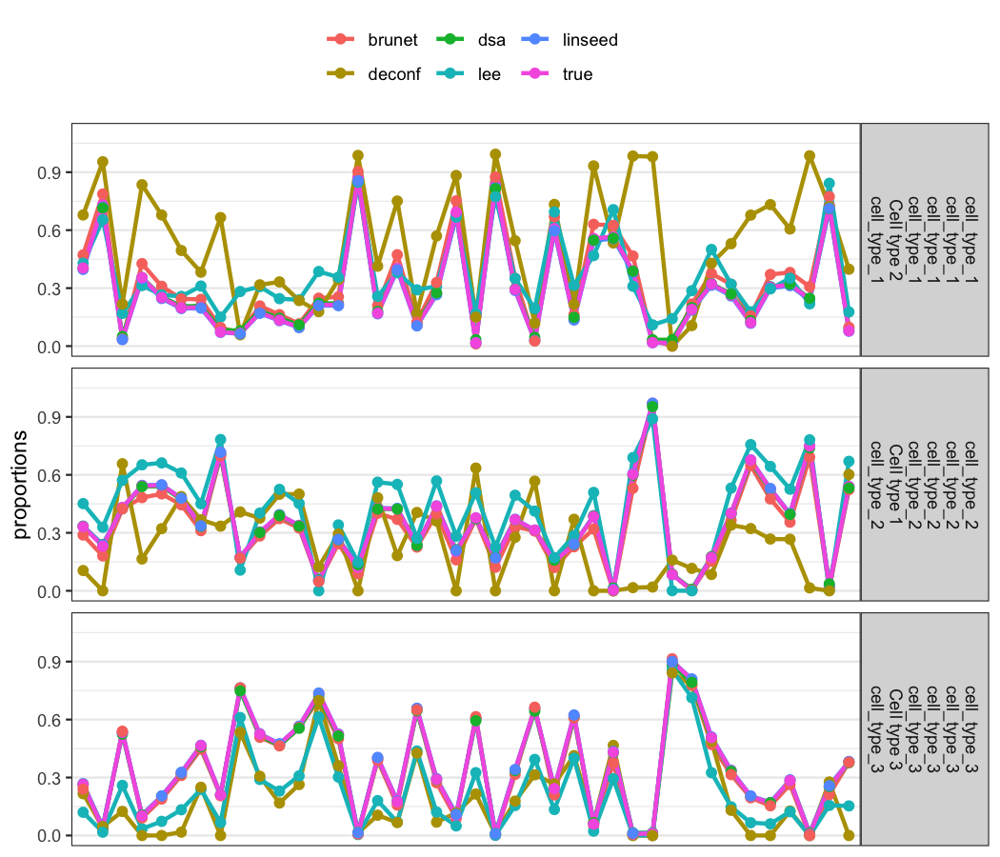

In [93]:
sim.proportions <- c(sim.predictions, true = list(sim.true))
do.call(plotProportions, c(sim.proportions, pnames = list(names(sim.proportions))))

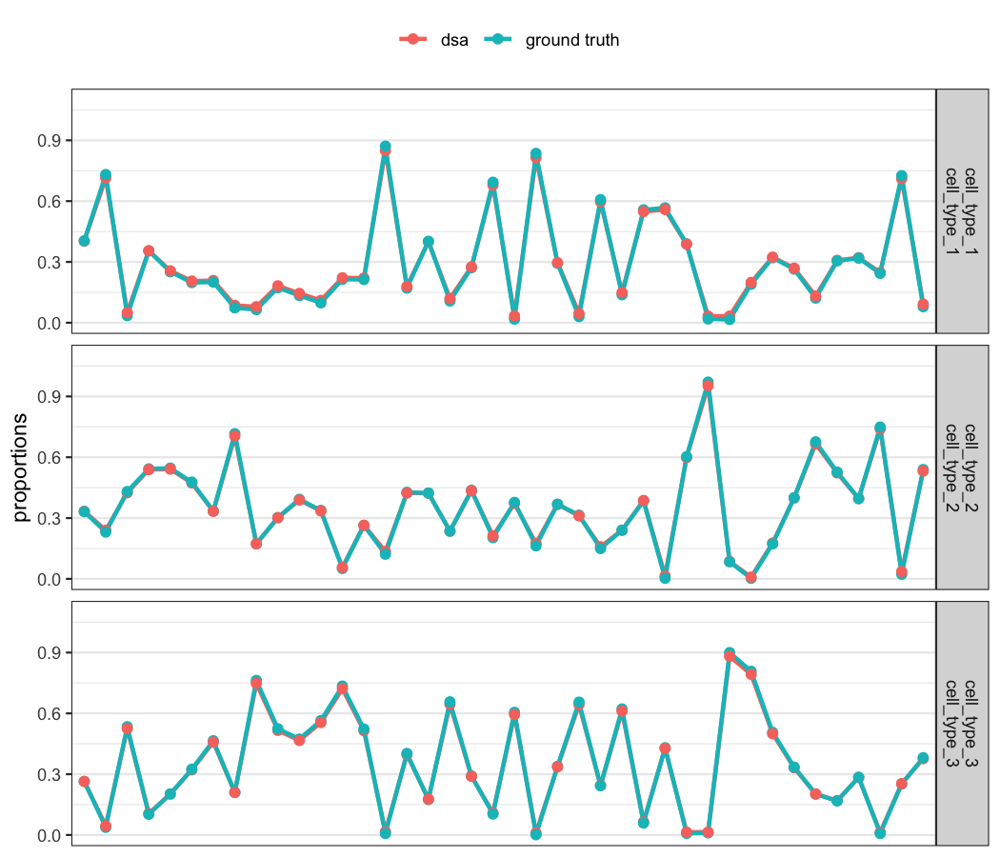

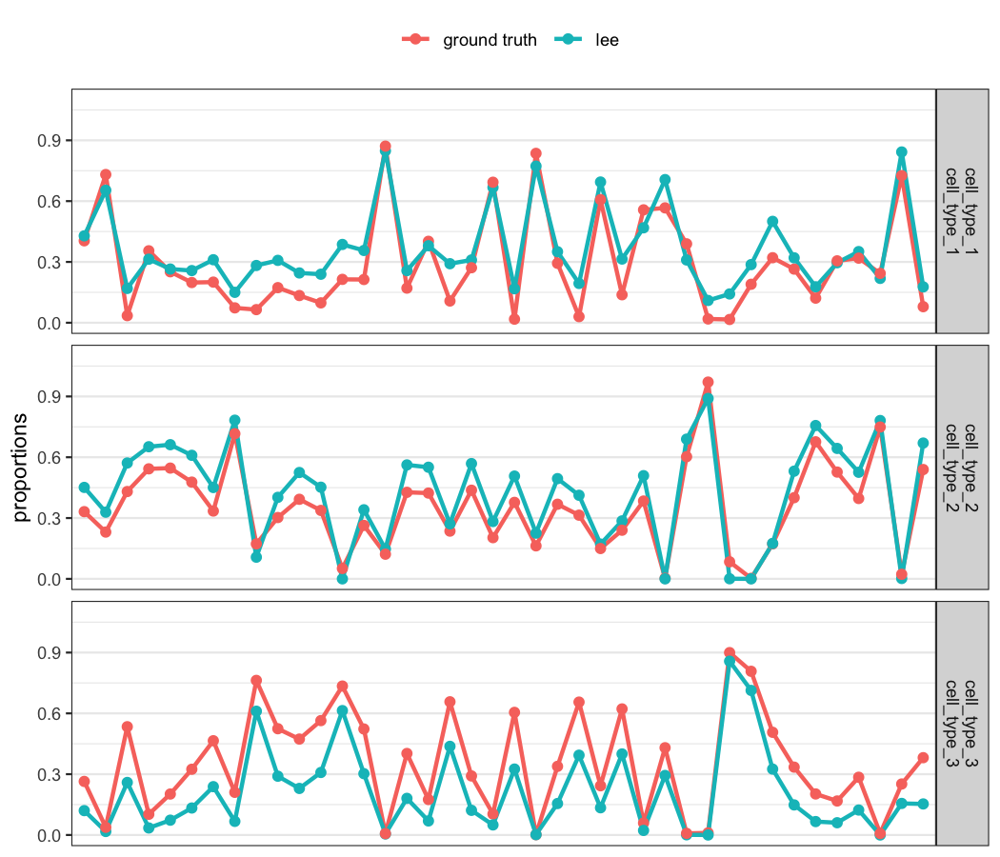

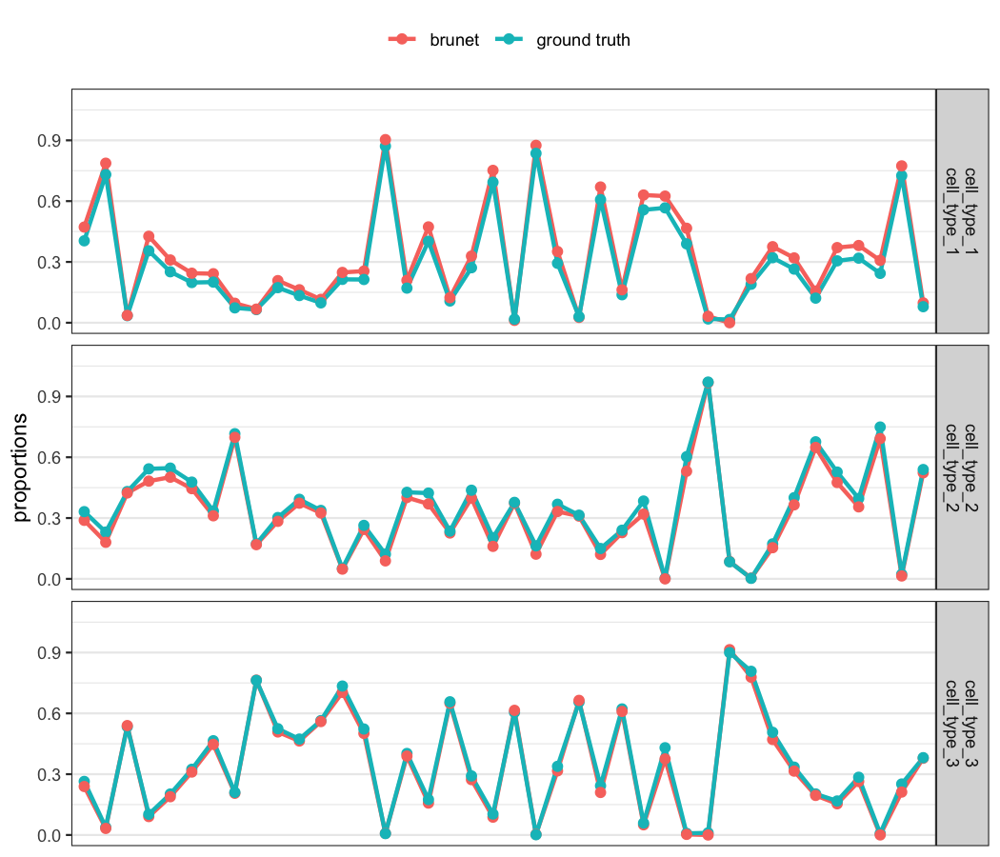

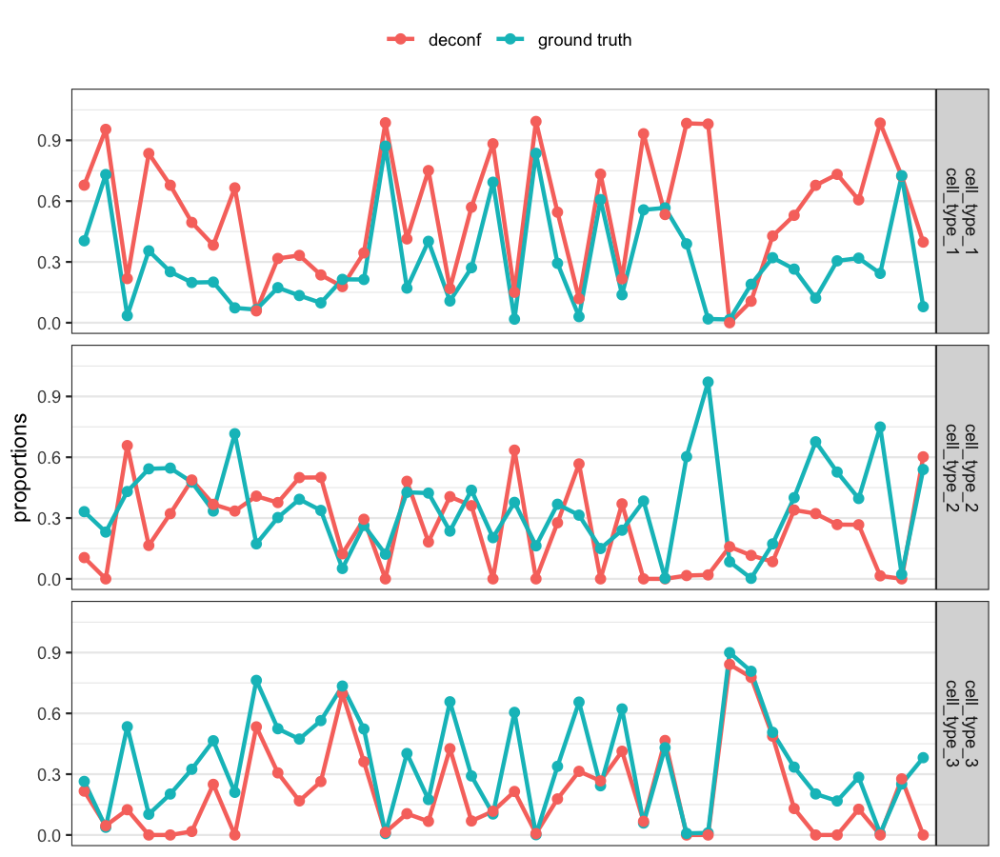

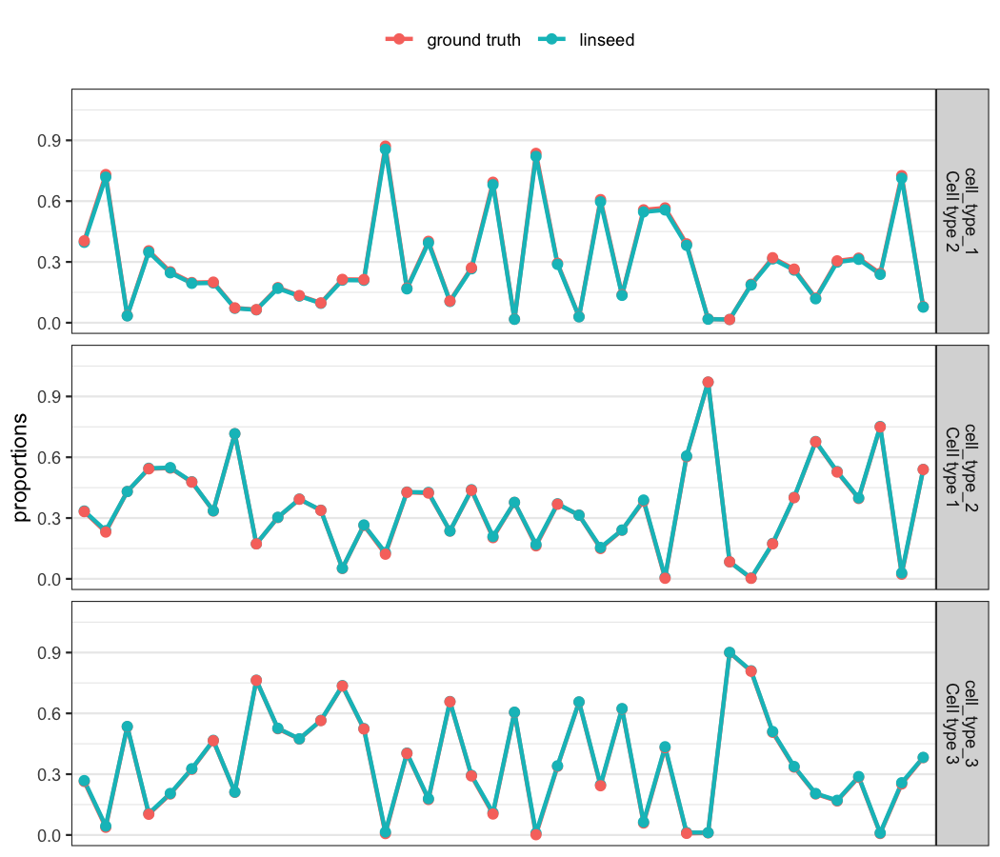

In [94]:
plots <- names(sim.predictions) %>% 
    purrr::map(~ show(plotProportions(sim.true, sim.predictions[[.]], pnames = c("ground truth", .))))

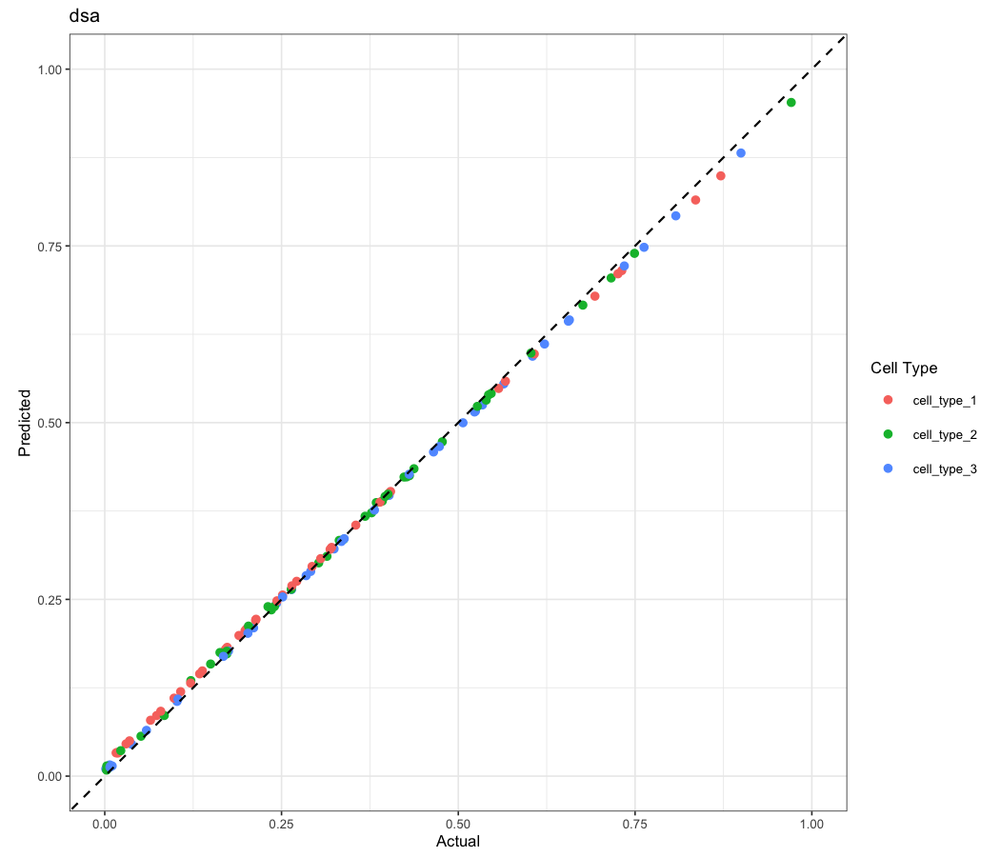

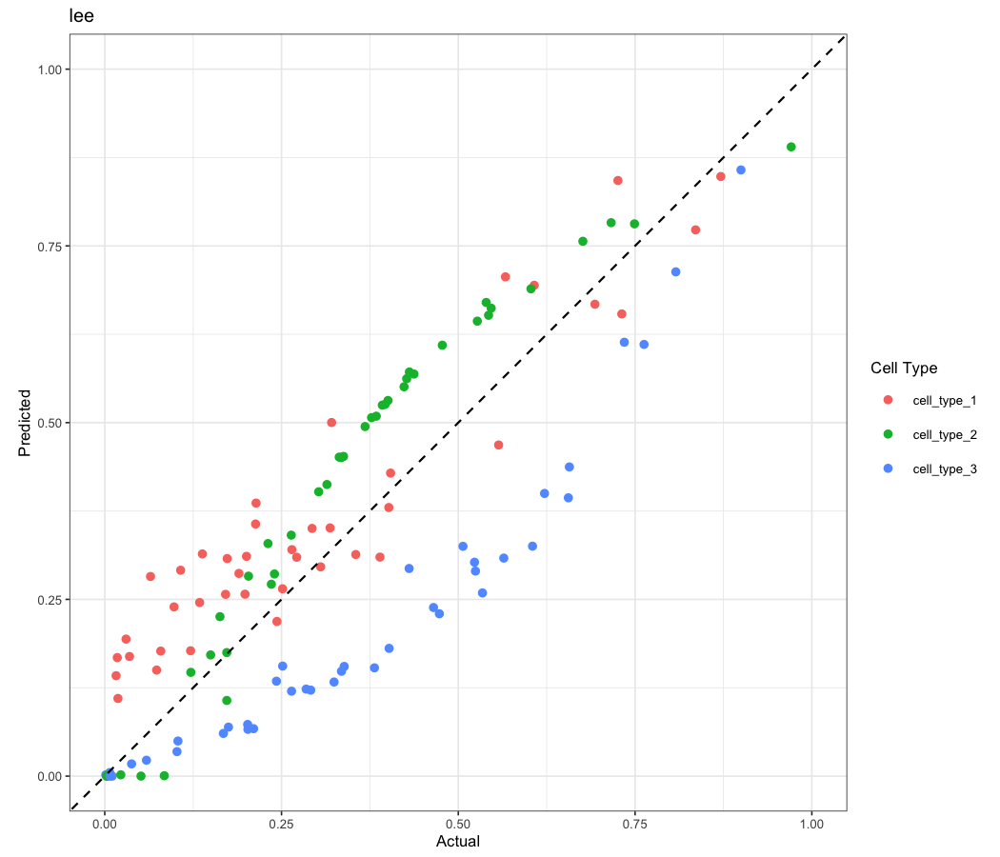

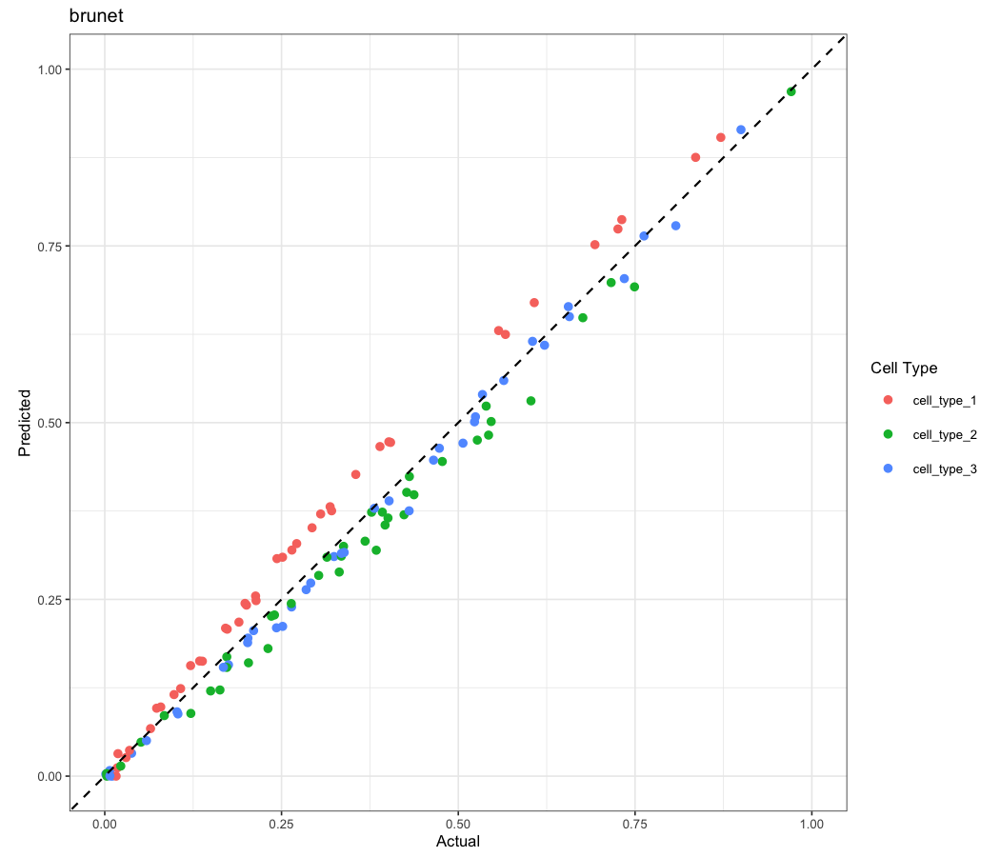

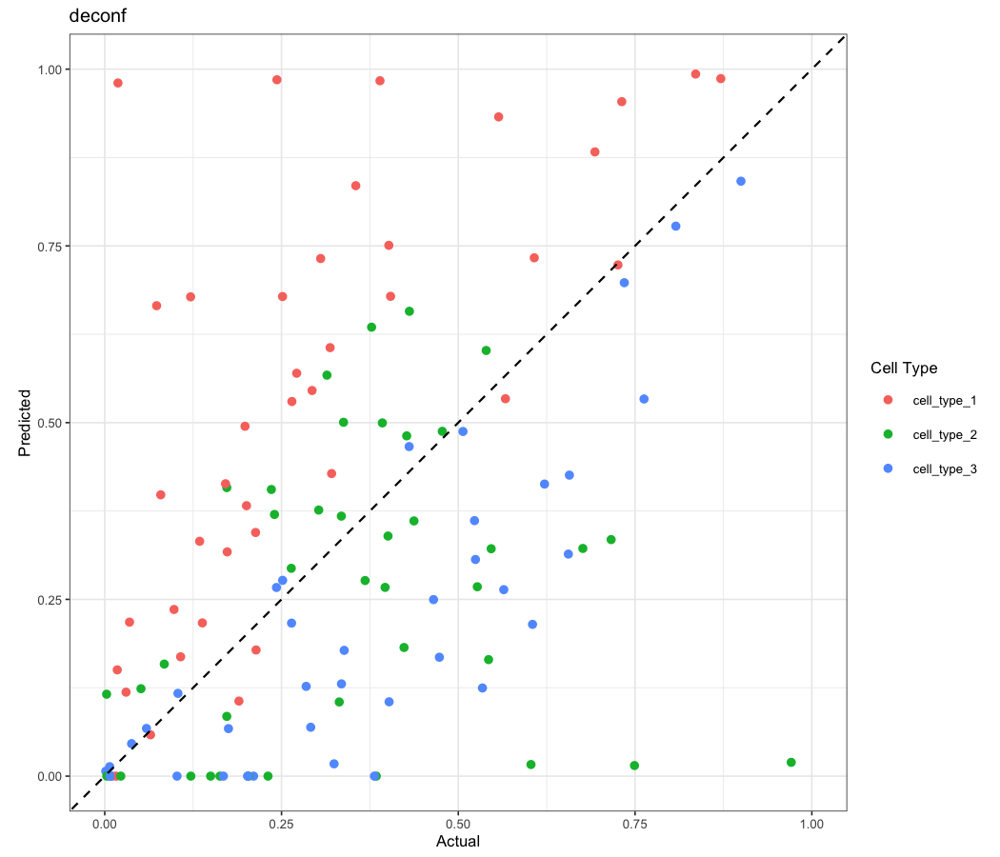

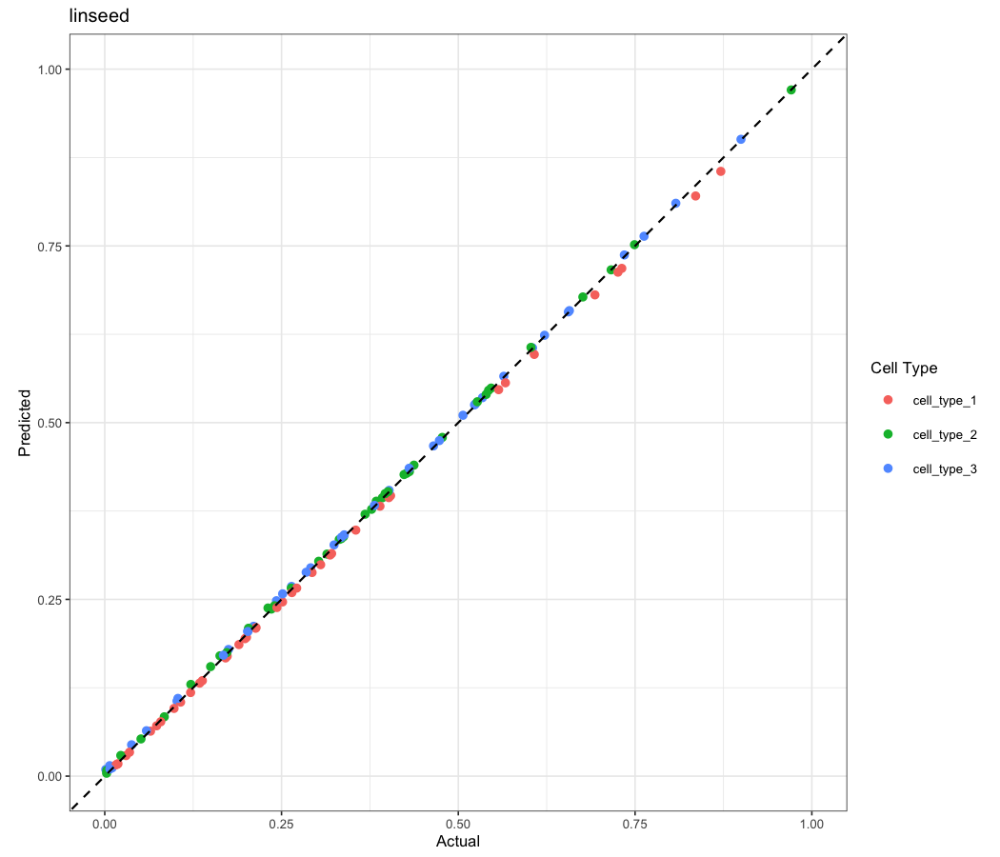

In [95]:
plots <- names(sim.predictions) %>%
    purrr::map(~ show(dotPlotPropotions(sim.predictions[[.]], sim.true, guess=T, main = .)))

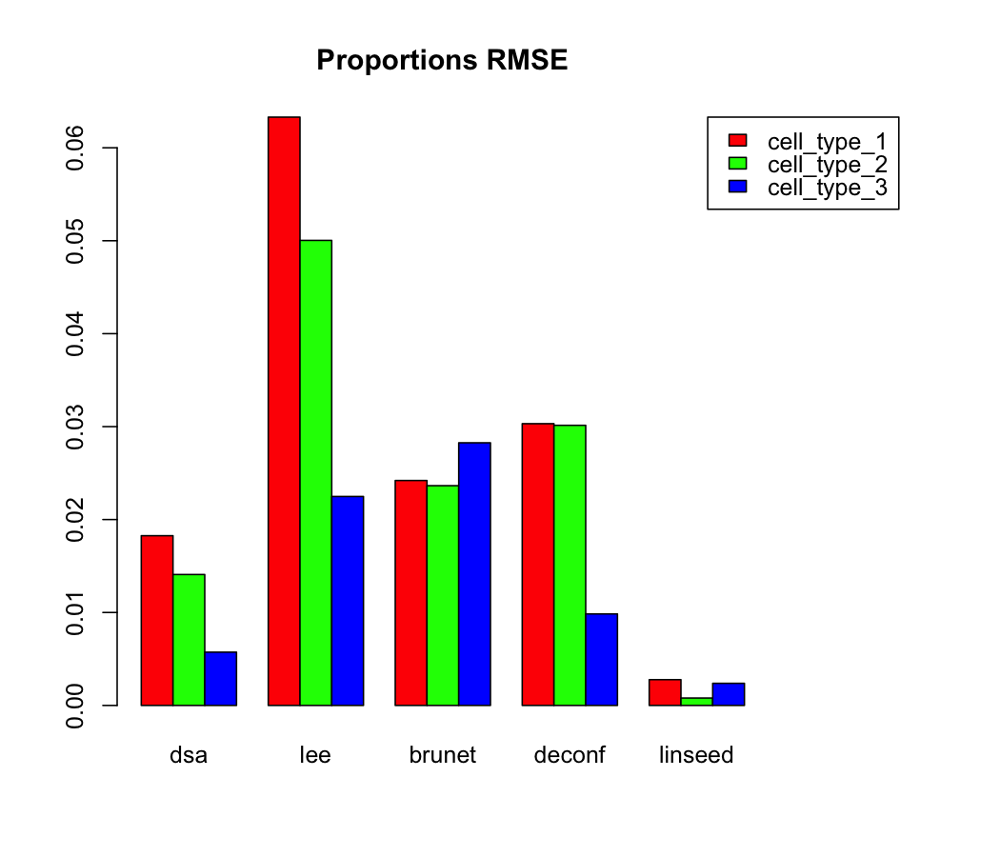

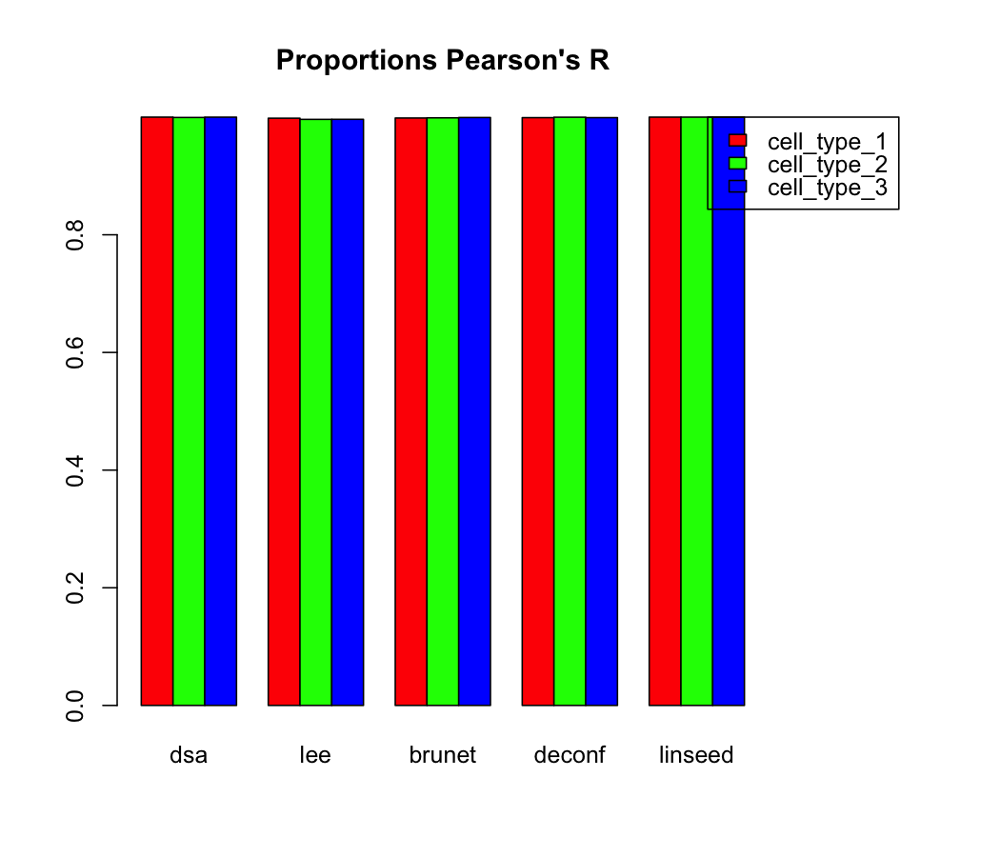

In [152]:
barplotMetric(sim.predictions, sim.true, Metrics::rmse, "Proportions RMSE", c("red", "green", "blue"))
barplotMetric(sim.predictions, sim.true, cor, "Proportions Pearson's R", c("red", "green", "blue"))

Warning message in melt(dp, id.vars = "gene", variable.name = "tissue", value.name = "predicted"):
“The melt generic in data.table has been passed a data.frame and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is deprecated, and this redirection is now deprecated as well. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace like reshape2::melt(dp). In the next version, this warning will become an error.”
Warning message in melt(da, id.vars = "gene", variable.name = "tissue", value.name = "actual"):
“The melt generic in data.table has been passed a data.frame and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is deprecated, and this redirection is now deprecated as well. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace like reshape2::melt(da). In the next version, t

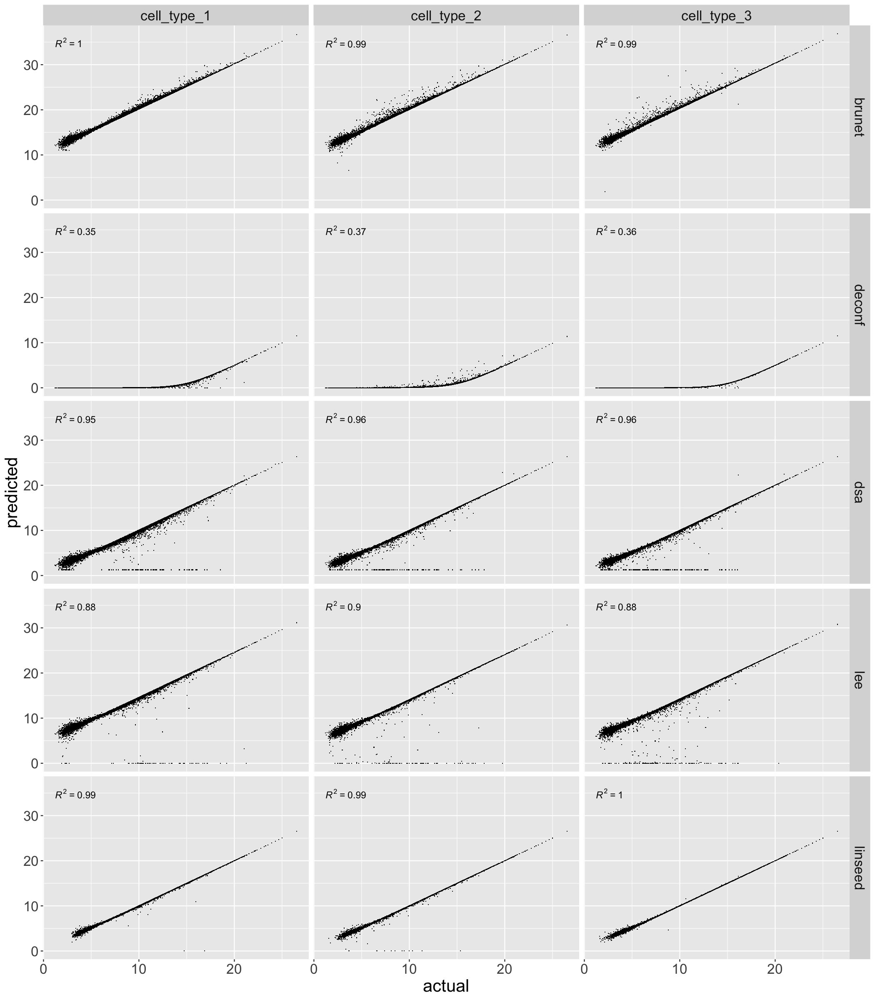

In [28]:
options(repr.plot.height = 16, repr.plot.width = 14)
sim.meltedBasis <- getMeltedBasis(sim.mix, sim.fits, sim.lo)
plotMeltedBasis(sim.meltedBasis)

In [61]:
stopCluster(cl)

## Old plots

Warning message in melt(model_rmses, id.vars = "noise", value.name = "RMSE", variable.name = "model"):
“The melt generic in data.table has been passed a data.frame and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is deprecated, and this redirection is now deprecated as well. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace like reshape2::melt(model_rmses). In the next version, this warning will become an error.”


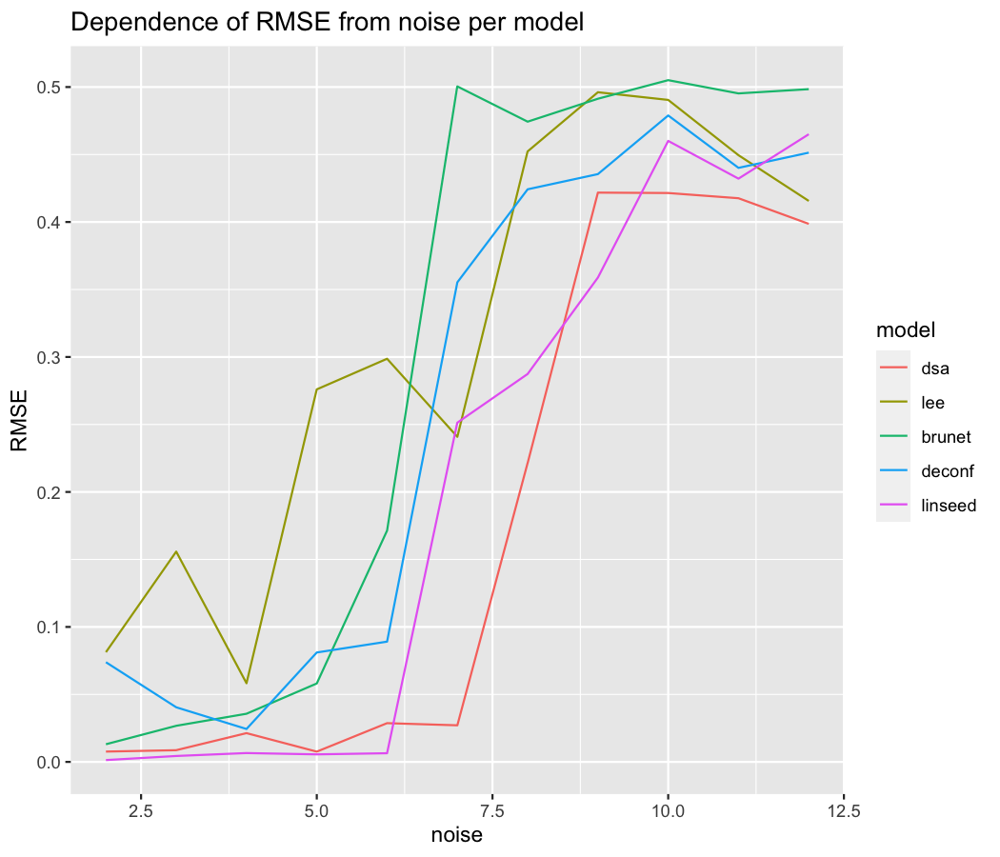

In [54]:
ggplot(
    melt(model_rmses, id.vars = "noise", value.name = "RMSE", variable.name = "model"),
    aes(noise, RMSE, col = model)
) + geom_line() + ggtitle("RMSE dependency from noise per model")

Warning message in melt(model_r2s, id.vars = "noise", value.name = "R2", variable.name = "model"):
“The melt generic in data.table has been passed a data.frame and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is deprecated, and this redirection is now deprecated as well. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace like reshape2::melt(model_r2s). In the next version, this warning will become an error.”


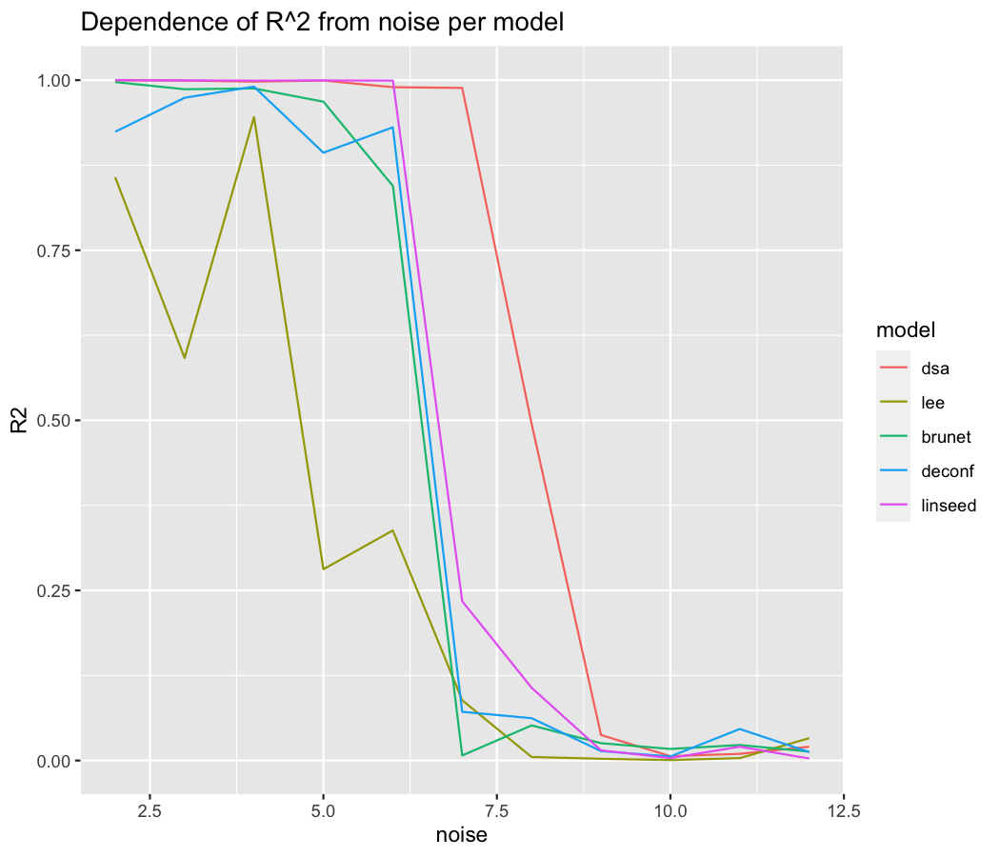

In [55]:
ggplot(
    melt(model_r2s, id.vars = "noise", value.name = "R2", variable.name = "model"),
    aes(noise, R2, col = model)
) + geom_line() + ggtitle("R^2 dependency from noise per model")